In [1]:
import numpy as np
import time
import argparse
import pickle
import torch
import torch.optim as optim
import torch.nn.functional as F
from scipy.sparse import coo_matrix
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(torch.cuda.is_available())


gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

import sys
import logging
import numpy as np


def get_logger(filename):
    # Logging configuration: set the basic configuration of the logging system
    log_formatter = logging.Formatter(fmt='%(asctime)s [%(processName)s, %(process)s] [%(levelname)-5.5s]  %(message)s',
                                      datefmt='%m-%d %H:%M')
    logger = logging.getLogger()
    logger.setLevel(logging.DEBUG)
    # File logger
    file_handler = logging.FileHandler("{}.log".format(filename))
    file_handler.setFormatter(log_formatter)
    file_handler.setLevel(logging.DEBUG)
    logger.addHandler(file_handler)
    # Stderr logger
    std_handler = logging.StreamHandler(sys.stdout)
    std_handler.setFormatter(log_formatter)
    std_handler.setLevel(logging.DEBUG)
    logger.addHandler(std_handler)
    return logger


def data_loader(inputs, targets, batch_size, shuffle=True):
    assert inputs.shape[0] == targets.shape[0]
    inputs_size = inputs.shape[0]
    if shuffle:
        random_order = np.arange(inputs_size)
        np.random.shuffle(random_order)
        inputs, targets = inputs[random_order, :], targets[random_order]
    num_blocks = int(inputs_size / batch_size)
    for i in range(num_blocks):
        yield inputs[i * batch_size: (i+1) * batch_size, :], targets[i * batch_size: (i+1) * batch_size]
    if num_blocks * batch_size != inputs_size:
        yield inputs[num_blocks * batch_size:, :], targets[num_blocks * batch_size:]


def multi_data_loader(inputs, targets, batch_size, shuffle=True):
    """
    Both inputs and targets are list of numpy arrays, containing instances and labels from multiple sources.
    """
    assert len(inputs) == len(targets)
    input_sizes = [data.shape[0] for data in inputs]
    max_input_size = max(input_sizes)
    num_domains = len(inputs)
    if shuffle:
        for i in range(num_domains):
            r_order = np.arange(input_sizes[i])
            np.random.shuffle(r_order)
            inputs[i], targets[i] = inputs[i][r_order, :], targets[i][r_order]
    num_blocks = int(max_input_size / batch_size)
    for j in range(num_blocks):
        xs, ys = [], []
        for i in range(num_domains):
            ridx = np.random.choice(input_sizes[i], batch_size)
            xs.append(inputs[i][ridx, :])
            ys.append(targets[i][ridx])
        yield xs, ys

from google.colab import drive
drive.mount('/content/drive')

True
Sun Aug 28 00:49:43 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P0    30W / 250W |      2MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+--

In [2]:
from sklearn.metrics import  zero_one_loss,mean_absolute_error,r2_score, mean_squared_error
from math import sqrt
def get_mae(target, prediction):
    assert (target.shape == prediction.shape)

    return mean_absolute_error(target, prediction)

def get_mse(target, prediction):
    assert (target.shape == prediction.shape)

    return mean_squared_error(target, prediction)

def get_sae(target, prediction):
    assert (target.shape == prediction.shape)

    r = target.sum()
    r0 = prediction.sum()
    sae = abs(r0 - r) / r
    return sae

def get_nde(target, prediction):
    assert (target.shape == prediction.shape)

    error, squarey = [], []
    for i in range(len(prediction)):
        value = prediction[i] - target[i]
        error.append(value * value)
        squarey.append(target[i] * target[i])
    nde = sqrt(sum(error) / sum(squarey))
    return nde


In [3]:
#####################################################Regression#######################################
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler
def dataProvider(file,windowsize,stepsize,threshold):  
    dataframe=pd.read_csv(file,header=0)    
    np_array=np.array(dataframe)
    inputs, targets=np_array[:, 0], np_array[:, 1]
    offset = int(0.5 * (windowsize - 1.0))
#     window_num=inputs.size - 2 * offset
    features=list()
    labels=list()
    i=0
    while (i<=inputs.size-windowsize):
        data_in=inputs[i:i+windowsize]
        tar=targets[i+offset]
        features.append(data_in)
        labels.append(tar)
        i=i+stepsize
    X=np.array(features)
    Y=np.array(labels)
    Y[Y<=threshold] = 0
    # scaler = MinMaxScaler()
    # X=scaler.fit_transform(X)
    x_train_all, X, y_train_all, Y = train_test_split(X, Y, test_size=0.2,random_state=100)
    return X,Y

In [4]:
import numpy as np
import torch
import torch.nn as nn
from torch.autograd import Variable

def EntropyLoss(input_):
    mask = input_.ge(0.000001)
    mask_out = torch.masked_select(input_, mask)
    entropy = -(torch.sum(mask_out * torch.log(mask_out)))
    return entropy / float(input_.size(0))

def guassian_kernel(source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
    n_samples = int(source.size()[0])+int(target.size()[0])
    total = torch.cat([source, target], dim=0)
    total0 = total.unsqueeze(0).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
    total1 = total.unsqueeze(1).expand(int(total.size(0)), int(total.size(0)), int(total.size(1)))
    L2_distance = ((total0-total1)**2).sum(2)
    if fix_sigma:
        bandwidth = fix_sigma
    else:
        bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)
    bandwidth /= kernel_mul ** (kernel_num // 2)
    bandwidth_list = [bandwidth * (kernel_mul**i) for i in range(kernel_num)]
    kernel_val = [torch.exp(-L2_distance / bandwidth_temp) for bandwidth_temp in bandwidth_list]
    return sum(kernel_val)#/len(kernel_val)

    
def JAN(source_list, target_list, kernel_muls=[2.0, 2.0], kernel_nums=[1, 1], fix_sigma_list=[None, 1.68]):
    batch_size = int(source_list[0].size()[0])
    layer_num = len(source_list)
    joint_kernels = None
    for i in range(layer_num):
        source = source_list[i]
        target = target_list[i]
        kernel_mul = kernel_muls[i]
        kernel_num = kernel_nums[i]
        fix_sigma = fix_sigma_list[i]
        kernels = guassian_kernel(source, target,
            kernel_mul=kernel_mul, kernel_num=kernel_num, fix_sigma=fix_sigma)
        if i==0:
            joint_kernels=torch.ones_like(kernels)
        if joint_kernels is not None:
            joint_kernels = joint_kernels * kernels
        else:
            joint_kernels = kernels

    loss1 = 0
    for s1 in range(batch_size):
        for s2 in range(s1 + 1, batch_size):
            t1, t2 = s1 + batch_size, s2 + batch_size
            loss1 += joint_kernels[s1, s2] + joint_kernels[t1, t2]
    loss1 = loss1 / float(batch_size * (batch_size - 1) / 2)

    loss2 = 0
    for s1 in range(batch_size):
        for s2 in range(batch_size):
            t1, t2 = s1 + batch_size, s2 + batch_size
            loss2 -= joint_kernels[s1, t2] + joint_kernels[s2, t1]
    loss2 = loss2 / float(batch_size * batch_size)
    return loss1 + loss2

def JAN_Linear(source_list, target_list, kernel_muls=[2.0, 2.0], kernel_nums=[2, 1], fix_sigma_list=[None, 1.68]):
    batch_size = int(source_list[0].size()[0])
    layer_num = len(source_list)
    joint_kernels = None
    for i in range(layer_num):
        source = source_list[i]
        target = target_list[i]
        kernel_mul = kernel_muls[i]
        kernel_num = kernel_nums[i]
        fix_sigma = fix_sigma_list[i]
        kernels = guassian_kernel(source, target,
            kernel_mul=kernel_mul, kernel_num=kernel_num, fix_sigma=fix_sigma)
        if i==0:
            joint_kernels=torch.ones_like(kernels)
        if joint_kernels is not None:
            joint_kernels = joint_kernels * kernels
        else:
            joint_kernels = kernels

    # Linear version
    loss = 0
    for i in range(batch_size):
        s1, s2 = i, (i+1)%batch_size
        t1, t2 = s1+batch_size, s2+batch_size
        loss += joint_kernels[s1, s2] + joint_kernels[t1, t2]
        loss -= joint_kernels[s1, t2] + joint_kernels[s2, t1]
    return loss / float(batch_size)


# loss_dict = {"DAN":DAN, "DAN_Linear":DAN_Linear, "RTN":RTN, "JAN":JAN, "JAN_Linear":JAN_Linear}

# -*- coding: utf-8 -*-
"""
Created on Tue Sep  8 10:56:20 2020

@author: MXM
"""

import torch

def kernel(X, X2, gamma=0.4):
    '''
    Input: X  Size1*n_feature
           X2 Size2*n_feature
    Output: Size1*Size2
    '''
    X = torch.transpose(X,1,0)
    X2 = torch.transpose(X2,1,0)
    n1, n2 = X.shape[1],X2.shape[1]
    n1sq = torch.sum(X ** 2, 0)
    n1sq = n1sq.float().to(device)
    n2sq = torch.sum(X2 ** 2, 0)
    n2sq = n2sq.float().to(device)
    D = torch.ones((n1, n2)).to(device) * n2sq + torch.transpose((torch.ones((n2, n1)).to(device) * n1sq),1,0)+  - 2 * torch.mm(torch.transpose(X,1,0), X2)
    K = torch.exp(-gamma * D)
    return K

def MLcon_kernel(X_p , Y_p , X_q , Y_q , lamda = 1):
    '''
    dim(X_p_list) = dim(X_q_list) = layer_num*Size*n_feature
    here we set layer_num = 1
    '''
    layer_num = 1
    out = 0
    np = X_p.shape[0]
    nq = X_q.shape[0]
    I1 =torch.eye(np).to(device)
    I2 =torch.eye(nq).to(device)
    Kxpxp = kernel(X_p , X_p)
    Kxqxq = kernel(X_q , X_q)
    Kxqxp = kernel(X_q , X_p)
    Kypyq = kernel(Y_p , Y_q)
    Kyqyq = kernel(Y_q , Y_q)
    Kypyp = kernel(Y_p , Y_p)
    a = torch.mm((torch.inverse(Kxpxp+np*lamda*I1)),Kypyp)
    b = torch.mm(a,(torch.inverse(Kxpxp+np*lamda*I1)))
    c = torch.mm(b,Kxpxp)
    out1 = torch.trace(c)
        
    a1 = torch.mm((torch.inverse(Kxqxq+nq*lamda*I2)),Kyqyq)
    b1 = torch.mm(a1,(torch.inverse(Kxqxq+nq*lamda*I2)))
    c1 = torch.mm(b1,Kxqxq)
    out2 = torch.trace(c1)
        
    a2 = torch.mm((torch.inverse(Kxpxp+np*lamda*I1)),Kypyq)
    b2 = torch.mm(a2,(torch.inverse(Kxqxq+nq*lamda*I2)))
    c2 = torch.mm(b2,Kxqxp)
    out3 = torch.trace(c2)       
    out += (out1 + out2 - 2*out3)        
    return out

In [5]:
import numpy as np 
import pandas as pd 
import torch
import torch
import torch.nn as nn
import torch.nn.functional as F
import math



class GradientReversalLayer(torch.autograd.Function):
    """
    Implement the gradient reversal layer for the convenience of domain adaptation neural network.
    The forward part is the identity function while the backward part is the negative function.
    """
    # @staticmethod
    @staticmethod
    def forward(ctx, inputs):
        ctx.save_for_backward(inputs)
        return inputs
    @staticmethod
    def backward(ctx, grad_output):
        grad_input = grad_output.clone()
        grad_input = -grad_input
        return grad_input


mse = torch.nn.MSELoss()


# def weighted_mse(outputs, target, alpha):
#     """
#     Spectral Norm Loss between one source and one target: ||output^T*output-target^T*target||_2
#     Inputs:
#         - output: torch.Tensor, source distribution
#         - target: torch.Tensor, target distribution
#     Output:
#         - loss: float, value of the spectral norm of the difference of covariance matrix
        
#     """
#     loss = torch.sum(torch.stack([alpha[i]*torch.sqrt(mse(outputs[i], target[i])) for i in range(len(outputs))]))
#     return loss

    
def weighted_mse(outputs, target, alpha):
    """
    Spectral Norm Loss between one source and one target: ||output^T*output-target^T*target||_2
    Inputs:
        - output: torch.Tensor, source distribution
        - target: torch.Tensor, target distribution
    Output:
        - loss: float, value of the spectral norm of the difference of covariance matrix
        
    """
    loss = torch.sum(torch.stack([alpha[i]*mse(outputs[i], target[i]) for i in range(len(outputs))]))
    return loss

def weighted_jmmd(source, target, alpha):
    loss = torch.sum(torch.stack([alpha[i]*JAN_Linear(source[i], target) for i in range(len(source))]))
    return loss

def weighted_ceod(sourceList_x, sourceList_y, target_x, target_y, alpha):
    loss = torch.sum(torch.stack([alpha[i]*MLcon_kernel(sourceList_x[i], sourceList_y[i], target_x, target_y) for i in range(len(sourceList_x))]))
    return loss

# def weighted_disc(y_spred, y_sdisc, y_tpred, y_tdisc, alpha):
#     loss = torch.sum(torch.stack([alpha[i]*torch.abs(torch.sqrt(mse(y_spred[i], y_sdisc[i]))-torch.sqrt(mse(y_tpred, y_tdisc[i]))) for i in range(len(y_spred))]))
#     return loss

def weighted_disc(y_spred, y_sdisc, y_tpred, y_tdisc, alpha):
    loss = torch.sum(torch.stack([alpha[i]*torch.abs(mse(y_spred[i], y_sdisc[i])-mse(y_tpred, y_tdisc[i])) for i in range(len(y_spred))]))
    return loss

# def weighted_disc(y_spred, y_sdisc, y_tpred, y_tdisc, alpha):
#     loss = torch.sum(torch.stack([alpha[i]*torch.abs(mse(y_spred[i], y_sdisc[i]) - mse(y_tpred, y_tdisc[i])) for i in range(len(y_spred))]))
#     return loss

class Disc_MSDANet(nn.Module):
    """
    Multi-Source Domain Adaptation with Discrepancy: adapts from multi-source with the hDiscrepancy 
    Learns both a feature representation and weight alpha
    params:
        - 'input_dim': input dimension
        - 'hidden_layers': list of number of neurons in each layer
        - 'output_dim': output dimension (1 in general)
    """
    def __init__(self, params):
        super(Disc_MSDANet, self).__init__()
        self.input_dim = params["input_dim"]
        self.output_dim = params['output_dim']
        self.n_sources = params['n_sources']
        # Parameters of hidden, fully-connected layers, feature learning component.
        self.feature_extractor = params['feature_extractor']
        # Parameter of the final regressor.
        self.h_pred = params['h_pred']
        self.h_disc = params['h_disc']
        self.loss = params['loss']
        self.weighted_loss = params['weighted_loss']
        self.min_pred = params['min_pred']
        self.max_pred = params['max_pred']
        #Parameter
        self.register_parameter(name='alpha', param=torch.nn.Parameter(torch.Tensor(np.ones(self.n_sources)/self.n_sources)) )
        self.register_parameter(name='mu', param=torch.nn.Parameter(torch.Tensor(np.array([0.9,0.1]) )))
        self.register_parameter(name='beta', param=torch.nn.Parameter(torch.Tensor(np.array([0.9,0.1]))))
        self.grls = [GradientReversalLayer() for _ in range(self.n_sources)]
        
        
    def optimizers(self, opt_feat, opt_pred, opt_disc, opt_alpha, opt_mu, opt_beta):
        """
        Defines optimizers for each parameter
        """
        self.opt_feat = opt_feat
        self.opt_pred = opt_pred
        self.opt_disc = opt_disc
        self.opt_alpha = opt_alpha
        self.opt_mu = opt_mu
        self.opt_beta = opt_beta
        
    def reset_grad(self):
        """
        Set all gradients to zero
        """
        self.opt_feat.zero_grad()
        self.opt_pred.zero_grad()
        self.opt_disc.zero_grad()
        self.opt_alpha.zero_grad()
        self.opt_mu.zero_grad()
        self.opt_beta.zero_grad()

    def extract_features(self, x):
        z = x.clone()
        for hidden in self.feature_extractor:
            z = hidden(z)
        return z
    
    def forward(self, X_s, X_t):
        """
        Forward pass
        Inputs:
            - X_s: list of torch.Tensor (m_s, d), source data
            - X_t: torch.Tensor (n, d), target data
        Outputs:
            - y_spred: list of torch.Tensor (m_s), h source prediction
            - y_sdisc: list of torch.Tensor (m_s), h' source prediction
            - y_tpred: list of torch.Tensor (m_s), h target prediction
            - y_tdisc: list of torch.Tensor (m_s), h' target prediction
        """
        # Feature extractor
        sx, tx = X_s.copy(), X_t.clone()
        for i in range(self.n_sources):
            for hidden in self.feature_extractor:
                sx[i] = hidden(sx[i])
#                 print(sx[i].shape)
        for hidden in self.feature_extractor:
            tx = hidden(tx)
            
        # Predictor h
        y_spred = []
        for i in range(self.n_sources):
            y_sx = sx[i].clone()
            y_sx = self.h_pred(y_sx)
            y_spred.append(self.clamp(y_sx))

    
        y_tx = tx.clone()
        y_tx = self.h_pred(y_tx)
        y_tpred = self.clamp(y_tx)
            
        # Discrepant h'
        y_sdisc,y_tdisc = [], []
        for i in range(self.n_sources):
            y_tmp = sx[i].clone()
#             y_tmp =self.grls[i].apply(y_tmp)
            y_tmp = self.h_disc[i](y_tmp)
            y_sdisc.append(self.clamp(y_tmp))
            y_tmp = tx.clone()
#             y_tmp =self.grls[i].apply(y_tmp)
            y_tmp = self.h_disc[i](y_tmp)
            y_tdisc.append(self.clamp(y_tmp))
        return y_spred, y_sdisc, y_tpred, y_tdisc
    
    def train_prediction(self, X_s, X_t, y_s, clip=1, pred_only=False):
        """
        Train phi and h to minimize the source error
        Inputs:
            - X_s: list of torch.Tensor, source data
            - X_t: torch.Tensor, target data
            - y_s: list of torch.Tensor, source y
            - clip: max values of the gradients
        - Outputs:
        """
        #Training
        self.train()

        #Prediction training
        self.reset_grad()
        y_spred, y_sdisc, y_tpred, y_tdisc = self.forward(X_s, X_t)
        loss_pred = self.weighted_loss(y_s, y_spred, self.alpha)
        loss_pred.backward()
        #Clip gradients
        #torch.nn.utils.clip_grad_norm_(self.parameters(),clip)
        #Optimization step
        self.opt_pred.step()
        if not pred_only:
            self.opt_feat.step()
        self.reset_grad()
        return loss_pred
    

    def train_feat_discrepancy(self, X_s, X_t, y_s, clip=1, mu = 0.5):
        """
        Train phi to minimize the discrepancy
        Inputs:
            - X_s: list of torch.Tensor, source data
            - X_t: torch.Tensor, target data
            - y_s: list of torch.Tensor, source y
            - clip: max values of the gradients
        """
        #Training
        self.train()

        #Feature training
        y_spred, y_sdisc, y_tpred, y_tdisc = self.forward(X_s, X_t)            
        disc = torch.abs(self.weighted_loss(y_spred, y_sdisc, self.alpha)-torch.sqrt(self.loss(y_tpred, y_tdisc)))
        source_loss = self.weighted_loss(y_s, y_spred, self.alpha)
        sourceList=[]
        for i in range(self.n_sources):
            z_sfeat=self.extract_features(X_s[i])
            sourceList.append([z_sfeat,y_spred[i]])           
        z_tfeat=self.extract_features(X_t)
        targetList=[z_tfeat,y_tpred]
        loss_jmmd=weighted_jmmd(sourceList, targetList, self.alpha)
        loss = mu*disc + source_loss+ mu*loss_jmmd
        self.reset_grad()
        loss.backward()
        #Clip gradients
        torch.nn.utils.clip_grad_norm_(self.parameters(),clip)
        #Optimization step
        self.opt_feat.step()
        self.reset_grad()
        return loss

    
    def train_all_pred(self, X_s, X_t, y_s, clip=1):
        self.train()
        lam_alpha=0.001       
        #Prediction training
        y_spred, y_sdisc, y_tpred, y_tdisc = self.forward(X_s, X_t)
        source_loss = self.weighted_loss(y_s, y_spred, self.alpha)
        #disc_loss = weighted_disc(y_spred, y_sdisc, y_tpred, y_tdisc, self.alpha)
        sourceList_x=[]
        sourceList_y=[]
        for i in range(self.n_sources):
            z_sfeat=self.extract_features(X_s[i])
            sourceList_x.append(z_sfeat) 
            sourceList_y.append(y_spred[i]) 
        z_tfeat=self.extract_features(X_t)
        target_x = z_tfeat
        target_y = y_tpred
        ceod_loss=weighted_ceod(sourceList_x, sourceList_y, target_x, target_y, self.alpha)*1000
        # source_loss=torch.exp(source_loss/1000)/(torch.exp(source_loss/1000)+torch.exp(ceod_loss/1000))
        # ceod_loss=torch.exp(ceod_loss/1000)/(torch.exp(source_loss/1000)+torch.exp(ceod_loss/1000))
        # loss=source_loss+ ceod_loss
        loss=self.beta[0]*source_loss+ self.beta[1]*ceod_loss
        self.reset_grad()
        loss.backward()
        #Clip gradients
        torch.nn.utils.clip_grad_norm_(self.parameters(),clip)
        #Optimization step
        self.opt_pred.step()
        self.opt_beta.step()
        self.reset_grad()
        with torch.no_grad():
            self.beta.clamp_(1/100,1-1/100)
            self.beta.div_(torch.norm(F.relu(self.beta), p=1))
        return loss, source_loss, ceod_loss
    
    def train_all_feat(self, X_s, X_t, y_s, clip=1):
        self.train()     
        #Prediction training
        y_spred, y_sdisc, y_tpred, y_tdisc = self.forward(X_s, X_t)
        source_loss = self.weighted_loss(y_s, y_spred, self.alpha)
        disc_loss = weighted_disc(y_spred, y_sdisc, y_tpred, y_tdisc, self.alpha)
        # sourceList_x=[]
        # sourceList_y=[]
        # for i in range(self.n_sources):
        #     z_sfeat=self.extract_features(X_s[i])
        #     sourceList_x.append(z_sfeat) 
        #     sourceList_y.append(y_spred[i]) 
        # z_tfeat=self.extract_features(X_t)
        # target_x = z_tfeat
        # target_y = y_tpred
        # ceod_loss=weighted_ceod(sourceList_x, sourceList_y, target_x, target_y, self.alpha)*1000
        #loss=source_loss+ 0.1*(self.beta[0]*ceod_loss - self.beta[1]* disc_loss)+lam_alpha*torch.norm(self.alpha, p=2)
        #loss=self.mu[0]*source_loss+ self.mu[1]*(self.beta[0]*ceod_loss + self.beta[1]* disc_loss)+lam_alpha*torch.norm(self.alpha, p=2)
        # source_loss=torch.exp(source_loss/1000)/(torch.exp(source_loss/1000)+torch.exp(disc_loss/1000)+torch.exp(ceod_loss/1000))
        # disc_loss=math.exp(disc_loss/1000)/(torch.exp(source_loss/1000)+torch.exp(disc_loss/1000)+torch.exp(ceod_loss/1000))
        # ceod_loss=math.exp(ceod_loss/1000)/(torch.exp(source_loss/1000)+torch.exp(disc_loss/1000)+torch.exp(ceod_loss/1000))
        # loss=self.mu[0]*source_loss+ self.mu[1]*(self.beta[0]*ceod_loss + self.beta[1]* disc_loss)
        loss=self.mu[0]*source_loss+ self.mu[1]* disc_loss
        self.reset_grad()
        loss.backward()
        #Clip gradients
        torch.nn.utils.clip_grad_norm_(self.parameters(),clip)
        #Optimization step
        self.opt_feat.step()
        self.opt_mu.step()
        # self.opt_beta.step()
        self.reset_grad()
        #Normalization (||alpha||_1=1)
        with torch.no_grad():
            self.mu.clamp_(1/100,1-1/100)
            self.mu.div_(torch.norm(F.relu(self.mu), p=1))
            # self.beta.clamp_(1/100,1-1/100)
            # self.beta.div_(torch.norm(F.relu(self.beta), p=1))
        return loss, source_loss, disc_loss
    
    
    
        
    def train_all_alpha(self, X_s, X_t, y_s, clip=1):
        self.train()
        lam_alpha=0.001       
        #Prediction training
        y_spred, y_sdisc, y_tpred, y_tdisc = self.forward(X_s, X_t)
        disc_loss = weighted_disc(y_spred, y_sdisc, y_tpred, y_tdisc, self.alpha)
        sourceList_x=[]
        sourceList_y=[]
        for i in range(self.n_sources):
            z_sfeat=self.extract_features(X_s[i])
            sourceList_x.append(z_sfeat) 
            sourceList_y.append(y_spred[i]) 
        z_tfeat=self.extract_features(X_t)
        target_x = z_tfeat
        target_y = y_tpred
        ceod_loss=weighted_ceod(sourceList_x, sourceList_y, target_x, target_y, self.alpha)
        loss= disc_loss+0.01*ceod_loss+lam_alpha*torch.norm(self.alpha, p=2)
        self.reset_grad()
        loss.backward()
        #Clip gradients
        torch.nn.utils.clip_grad_norm_(self.parameters(),clip)
        #Optimization step
        self.opt_alpha.step()
        self.reset_grad()
        #Normalization (||alpha||_1=1)
        with torch.no_grad():
            self.alpha.clamp_(1/(self.n_sources*10),1-1/(self.n_sources*10))
            self.alpha.div_(torch.norm(F.relu(self.alpha), p=1))
        return loss
    
    
    
    
    def train_disc(self, X_s, X_t, y_s, clip=1):
        self.train()     
        #Prediction training
        y_spred, y_sdisc, y_tpred, y_tdisc = self.forward(X_s, X_t)
        disc = self.weighted_loss(y_s, y_sdisc, self.alpha)
        disc_loss = -weighted_disc(y_spred, y_sdisc, y_tpred, y_tdisc, self.alpha)
        loss= disc + disc_loss
        self.reset_grad()
        loss.backward()
        #Clip gradients
        torch.nn.utils.clip_grad_norm_(self.parameters(),clip)
        #Optimization step
        self.opt_disc.step()
        self.reset_grad()
        return loss
    
    def predict(self, X):
        z = X.clone()
        for hidden in self.feature_extractor:
            z = hidden(z)
#         for hidden in self.h_pred:
        z = self.h_pred(z)
        return self.clamp(z)
    
    def clamp(self, x):
        return torch.clamp(x, self.min_pred, self.max_pred)

In [6]:
import logging
import torch
import torch.nn as nn
import torch.nn.functional as F


logger = logging.getLogger(__name__)



class Flatten(torch.nn.Module):
    def forward(self, x):
        batch_size = x.shape[0]
        return x.view(batch_size, -1)
            
        
def block(in_feat, out_feat):
    layers = [nn.Linear(in_feat, out_feat)]
    layers.append(nn.BatchNorm1d(out_feat))
    layers.append(nn.LeakyReLU(0.2, inplace=True))
    return layers
        
def conv(in_feat, out_feat, filter_size=5, stride=1,padding=True):
    if padding==True: 
        p=int((filter_size-1)/2)
    else:
        p=0
    conv_layers = [nn.Conv1d(in_feat, out_feat,filter_size,stride,padding=p)]
    conv_layers.append(nn.LeakyReLU(0.2, inplace=True))
    return conv_layers

def flat():
    flatten=Flatten()
    layers = [flatten]
    #layers.append(nn.LeakyReLU(0.2, inplace=True))
    return layers

def get_feature_extractor():
        g1 = nn.Sequential(
            *conv(in_feat=1,out_feat=30,filter_size=10,stride=1,padding=True),            
        )
        
        g2 = nn.Sequential(
            *conv(in_feat=30,out_feat=30,filter_size=8,stride=1,padding=True),
        )
        
        g3= nn.Sequential(
            *conv(in_feat=30,out_feat=40,filter_size=6,stride=1,padding=True),
        )
        
        g4= nn.Sequential(
            *conv(in_feat=40,out_feat=50,filter_size=5,stride=1,padding=True),

        )
        
        g5= nn.Sequential(
            *conv(in_feat=50,out_feat=50,filter_size=5,stride=1,padding=True),           
            *flat(),
        )

        g6 = nn.Sequential(
            *block(800, 1024),
        )
        extractor=nn.ModuleList([g1,g2,g3,g4,g5,g6])                           
        return extractor

def get_predictor(output_dim=1):
    return nn.Linear(1024, output_dim) 
#            nn.Sequential(
#            nn.Linear(1024, output_dim))
#            nn.Linear(1024, output_dim),nn.LeakyReLU(0,inplace=False))
#     return  nn.ModuleList([
#             #nn.Linear(100,10, bias=False), nn.ELU(), nn.Dropout(p=0.1),
#             nn.Linear(1024, output_dim, bias=False)])

def get_discriminator(num_domains, output_dim=1):
    return nn.ModuleList([
           nn.Linear(1024, output_dim) for _ in range(num_domains)])

#     return nn.ModuleList([
#             #nn.Linear(100, 10, bias=False), nn.ELU(), nn.Dropout(p=0.1),
#             nn.Linear(1024, output_dim, bias=False)])
#            *[nn.Linear(1024, output_dim),nn.LeakyReLU(0,inplace=False)]) for _ in range(num_domains)])


In [ ]:
trainfile1="/content/drive/MyDrive/training_data/fridge_test_.csv"
trainfile2="/content/drive/MyDrive/training_data/fridge_house_2_training_.csv"
trainfile3="/content/drive/MyDrive/ukdale_training/fridge_house_1_training_.csv"
trainfile4="/content/drive/MyDrive/ukdale_training/fridge_house_2_training_.csv"
trainfile5="/content/drive/MyDrive/refit_training/fridge/fridge_house_12_training_.csv"
trainfile6="/content/drive/MyDrive/refit_training/fridge/fridge_house_15_training_.csv"
fileList=[trainfile1,trainfile2,trainfile3,trainfile4,trainfile5,trainfile6]
stepsizeList=[2,2,16,16,16,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=50
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    Y=Y.reshape(-1,1)
    data_insts.append(X)
    data_labels.append(Y)
    num_insts.append(X.shape[0])
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[15017, 15017, 15017, 15017, 15017, 15017]


In [ ]:
trainfile1="/content/drive/MyDrive/refit_training/fridge/fridge_house_2_training_.csv"
trainfile2="/content/drive/MyDrive/refit_training/fridge/fridge_house_5_training_.csv"
trainfile3="/content/drive/MyDrive/refit_training/fridge/fridge_house_9_training_.csv"
trainfile4="/content/drive/MyDrive/refit_training/fridge/fridge_house_12_training_.csv"
trainfile5="/content/drive/MyDrive/refit_training/fridge/fridge_house_15_training_.csv"
fileList=[trainfile1,trainfile2,trainfile3,trainfile4,trainfile5]
stepsizeList=[16,16,16,16,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=50
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    Y=Y.reshape(-1,1)
    data_insts.append(X)
    data_labels.append(Y)
    num_insts.append(X.shape[0])
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[71669, 71669, 71669, 71669, 71669]


In [ ]:
trainfile1="/content/drive/MyDrive/training_data/fridge_house_3_training_.csv"
trainfile2="/content/drive/MyDrive/refit_training/fridge/fridge_house_15_training_.csv"
fileList=[trainfile1,trainfile2]
stepsizeList=[2,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=50
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    Y=Y.reshape(-1,1)
    data_insts.append(X)
    data_labels.append(Y)
    num_insts.append(X.shape[0])
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[18353, 18353]



 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 1 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1065954.875
76.98003219563432
12849.124877491056
Epoch: 1; MSE loss: 981909.562
76.1302696215828
11480.22670521055
Epoch: 2; MSE loss: 864524.688
75.564834271835
10570.422518826046
Epoch: 3; MSE loss: 838039.375
75.80990319137362
9789.35203484464
Epoch: 4; MSE loss: 821833.938
71.15662482030494
9387.674543302199
Epoch: 5; MSE loss: 784559.812
67.7394600117565
8715.280744718508
Epoch: 6; MSE loss: 771045.188
65.17040701543179
8414.205461934995
Epoch: 7; MSE loss: 728952.375
60.94175727165742
8163.264130903763
Epoch: 8; MSE loss: 719023.375
61.65927586321877
8038.8636363094765
Epoch: 9; MSE loss: 720977.062
59.250835262956585
7440.701893170812
Epoch: 10; Test MAE loss on target data is: 59.251
Epoch: 10; Test MSE loss on target data is: 7440.702


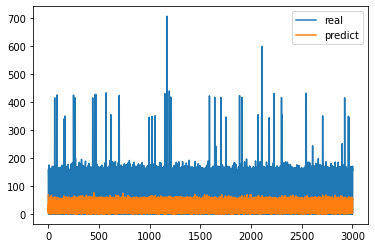

Epoch: 10; Test MAE loss on source data is: 43.195
Epoch: 10; Test MSE loss on source data is: 3250.579


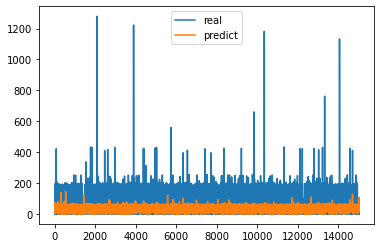

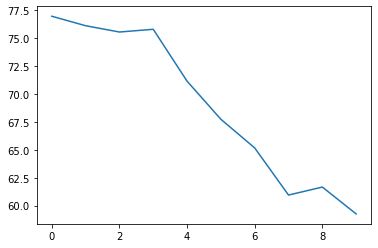

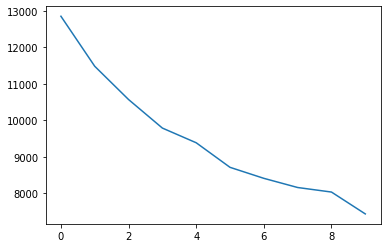

------------Domain Adaptation------------
Epoch: 0; MSE loss: 654110.664
Epoch: 0; disc loss: 95059.741
Epoch: 0; ceod loss: 33591.054
57.896265243318574
7500.799693842462
Parameter containing:
tensor([0.2014, 0.2011, 0.1998, 0.1997, 0.1980], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 665832.856
Epoch: 1; disc loss: 89577.916
Epoch: 1; ceod loss: 32306.543
62.939219026014875
7561.730714805005
Parameter containing:
tensor([0.2082, 0.1989, 0.1949, 0.2008, 0.1971], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 695245.238
Epoch: 2; disc loss: 93669.799
Epoch: 2; ceod loss: 31823.915
63.25236889252028
7195.600631907817
Parameter containing:
tensor([0.2220, 0.1955, 0.1873, 0.2019, 0.1932], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 708433.521
Epoch: 3; disc loss: 98674.083
Epoch: 3; ceod loss: 31073.715
57.726295619670594
7288.0472218143905
Parameter containing:
tensor([0.2385, 0.1915, 0.1789, 0.2022, 0.1889], device='cuda:0',
     

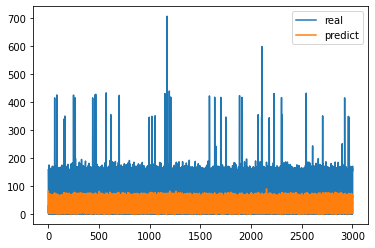

Epoch: 9; Test MAE loss on source data is: 43.680


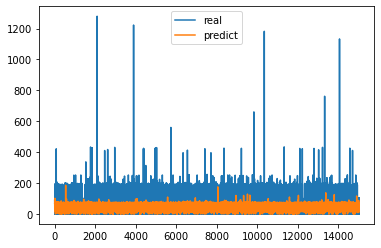

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


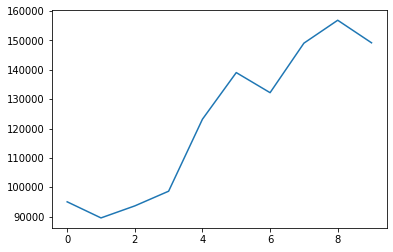

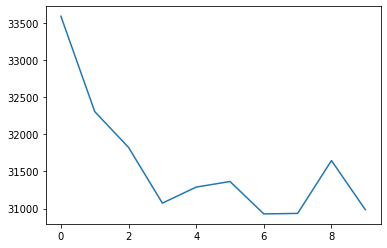

-------------------------- total running losses in 10 epoches as follows---------------------------------


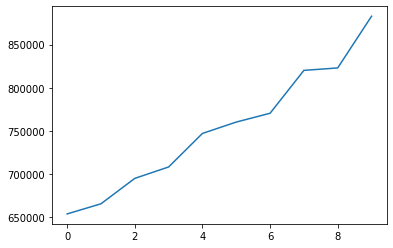

Epoch: 10; MSE loss: 870866.638
Epoch: 10; disc loss: 139040.808
Epoch: 10; ceod loss: 30016.903
53.416022140848554
6263.289168251173
Parameter containing:
tensor([0.4401, 0.1773, 0.0528, 0.2085, 0.1213], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 878776.403
Epoch: 11; disc loss: 134182.315
Epoch: 11; ceod loss: 30111.923
55.12521199104564
6725.350738875466
Parameter containing:
tensor([0.4789, 0.1736, 0.0287, 0.2095, 0.1092], device='cuda:0',
       requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,20

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [1]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.0002
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
        lr = 0.0001
        lr1=0.000001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(2):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(1):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(2):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            # if(stopT<45):
            #   break;
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)


 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 1 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1132270.000
77.42120636667484
13617.132161076113
Epoch: 1; MSE loss: 1065775.000
78.36499674097067
13122.808378180176
Epoch: 2; MSE loss: 966423.688
77.56059008428667
11434.994102096322
Epoch: 3; MSE loss: 915367.750
78.07855980027477
10556.659760853403
Epoch: 4; MSE loss: 843446.250
77.35407985867563
9779.936405944658
Epoch: 5; MSE loss: 796788.438
71.22953144052838
9528.973371097858
Epoch: 6; MSE loss: 785012.312
69.09190934040461
9020.326488598583
Epoch: 7; MSE loss: 795421.250
65.197380800655
8732.73512113295
Epoch: 8; MSE loss: 770452.938
65.77310544080433
8191.549553519192
Epoch: 9; MSE loss: 747327.562
60.765529521947236
8075.311785793236
Epoch: 10; Test MAE loss on target data is: 60.766
Epoch: 10; Test MSE loss on target data is: 8075.312


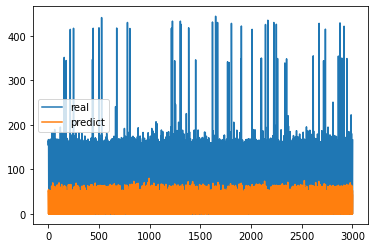

Epoch: 10; Test MAE loss on source data is: 41.565
Epoch: 10; Test MSE loss on source data is: 2916.592


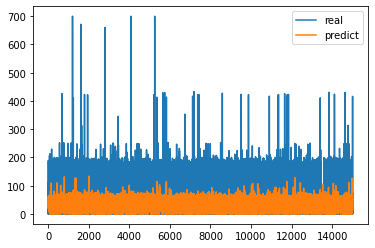

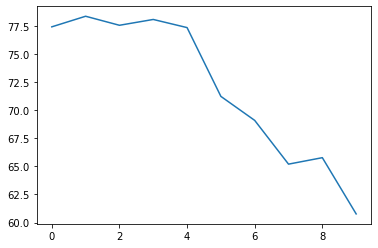

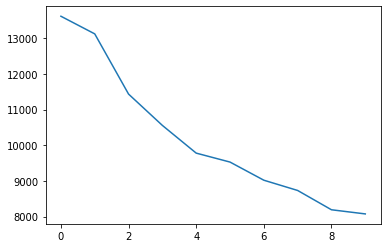

------------Domain Adaptation------------
Epoch: 0; MSE loss: 663540.205
Epoch: 0; disc loss: 91074.866
Epoch: 0; ceod loss: 33710.134
60.36412386097347
7762.338257819951
Parameter containing:
tensor([0.2009, 0.2017, 0.1977, 0.1981, 0.2016], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 708985.290
Epoch: 1; disc loss: 81920.466
Epoch: 1; ceod loss: 33925.395
62.86398559096577
8074.338214762018
Parameter containing:
tensor([0.2053, 0.2033, 0.1947, 0.1908, 0.2058], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 749490.784
Epoch: 2; disc loss: 88905.042
Epoch: 2; ceod loss: 33385.924
65.14299702324564
7755.683867070336
Parameter containing:
tensor([0.2136, 0.2035, 0.1904, 0.1806, 0.2119], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 728420.018
Epoch: 3; disc loss: 109997.589
Epoch: 3; ceod loss: 32436.060
60.66523979180291
7753.123199605176
Parameter containing:
tensor([0.2342, 0.1989, 0.1806, 0.1643, 0.2220], device='cuda:0',
       r

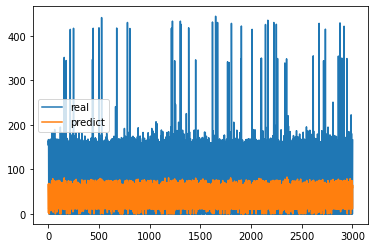

Epoch: 9; Test MAE loss on source data is: 45.555


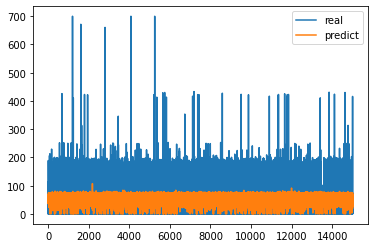

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


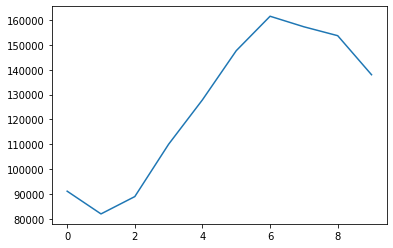

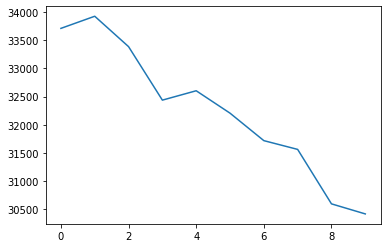

-------------------------- total running losses in 10 epoches as follows---------------------------------


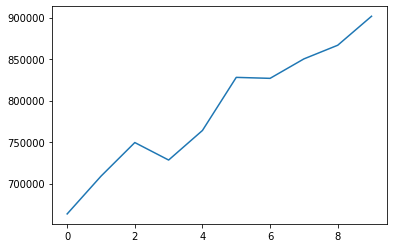

Epoch: 10; MSE loss: 895329.994
Epoch: 10; disc loss: 137786.317
Epoch: 10; ceod loss: 30218.282
56.187717265921115
6808.869251811188
Parameter containing:
tensor([0.4725, 0.1528, 0.0452, 0.0200, 0.3095], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 903986.323
Epoch: 11; disc loss: 127381.333
Epoch: 11; ceod loss: 29858.008
56.977020687319886
6874.028870261012
Parameter containing:
tensor([0.5035, 0.1387, 0.0200, 0.0200, 0.3178], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 925289.718
Epoch: 12; disc loss: 136726.246
Epoch: 12; ceod loss: 29826.350
56.3853461905368
6901.813998628649
Parameter containing:
tensor([0.5267, 0.1183, 0.0200, 0.0200, 0.3150], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 960535.951
Epoch: 13; disc loss: 139942.897
Epoch: 13; ceod loss: 29639.445
54.041336188627724
6539.36456496988
Parameter containing:
tensor([0.5516, 0.0989, 0.0200, 0.0200, 0.3095], device='cuda:0',
       requires_grad=True)
Epoch: 

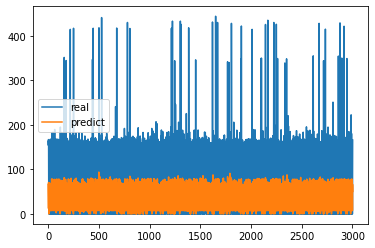

Epoch: 19; Test MAE loss on source data is: 43.498


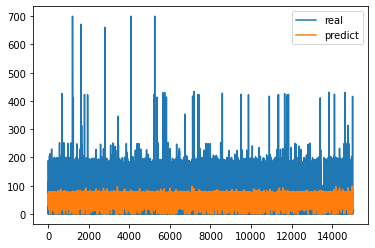

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


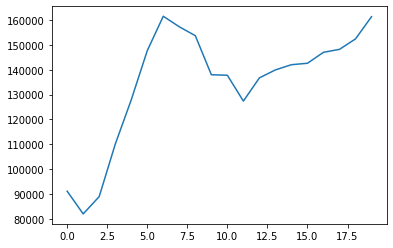

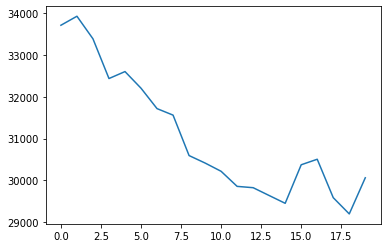

-------------------------- total running losses in 10 epoches as follows---------------------------------


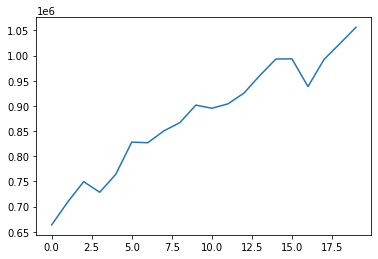

Epoch: 20; MSE loss: 1049088.503
Epoch: 20; disc loss: 150852.415
Epoch: 20; ceod loss: 29288.860
54.78988021249724
6192.284659281021
Parameter containing:
tensor([0.7396, 0.0200, 0.0200, 0.0200, 0.2004], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 1021362.017
Epoch: 21; disc loss: 139743.537
Epoch: 21; ceod loss: 29816.644
50.01396477867961
5614.273256052688
Parameter containing:
tensor([0.7598, 0.0200, 0.0200, 0.0200, 0.1802], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 1054212.832
Epoch: 22; disc loss: 152154.756
Epoch: 22; ceod loss: 30265.872
53.14568180427834
6559.684543066332
Parameter containing:
tensor([0.7890, 0.0200, 0.0200, 0.0200, 0.1510], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 1135219.148
Epoch: 23; disc loss: 155503.289
Epoch: 23; ceod loss: 29976.551
58.37600445531761
6492.6595284603745
Parameter containing:
tensor([0.8302, 0.0200, 0.0200, 0.0200, 0.1098], device='cuda:0',
       requires_grad=True)
Epo

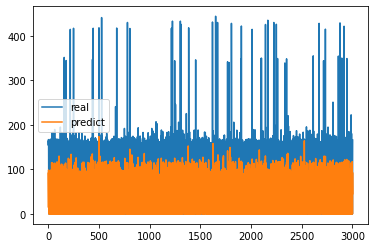

Epoch: 29; Test MAE loss on source data is: 39.358


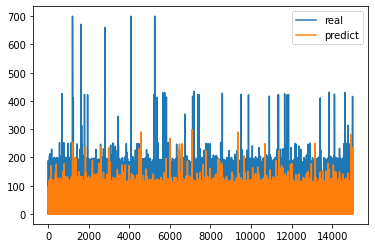

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


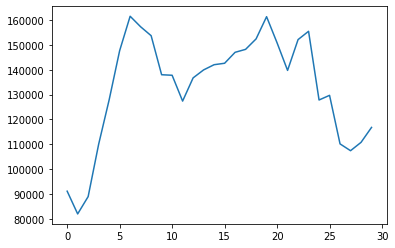

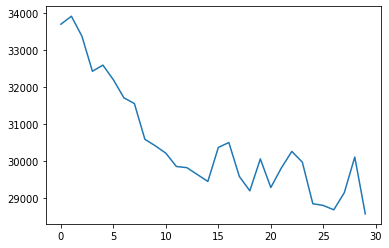

-------------------------- total running losses in 10 epoches as follows---------------------------------


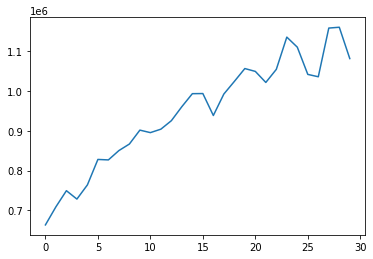

Epoch: 30; MSE loss: 1099191.986
Epoch: 30; disc loss: 119982.256
Epoch: 30; ceod loss: 29312.845
52.94864477011504
6069.903548082602
Parameter containing:
tensor([0.9200, 0.0200, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 989417.536
Epoch: 31; disc loss: 133309.695
Epoch: 31; ceod loss: 28136.505
47.27842735507741
5118.264885247143
Parameter containing:
tensor([0.9200, 0.0200, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 1038469.219
Epoch: 32; disc loss: 139350.469
Epoch: 32; ceod loss: 28549.881
42.006000470470916
4472.432755191188
Parameter containing:
tensor([0.9200, 0.0200, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 974370.453
Epoch: 33; disc loss: 131445.703
Epoch: 33; ceod loss: 28726.625
44.96363958568241
4948.276162746765
Parameter containing:
tensor([0.9200, 0.0200, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch

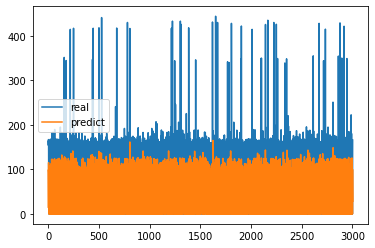

Epoch: 39; Test MAE loss on source data is: 38.668


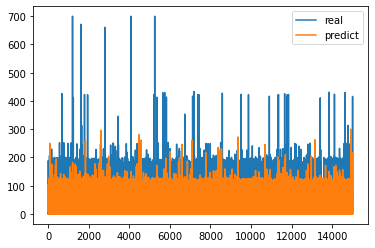

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


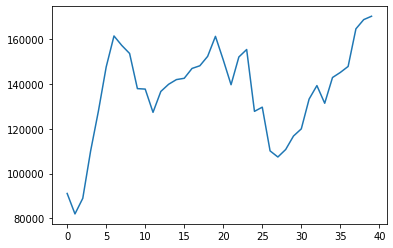

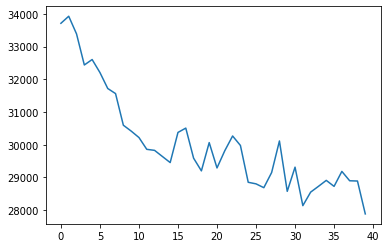

-------------------------- total running losses in 10 epoches as follows---------------------------------


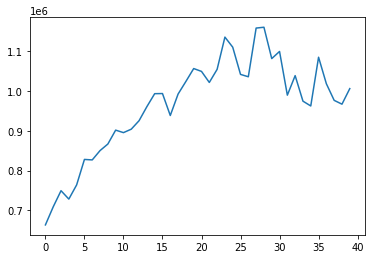

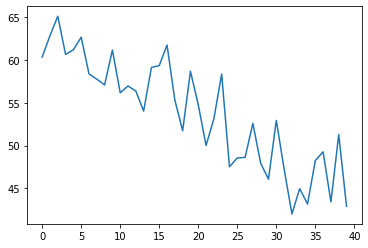

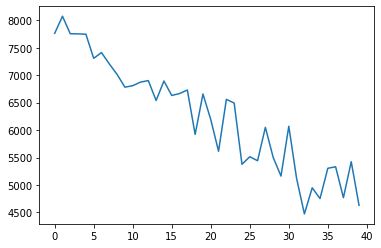

42.900582171576424
0.3630363085218287
0.5702215628153757
Parameter containing:
tensor([0.9200, 0.0200, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 2 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1422129.375
40.916226883869015
4329.208891813882
Epoch: 1; MSE loss: 1366801.500
41.63644906634914
4299.848164927068
Epoch: 2; MSE loss: 1205035.125
42.81295691504479
3780.754924400169
Epoch: 3; MSE loss: 1142791.625
43.339631120375444
3542.735874971078
Epoch: 4; MSE loss: 982446.125
43.10453470207047
3375.628112702049
Epoch: 5; MSE loss: 1013065.438
43.62958233300522
3433.307602627337
Epoch: 6; MSE loss: 939364.562
42.9701742224306
3296.15580248265
Epoch: 7; MSE loss: 940086.312
42.47973744422396
3457.238025490176
Epoch: 8; MSE loss: 846385.500
41.31537810083077
3437.688162684949
Epoch: 9; MSE loss: 884527.125
39.818993772929424
3170.9207018042393
Epoch: 1

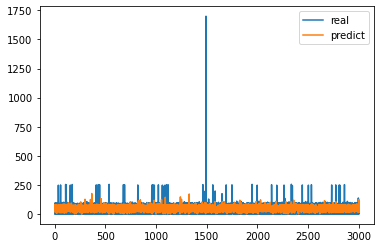

Epoch: 10; Test MAE loss on source data is: 41.505
Epoch: 10; Test MSE loss on source data is: 3693.727


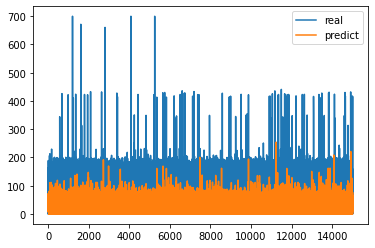

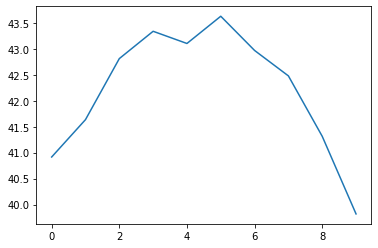

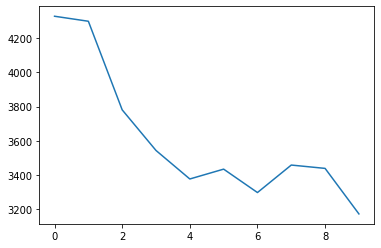

------------Domain Adaptation------------
Epoch: 0; MSE loss: 679917.714
Epoch: 0; disc loss: 385550.129
Epoch: 0; ceod loss: 18693.912
40.843971659554626
3393.0777779356486
Parameter containing:
tensor([0.1993, 0.1947, 0.2029, 0.2006, 0.2024], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 639176.893
Epoch: 1; disc loss: 324713.681
Epoch: 1; ceod loss: 18284.611
42.3138439644391
3386.5304156089223
Parameter containing:
tensor([0.1994, 0.1892, 0.2060, 0.1985, 0.2069], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 624365.361
Epoch: 2; disc loss: 264286.305
Epoch: 2; ceod loss: 17778.300
41.29685989839735
3296.489160349401
Parameter containing:
tensor([0.2001, 0.1885, 0.2108, 0.1890, 0.2115], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 684120.637
Epoch: 3; disc loss: 231989.004
Epoch: 3; ceod loss: 17342.773
40.72546449648873
3250.248695939252
Parameter containing:
tensor([0.1972, 0.1898, 0.2189, 0.1779, 0.2161], device='cuda:0',
   

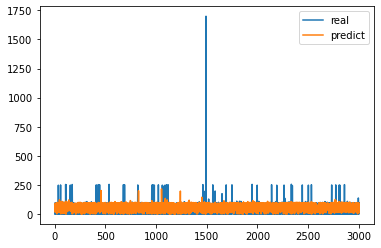

Epoch: 9; Test MAE loss on source data is: 37.959


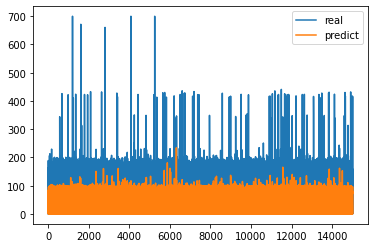

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


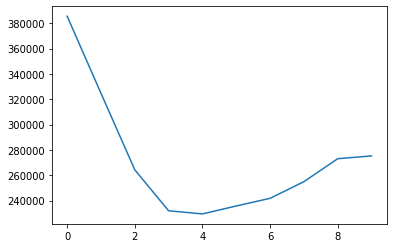

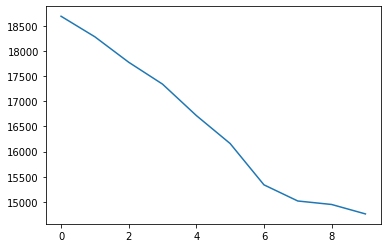

-------------------------- total running losses in 10 epoches as follows---------------------------------


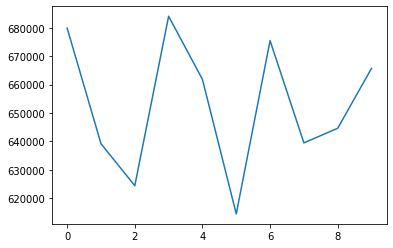

Epoch: 10; MSE loss: 635611.000
Epoch: 10; disc loss: 272094.912
Epoch: 10; ceod loss: 14642.958
40.07342822192988
3683.7554831697003
Parameter containing:
tensor([0.2233, 0.2549, 0.2595, 0.0200, 0.2422], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 653807.430
Epoch: 11; disc loss: 270120.772
Epoch: 11; ceod loss: 14497.547
39.797271175327374
3717.823538408198
Parameter containing:
tensor([0.2244, 0.2593, 0.2561, 0.0200, 0.2402], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 680519.305
Epoch: 12; disc loss: 270196.296
Epoch: 12; ceod loss: 14271.470
38.97656829098113
3649.1229293750234
Parameter containing:
tensor([0.2281, 0.2658, 0.2513, 0.0200, 0.2349], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 631060.859
Epoch: 13; disc loss: 264740.654
Epoch: 13; ceod loss: 14296.121
38.3667576179583
3379.005016119799
Parameter containing:
tensor([0.2312, 0.2713, 0.2480, 0.0200, 0.2295], device='cuda:0',
       requires_grad=True)
Epoch:

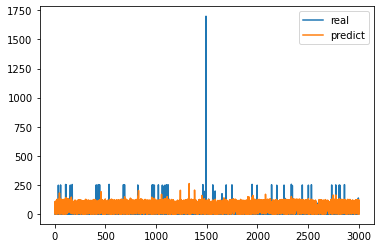

Epoch: 19; Test MAE loss on source data is: 35.994


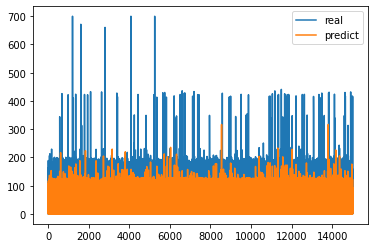

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


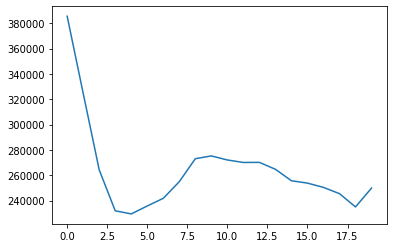

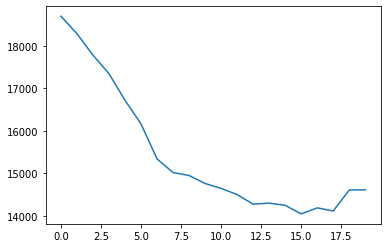

-------------------------- total running losses in 10 epoches as follows---------------------------------


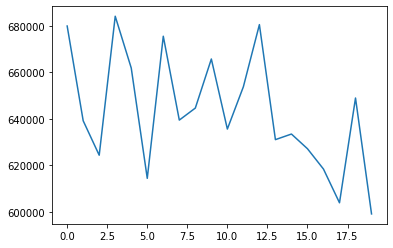

Epoch: 20; MSE loss: 626314.959
Epoch: 20; disc loss: 246512.672
Epoch: 20; ceod loss: 14553.569
37.61716687526509
3339.1976418731033
Parameter containing:
tensor([0.2944, 0.3084, 0.2159, 0.0200, 0.1613], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 612176.683
Epoch: 21; disc loss: 238316.351
Epoch: 21; ceod loss: 14616.546
37.42551827197585
3456.818072654885
Parameter containing:
tensor([0.3100, 0.3170, 0.2078, 0.0200, 0.1451], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 601653.667
Epoch: 22; disc loss: 244187.598
Epoch: 22; ceod loss: 14705.131
43.000452526717304
4409.838917465704
Parameter containing:
tensor([0.3263, 0.3256, 0.2010, 0.0200, 0.1271], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 608688.775
Epoch: 23; disc loss: 245967.440
Epoch: 23; ceod loss: 14984.695
38.788008869547504
3857.326804964233
Parameter containing:
tensor([0.3488, 0.3412, 0.1895, 0.0200, 0.1006], device='cuda:0',
       requires_grad=True)
Epoch

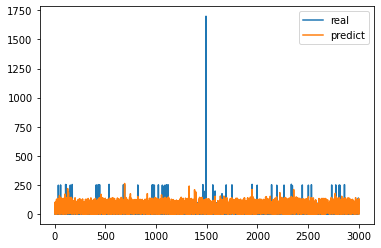

Epoch: 29; Test MAE loss on source data is: 34.493


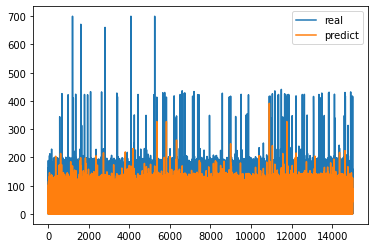

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


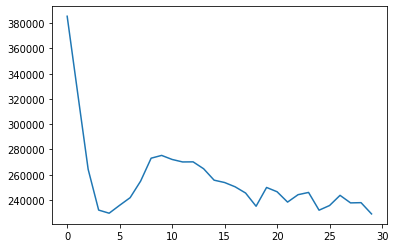

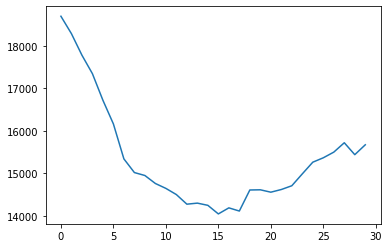

-------------------------- total running losses in 10 epoches as follows---------------------------------


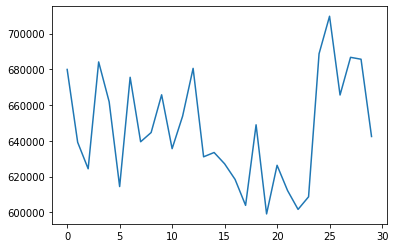

Epoch: 30; MSE loss: 635905.398
Epoch: 30; disc loss: 214913.482
Epoch: 30; ceod loss: 16170.085
44.4770227644776
4600.4547646481415
Parameter containing:
tensor([0.4755, 0.4367, 0.0478, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 712594.510
Epoch: 31; disc loss: 201856.474
Epoch: 31; ceod loss: 15742.841
43.578324136895915
3914.1299885307985
Parameter containing:
tensor([0.4934, 0.4466, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 665767.322
Epoch: 32; disc loss: 188322.713
Epoch: 32; ceod loss: 16580.400
50.14004363435086
5989.911486139904
Parameter containing:
tensor([0.4972, 0.4428, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 711686.316
Epoch: 33; disc loss: 189502.622
Epoch: 33; ceod loss: 16456.620
38.15558296800176
3349.9873046361577
Parameter containing:
tensor([0.5003, 0.4397, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch

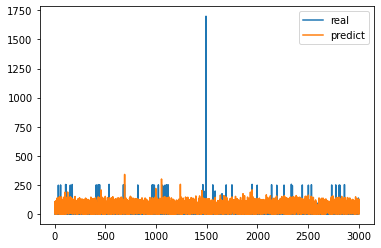

Epoch: 39; Test MAE loss on source data is: 34.395


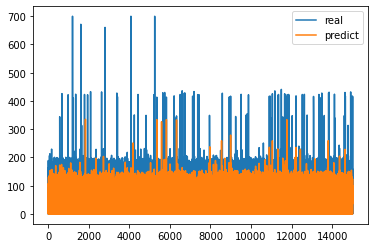

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


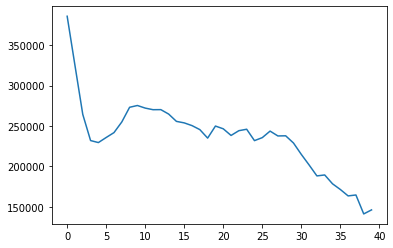

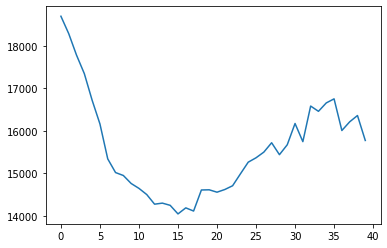

-------------------------- total running losses in 10 epoches as follows---------------------------------


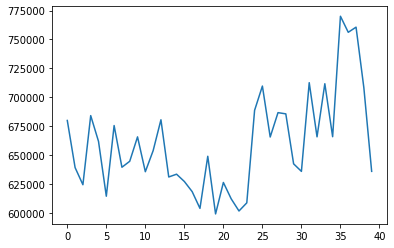

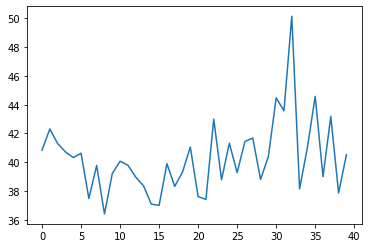

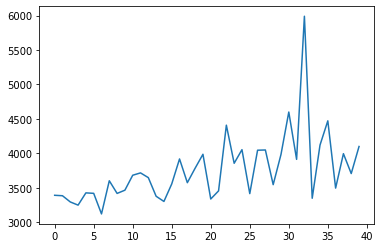

40.523264306154694
0.3775969912864773
0.8977213126618039
Parameter containing:
tensor([0.5224, 0.4176, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 5 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1583719.375
24.910838401731297
2511.5248520108107
Epoch: 1; MSE loss: 1476008.125
26.03578649545597
1991.573121140761
Epoch: 2; MSE loss: 1285133.125
32.81294111582077
1805.0760251633678
Epoch: 3; MSE loss: 1160270.625
34.031968671893
1857.7149449301444
Epoch: 4; MSE loss: 1060563.250
36.912871860240536
1949.1627191282105
Epoch: 5; MSE loss: 987857.438
37.79465884902823
2086.8778700495286
Epoch: 6; MSE loss: 927540.688
40.18683506799403
2297.5073267359053
Epoch: 7; MSE loss: 786959.500
33.07878120703382
1991.7388720161543
Epoch: 8; MSE loss: 779459.312
38.25356993410543
2363.4865251168403
Epoch: 9; MSE loss: 792262.250
37.2287059776862
2244.327716700885
Epo

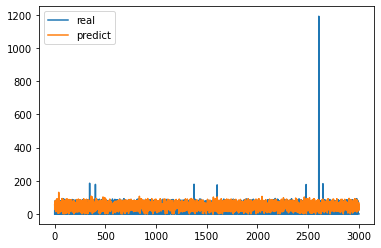

Epoch: 10; Test MAE loss on source data is: 43.829
Epoch: 10; Test MSE loss on source data is: 3853.067


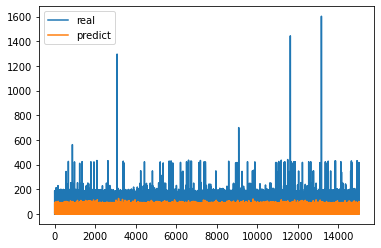

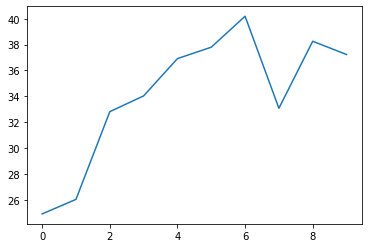

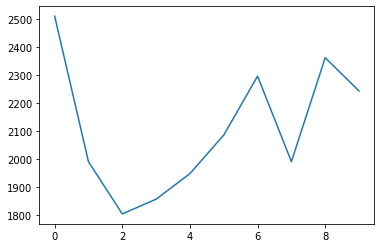

------------Domain Adaptation------------
Epoch: 0; MSE loss: 670303.681
Epoch: 0; disc loss: 403975.009
Epoch: 0; ceod loss: 16766.119
36.954484162309
2343.9472154545697
Parameter containing:
tensor([0.2023, 0.1949, 0.2009, 0.2027, 0.1993], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 734484.292
Epoch: 1; disc loss: 342173.327
Epoch: 1; ceod loss: 16166.898
36.84610896784758
2133.7651506698394
Parameter containing:
tensor([0.2072, 0.1910, 0.2016, 0.2041, 0.1960], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 709127.565
Epoch: 2; disc loss: 290219.402
Epoch: 2; ceod loss: 15953.829
38.45976117406085
2404.8515970580575
Parameter containing:
tensor([0.2137, 0.1857, 0.2054, 0.2042, 0.1911], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 689234.341
Epoch: 3; disc loss: 267450.754
Epoch: 3; ceod loss: 15522.251
34.36202764946635
2177.5947816711873
Parameter containing:
tensor([0.2194, 0.1809, 0.2106, 0.2035, 0.1855], device='cuda:0',
   

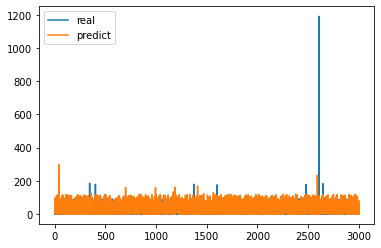

Epoch: 9; Test MAE loss on source data is: 39.670


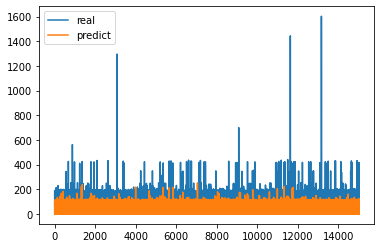

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


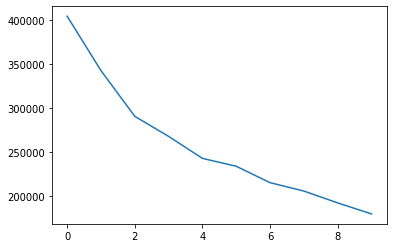

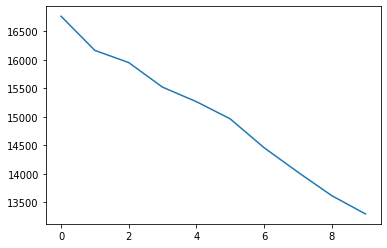

-------------------------- total running losses in 10 epoches as follows---------------------------------


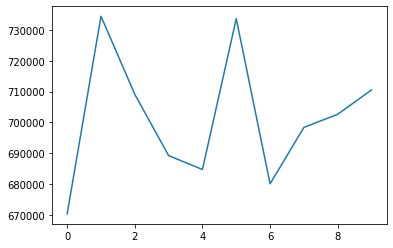

Epoch: 10; MSE loss: 729207.157
Epoch: 10; disc loss: 158788.765
Epoch: 10; ceod loss: 13397.684
35.377861246362464
2258.0171572151803
Parameter containing:
tensor([0.2557, 0.1183, 0.2918, 0.1983, 0.1358], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 702790.200
Epoch: 11; disc loss: 137304.949
Epoch: 11; ceod loss: 13084.831
33.86354761377235
2570.2832794702526
Parameter containing:
tensor([0.2675, 0.0957, 0.3199, 0.1948, 0.1221], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 662231.812
Epoch: 12; disc loss: 113599.472
Epoch: 12; ceod loss: 12529.456
33.26676815883139
2337.5329468139535
Parameter containing:
tensor([0.2806, 0.0684, 0.3536, 0.1938, 0.1036], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 665070.468
Epoch: 13; disc loss: 87239.577
Epoch: 13; ceod loss: 12170.489
33.86351186400168
2649.0871931067595
Parameter containing:
tensor([0.2968, 0.0359, 0.3914, 0.1934, 0.0826], device='cuda:0',
       requires_grad=True)
Epoc

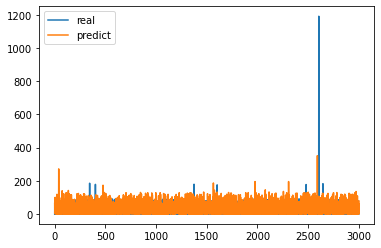

Epoch: 19; Test MAE loss on source data is: 37.738


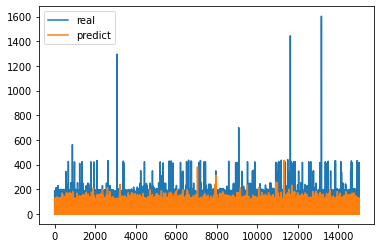

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


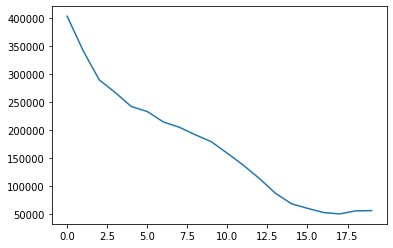

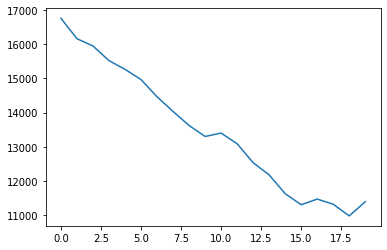

-------------------------- total running losses in 10 epoches as follows---------------------------------


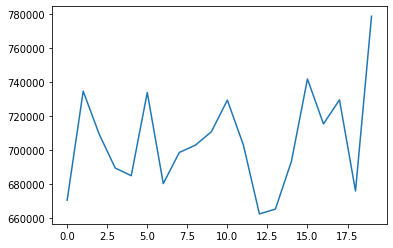

Epoch: 20; MSE loss: 824440.712
Epoch: 20; disc loss: 80978.328
Epoch: 20; ceod loss: 11346.855
34.12349068673052
2542.041312667336
Parameter containing:
tensor([0.3236, 0.0200, 0.5540, 0.0825, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 718509.276
Epoch: 21; disc loss: 91907.408
Epoch: 21; ceod loss: 11167.239
38.9397383148121
3426.1499198068836
Parameter containing:
tensor([0.3101, 0.0200, 0.5855, 0.0644, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 733526.743
Epoch: 22; disc loss: 97969.687
Epoch: 22; ceod loss: 11358.617
36.053302442424304
2856.7846252192107
Parameter containing:
tensor([0.3002, 0.0200, 0.6184, 0.0414, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 723452.841
Epoch: 23; disc loss: 102039.825
Epoch: 23; ceod loss: 11362.144
35.33408935893868
3050.5615410043233
Parameter containing:
tensor([0.2878, 0.0200, 0.6522, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 2

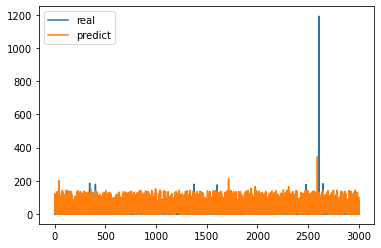

Epoch: 29; Test MAE loss on source data is: 39.174


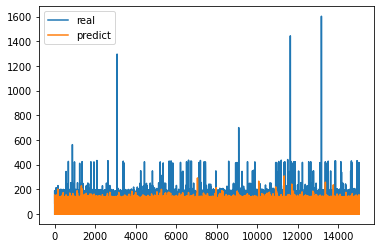

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


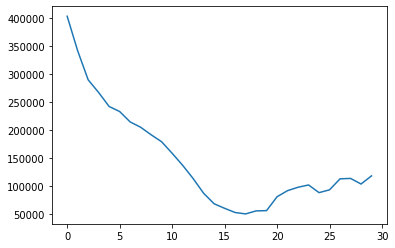

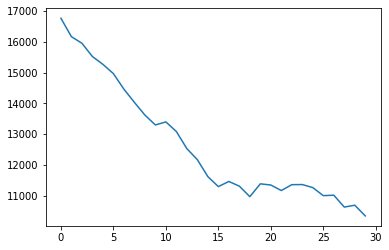

-------------------------- total running losses in 10 epoches as follows---------------------------------


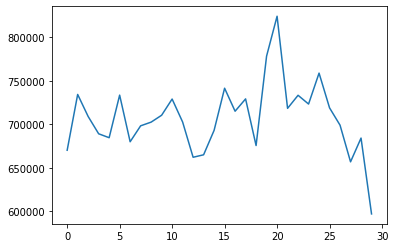

Epoch: 30; MSE loss: 684515.689
Epoch: 30; disc loss: 112097.070
Epoch: 30; ceod loss: 10269.063
39.26898048283376
3161.1309760817066
Parameter containing:
tensor([0.1057, 0.0200, 0.8343, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 575339.027
Epoch: 31; disc loss: 99538.762
Epoch: 31; ceod loss: 10180.985
34.65881843981984
2439.275027216342
Parameter containing:
tensor([0.0651, 0.0200, 0.8748, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 533461.664
Epoch: 32; disc loss: 82584.676
Epoch: 32; ceod loss: 10212.130
35.7821281843195
2740.959706238913
Parameter containing:
tensor([0.0229, 0.0200, 0.9171, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 605440.454
Epoch: 33; disc loss: 65206.341
Epoch: 33; ceod loss: 10550.645
33.867492010873974
2601.4129581268285
Parameter containing:
tensor([0.0200, 0.0200, 0.9200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 34

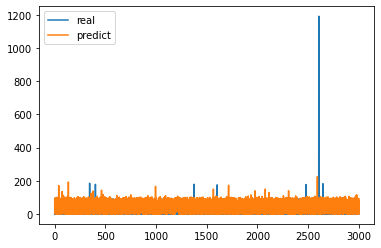

Epoch: 39; Test MAE loss on source data is: 39.264


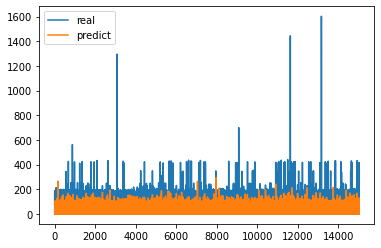

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


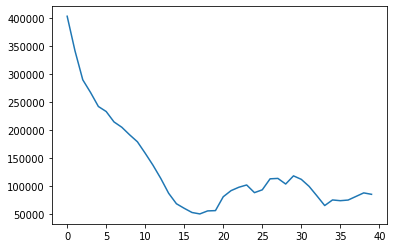

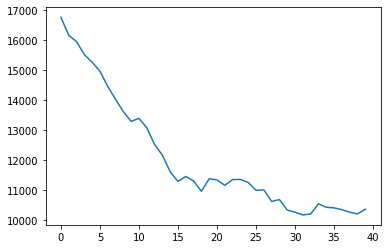

-------------------------- total running losses in 10 epoches as follows---------------------------------


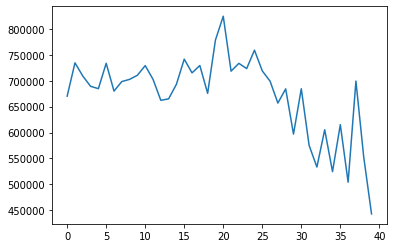

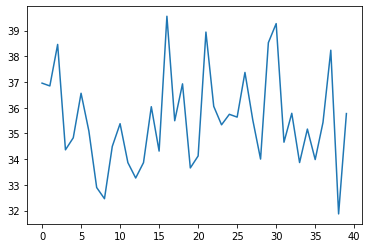

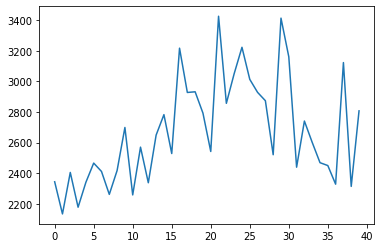

35.77148166935787
0.8566794372623024
1.1145046438180966
Parameter containing:
tensor([0.0200, 0.0200, 0.9200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [1,2,5]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.0002
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
        lr = 0.0001
        lr1=0.000001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(1):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(2):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)

In [ ]:
######################################washingmachine###############################################################
# #trainfile4="/content/drive/MyDrive/training_data/dishwasher_test_.csv"
# # trainfile1="/content/drive/MyDrive/training_data/washingmachine_house_2_training_.csv"
# trainfile1="/content/drive/MyDrive/training_data/washingmachine_test_.csv"

# trainfile2="/content/drive/MyDrive/ukdale_training/washingmachine_house_1_training_.csv"
# # trainfile3="/content/drive/MyDrive/ukdale_training/fridge_house_2_training_.csv"
# trainfile3="/content/drive/MyDrive/refit_training/washingmachine/washingmachine_house_9_training_.csv"
# trainfile4="/content/drive/MyDrive/refit_training/washingmachine/washingmachine_house_16_training_.csv"

# fileList=[trainfile1,trainfile2,trainfile3,trainfile4]
# stepsizeList=[2,16,16,16]
trainfile1="/content/drive/MyDrive/training_data/washingmachine_test_.csv"
trainfile2="/content/drive/MyDrive/training_data/washingmachine_house_2_training_.csv"
trainfile3="/content/drive/MyDrive/ukdale_training/washingmachine_house_1_training_.csv"
trainfile4="/content/drive/MyDrive/ukdale_training/washingmachine_house_2_training_.csv"
trainfile5="/content/drive/MyDrive/refit_training/washingmachine/washingmachine_house_9_training_.csv"
trainfile6="/content/drive/MyDrive/refit_training/washingmachine/washingmachine_house_16_training_.csv"
fileList=[trainfile1,trainfile2,trainfile3,trainfile4,trainfile5,trainfile6]
stepsizeList=[2,2,16,16,16,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=20
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    Y=Y.reshape(-1,1)
    data_insts.append(X)
    data_labels.append(Y)
    num_insts.append(X.shape[0])
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[15017, 15017, 15017, 15017, 15017, 15017]


In [ ]:
trainfile1="/content/drive/MyDrive/training_data/washingmachine_house_3_training_.csv"
trainfile2="/content/drive/MyDrive/refit_training/washingmachine/washingmachine_house_16_training_.csv"
fileList=[trainfile1,trainfile2]
stepsizeList=[2,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=20
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    Y=Y.reshape(-1,1)
    data_insts.append(X)
    data_labels.append(Y)
    num_insts.append(X.shape[0])
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[18353, 18353]



 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 0 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 10922067.000
41.35362065230659
50621.52260903793
Epoch: 1; MSE loss: 7805522.500
42.10895359897636
59376.720474969916
Epoch: 2; MSE loss: 8278849.500
32.85991616743224
57213.88029887354
Epoch: 3; MSE loss: 9072436.000
39.98582306457298
59031.4999157367
Epoch: 4; MSE loss: 8147848.500
37.63363988208332
51355.44167088125
Epoch: 5; MSE loss: 8597044.000
39.433099049906694
58668.374922737996
Epoch: 6; MSE loss: 8311320.000
36.726552128618614
54270.6634234262
Epoch: 7; MSE loss: 8384041.000
38.35480897734343
53754.33006154317
Epoch: 8; MSE loss: 8710729.000
37.80014209567953
45826.51514773871
Epoch: 9; MSE loss: 8393422.000
37.030893559845765
56502.888901453145
Epoch: 10; Test MAE loss on target data is: 37.031
Epoch: 10; Test MSE loss on target data is: 56502.889

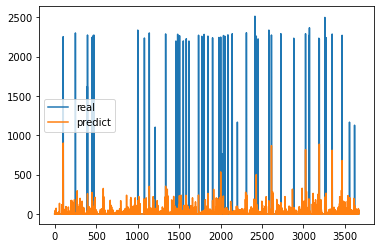

Epoch: 10; Test MAE loss on source data is: 36.588
Epoch: 10; Test MSE loss on source data is: 29913.378


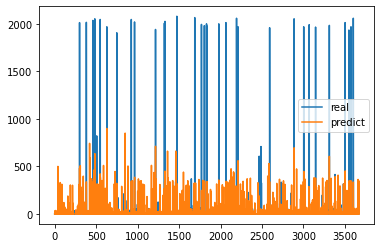

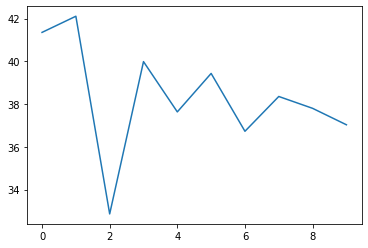

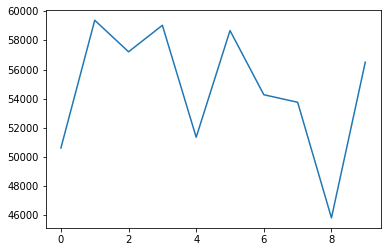

------------Domain Adaptation------------
Epoch: 0; MSE loss: 1769218.016
Epoch: 0; disc loss: 67611.595
Epoch: 0; ceod loss: 4192.484
35.58808976661593
57285.464110404195
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 1; MSE loss: 1743004.690
Epoch: 1; disc loss: 96280.301
Epoch: 1; ceod loss: 5679.621
35.77680709696396
58315.74264449659
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 2; MSE loss: 1697895.668
Epoch: 2; disc loss: 80523.259
Epoch: 2; ceod loss: 5827.647
33.56013634348856
59506.24257253037
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 3; MSE loss: 1699874.911
Epoch: 3; disc loss: 79141.009
Epoch: 3; ceod loss: 6945.644
33.73835542071183
59973.21972119794
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 4; MSE loss: 2014908.729
Epoch: 4; disc loss: 66461.895
Epoch: 4; ceod loss: 6817.692
34.90304378821903
59139.83197512663
Parameter containing:
te

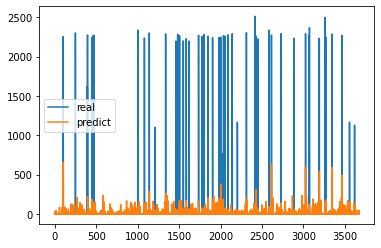

Epoch: 9; Test MAE loss on source data is: 32.026


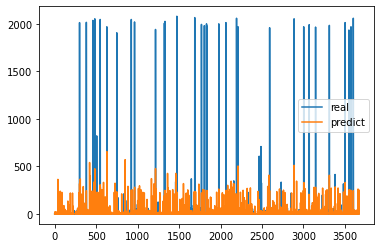

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


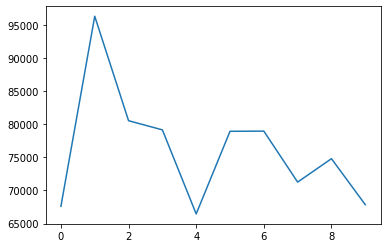

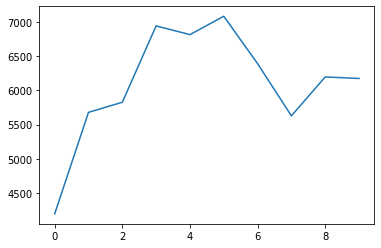

-------------------------- total running losses in 10 epoches as follows---------------------------------


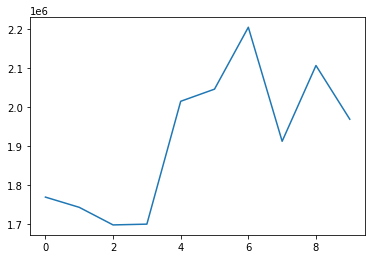

Epoch: 10; MSE loss: 2089686.140
Epoch: 10; disc loss: 66099.226
Epoch: 10; ceod loss: 6294.732
34.518143168757206
58043.47992656404
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 11; MSE loss: 2482173.332
Epoch: 11; disc loss: 61201.089
Epoch: 11; ceod loss: 5879.088
35.02163514946815
56949.090231410744
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 12; MSE loss: 1942268.677
Epoch: 12; disc loss: 70647.671
Epoch: 12; ceod loss: 6021.735
34.39274823931629
57145.677689750635
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 13; MSE loss: 2059698.608
Epoch: 13; disc loss: 69728.402
Epoch: 13; ceod loss: 6597.667
34.257528707824804
56952.57930245686
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 14; MSE loss: 2200874.009
Epoch: 14; disc loss: 62390.050
Epoch: 14; ceod loss: 5894.299
35.23077964119178
55714.03882152668
Parameter containing:
tensor([1.], device='cuda:

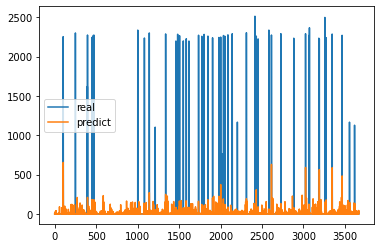

Epoch: 19; Test MAE loss on source data is: 31.654


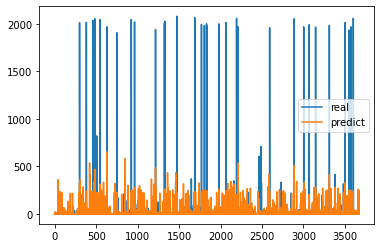

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


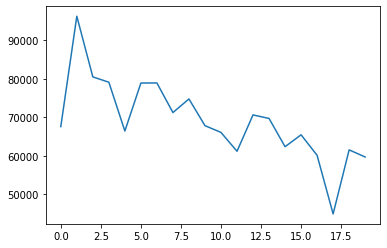

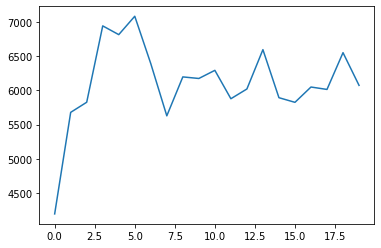

-------------------------- total running losses in 10 epoches as follows---------------------------------


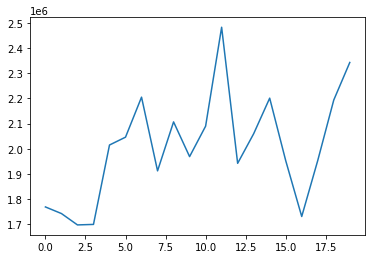

Epoch: 20; MSE loss: 2230494.799
Epoch: 20; disc loss: 57752.051
Epoch: 20; ceod loss: 5881.974
35.382541317117585
56539.054894916124
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 21; MSE loss: 2212275.254
Epoch: 21; disc loss: 65517.507
Epoch: 21; ceod loss: 5861.085
35.26054466134557
56977.15404040844
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 22; MSE loss: 2081464.404
Epoch: 22; disc loss: 62516.127
Epoch: 22; ceod loss: 5554.526
34.54433589258517
57483.804995344224
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 23; MSE loss: 2021742.603
Epoch: 23; disc loss: 55987.699
Epoch: 23; ceod loss: 5765.324
34.67977793371981
57485.71283709709
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 24; MSE loss: 2089852.966
Epoch: 24; disc loss: 51942.276
Epoch: 24; ceod loss: 5958.202
33.08098121267632
58979.710650694666
Parameter containing:
tensor([1.], device='cuda:

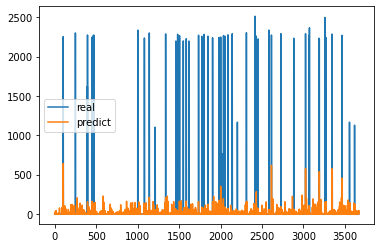

Epoch: 29; Test MAE loss on source data is: 31.378


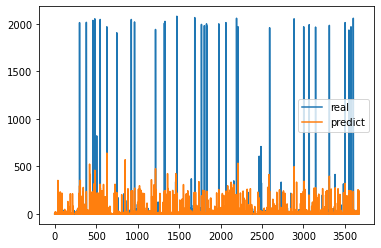

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


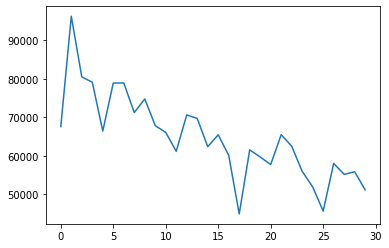

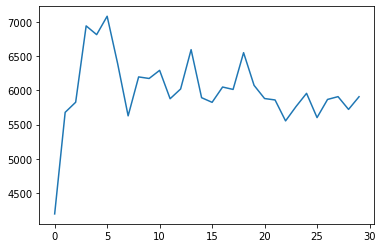

-------------------------- total running losses in 10 epoches as follows---------------------------------


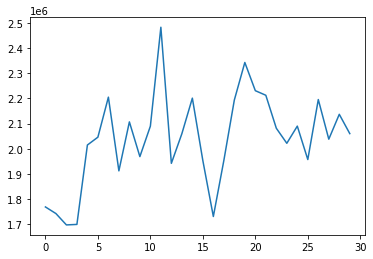

Epoch: 30; MSE loss: 1958698.733
Epoch: 30; disc loss: 56537.445
Epoch: 30; ceod loss: 6144.231
32.80835721568646
60065.580826054764
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 31; MSE loss: 2065815.729
Epoch: 31; disc loss: 48854.269
Epoch: 31; ceod loss: 6437.813
34.18616825505897
58674.657635023585
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 32; MSE loss: 1849046.113
Epoch: 32; disc loss: 47046.088
Epoch: 32; ceod loss: 5813.911
34.99798233150451
57847.5779531864
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 33; MSE loss: 2063755.600
Epoch: 33; disc loss: 55773.361
Epoch: 33; ceod loss: 6345.164
33.801561862463025
59374.23533970325
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 34; MSE loss: 2103433.596
Epoch: 34; disc loss: 55238.714
Epoch: 34; ceod loss: 5686.811
34.55291612692428
58828.596393066204
Parameter containing:
tensor([1.], device='cuda:0

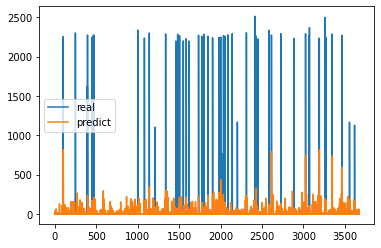

Epoch: 39; Test MAE loss on source data is: 35.269


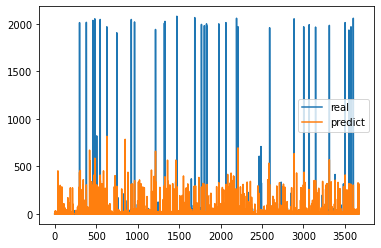

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


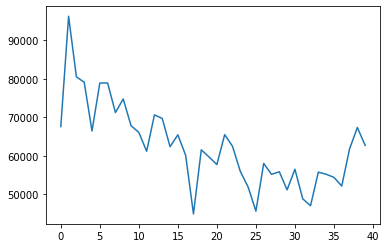

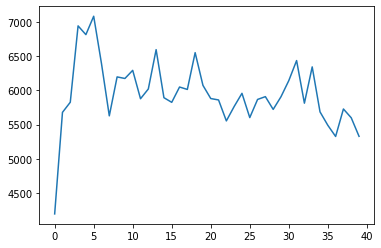

-------------------------- total running losses in 10 epoches as follows---------------------------------


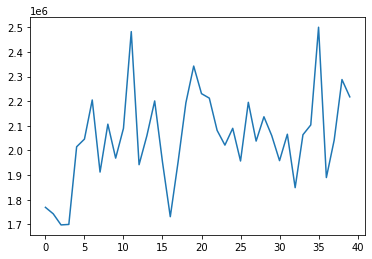

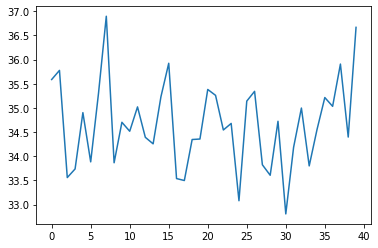

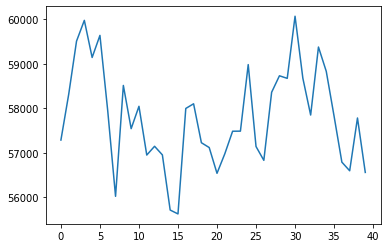

36.666820942597845
0.5955055605634983
0.9272841435682645
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [0]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
        lr = 0.0001
        lr1=0.000001
        batch_size=256
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(2):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(1):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)


 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 0 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 5081452.000
40.82825800504856
72453.64881237461
Epoch: 1; MSE loss: 5301713.500
40.12466963059965
72037.63095414593
Epoch: 2; MSE loss: 5272600.000
39.963327006748976
62770.71282303784
Epoch: 3; MSE loss: 4782744.000
39.28138020905821
73134.48343220566
Epoch: 4; MSE loss: 4802968.500
39.061460895102535
85317.49788261643
Epoch: 5; MSE loss: 5329809.000
38.9389438443663
67576.31654639184
Epoch: 6; MSE loss: 5140127.500
38.62641490737279
64329.21713990116
Epoch: 7; MSE loss: 5175483.500
38.5291623837892
65100.90503545405
Epoch: 8; MSE loss: 5235441.500
38.05295488257515
67826.65477442901
Epoch: 9; MSE loss: 5139550.000
37.58148890270744
68608.54233540982
Epoch: 10; Test MAE loss on target data is: 37.581
Epoch: 10; Test MSE loss on target data is: 68608.542


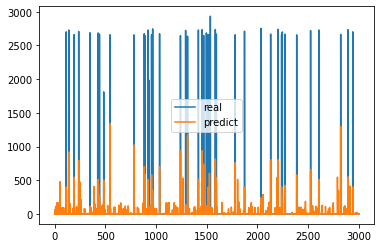

Epoch: 10; Test MAE loss on source data is: 22.493
Epoch: 10; Test MSE loss on source data is: 21413.645


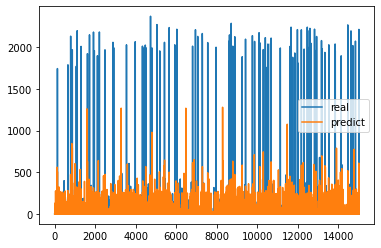

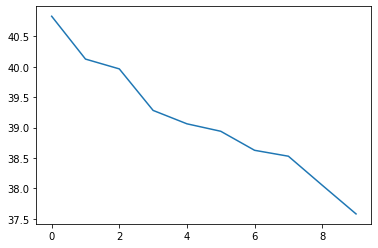

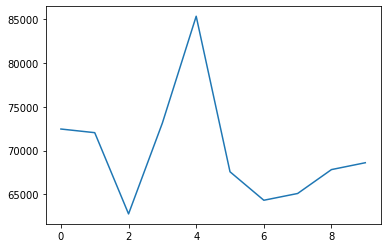

------------Domain Adaptation------------
Epoch: 0; MSE loss: 4722650.990
Epoch: 0; disc loss: 232227.247
Epoch: 0; ceod loss: 36879.671
37.4574206512251
79579.42493441342
Parameter containing:
tensor([0.1998, 0.2001, 0.2022, 0.1988, 0.1991], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 4365346.224
Epoch: 1; disc loss: 139638.171
Epoch: 1; ceod loss: 38322.788
37.91828671019711
87115.032652564
Parameter containing:
tensor([0.2019, 0.2005, 0.1993, 0.1982, 0.2001], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 5738660.440
Epoch: 2; disc loss: 25672.284
Epoch: 2; ceod loss: 38582.539
38.437960228765746
95945.27666371995
Parameter containing:
tensor([0.2011, 0.2063, 0.1969, 0.1942, 0.2014], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 5664860.130
Epoch: 3; disc loss: 10586.188
Epoch: 3; ceod loss: 38260.945
38.891023624924834
100384.12316116675
Parameter containing:
tensor([0.1956, 0.2185, 0.1912, 0.1893, 0.2054], device='cuda:0',
   

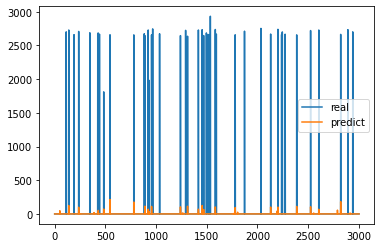

Epoch: 9; Test MAE loss on source data is: 14.895


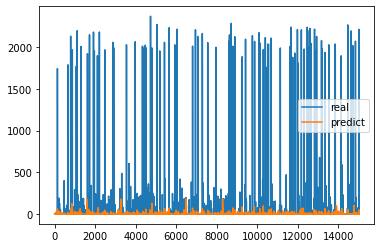

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


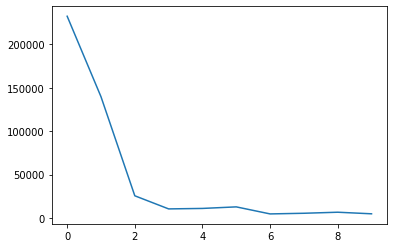

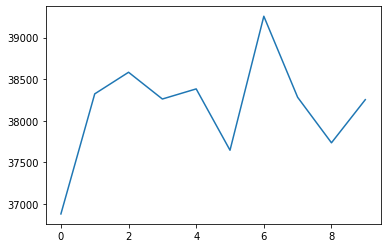

-------------------------- total running losses in 10 epoches as follows---------------------------------


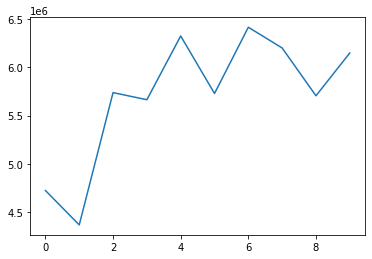

Epoch: 10; MSE loss: 6470111.511
Epoch: 10; disc loss: 4719.265
Epoch: 10; ceod loss: 38568.822
39.37304942786389
103629.0874849132
Parameter containing:
tensor([0.1547, 0.1880, 0.1415, 0.2453, 0.2705], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 6574183.881
Epoch: 11; disc loss: 6120.184
Epoch: 11; ceod loss: 37281.608
39.194199815157695
102468.52678534383
Parameter containing:
tensor([0.1393, 0.1899, 0.1223, 0.2561, 0.2924], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 6820666.538
Epoch: 12; disc loss: 5733.101
Epoch: 12; ceod loss: 37310.577
39.09835789255761
101855.37671897677
Parameter containing:
tensor([0.1225, 0.1893, 0.1048, 0.2745, 0.3088], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 6798438.679
Epoch: 13; disc loss: 6863.372
Epoch: 13; ceod loss: 37163.943
38.71135925926529
97020.17010991216
Parameter containing:
tensor([0.1049, 0.1896, 0.0811, 0.2901, 0.3344], device='cuda:0',
       requires_grad=True)
Epoch: 14

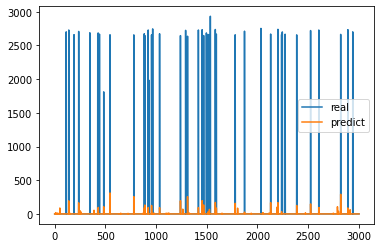

Epoch: 19; Test MAE loss on source data is: 15.353


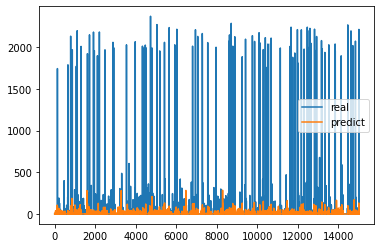

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


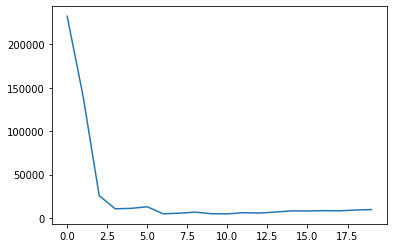

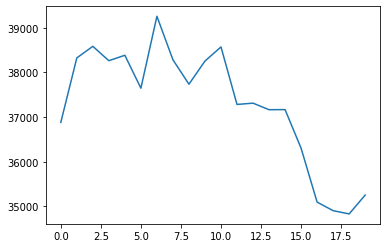

-------------------------- total running losses in 10 epoches as follows---------------------------------


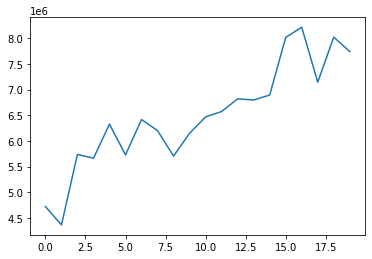

Epoch: 20; MSE loss: 7574412.181
Epoch: 20; disc loss: 8609.828
Epoch: 20; ceod loss: 36143.319
38.93843265293811
100243.7609450731
Parameter containing:
tensor([0.0200, 0.1372, 0.0200, 0.2946, 0.5283], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 7542770.612
Epoch: 21; disc loss: 6875.737
Epoch: 21; ceod loss: 38987.856
38.97912797696237
100647.35045466498
Parameter containing:
tensor([0.0200, 0.1084, 0.0200, 0.3016, 0.5500], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 7787427.119
Epoch: 22; disc loss: 5103.010
Epoch: 22; ceod loss: 40291.174
39.16457440589355
102195.96331933816
Parameter containing:
tensor([0.0200, 0.0731, 0.0200, 0.3080, 0.5789], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 7969050.994
Epoch: 23; disc loss: 6204.714
Epoch: 23; ceod loss: 38439.201
38.910875034607415
99935.08571673019
Parameter containing:
tensor([0.0200, 0.0452, 0.0200, 0.3097, 0.6050], device='cuda:0',
       requires_grad=True)
Epoch: 24

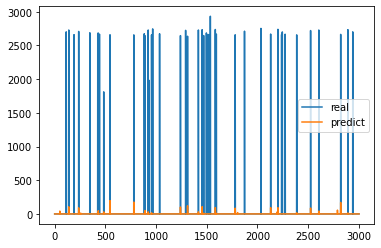

Epoch: 29; Test MAE loss on source data is: 14.879


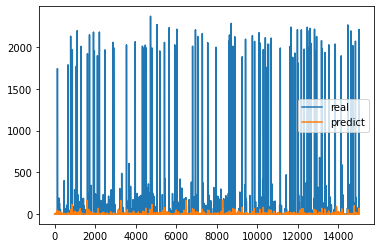

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


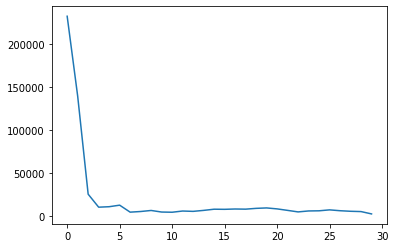

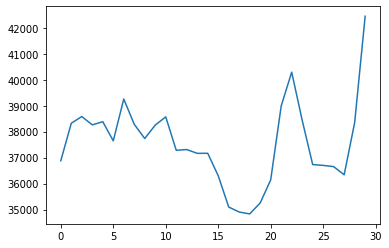

-------------------------- total running losses in 10 epoches as follows---------------------------------


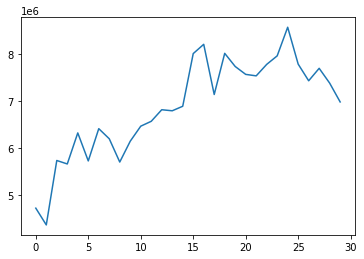

Epoch: 30; MSE loss: 8841455.358
Epoch: 30; disc loss: 3050.991
Epoch: 30; ceod loss: 41755.135
39.08565313256268
101506.1680162104
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.2270, 0.7130], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 7901660.722
Epoch: 31; disc loss: 6214.298
Epoch: 31; ceod loss: 36274.106
38.73379083822369
96097.53994334291
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.2117, 0.7282], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 7879764.943
Epoch: 32; disc loss: 8025.919
Epoch: 32; ceod loss: 35468.106
38.803665597684585
97207.12382747878
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.1940, 0.7460], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 7459692.882
Epoch: 33; disc loss: 4601.918
Epoch: 33; ceod loss: 38466.234
39.20375505821259
102420.94276704943
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.1762, 0.7638], device='cuda:0',
       requires_grad=True)
Epoch: 34;

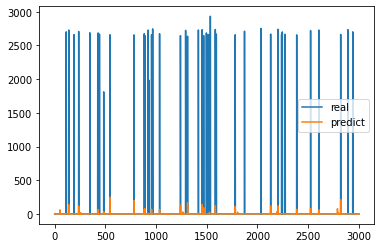

Epoch: 39; Test MAE loss on source data is: 15.041


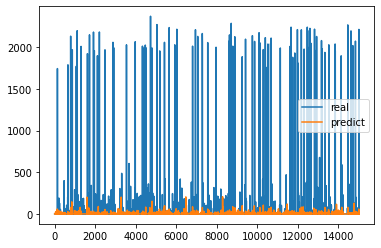

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


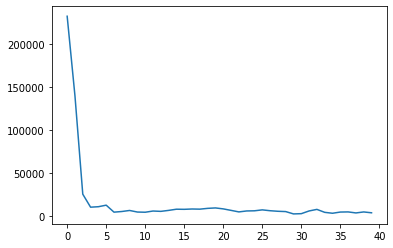

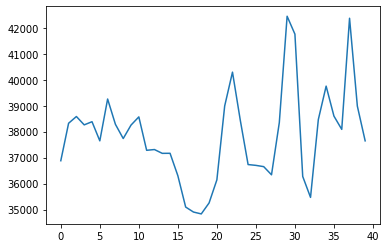

-------------------------- total running losses in 10 epoches as follows---------------------------------


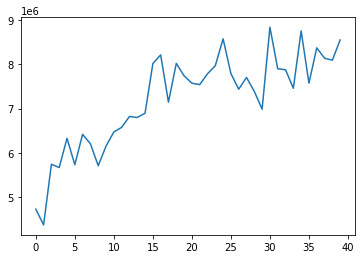

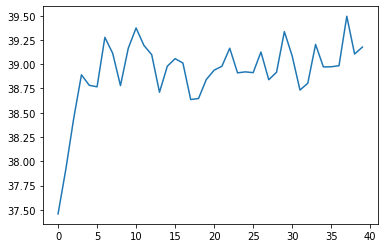

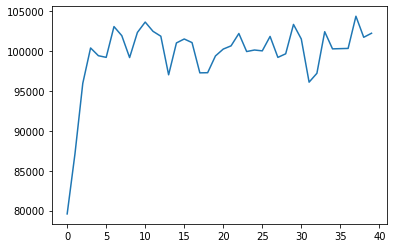

39.17650682070733
0.9763279083427485
0.9802568876356
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.0200, 0.9200], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 2 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 6587032.000
38.011383795619665
39056.50220571609
Epoch: 1; MSE loss: 7270233.500
36.10595470975425
39052.2404172691
Epoch: 2; MSE loss: 6618829.500
35.60787139586936
37944.75037219903
Epoch: 3; MSE loss: 7056630.500
31.262395773831997
51451.97381681215
Epoch: 4; MSE loss: 7784767.500
31.254327563249003
51451.96254993342
Epoch: 5; MSE loss: 7997147.000
31.254327563249003
51451.96254993342
Epoch: 6; MSE loss: 7934211.500
31.254327563249003
51451.96254993342
Epoch: 7; MSE loss: 8014375.000
31.254327563249003
51451.96254993342
Epoch: 8; MSE loss: 7992802.500
31.254327563249003
51451.96254993342
Epoch: 9; MSE loss: 8522289.000
31.254327563249003
51451.96254993342
Ep

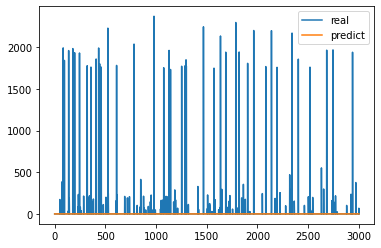

Epoch: 10; Test MAE loss on source data is: 15.262
Epoch: 10; Test MSE loss on source data is: 32533.901


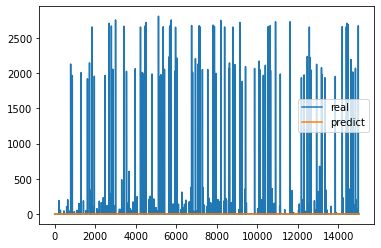

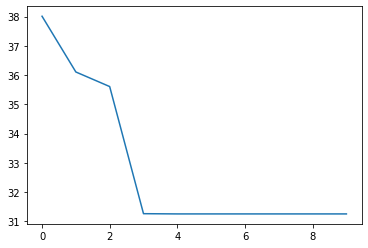

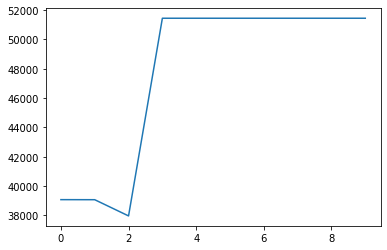

------------Domain Adaptation------------
Epoch: 0; MSE loss: 7114164.129
Epoch: 0; disc loss: 64.726
Epoch: 0; ceod loss: 23910.726
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.1939, 0.2007, 0.2063, 0.2000, 0.1991], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 6797327.430
Epoch: 1; disc loss: 47.448
Epoch: 1; ceod loss: 24014.597
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.1869, 0.2032, 0.2177, 0.1983, 0.1939], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 7048059.715
Epoch: 2; disc loss: 50.595
Epoch: 2; ceod loss: 24785.713
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.1849, 0.2121, 0.2310, 0.1830, 0.1890], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 7293323.892
Epoch: 3; disc loss: 56.140
Epoch: 3; ceod loss: 24347.349
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.1876, 0.2216, 0.2466, 0.1596, 0.1846], device='cuda:0',
       requir

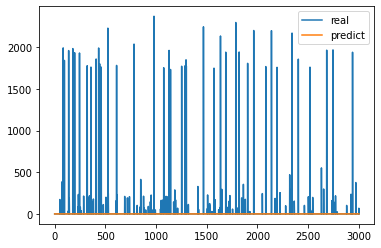

Epoch: 9; Test MAE loss on source data is: 15.262


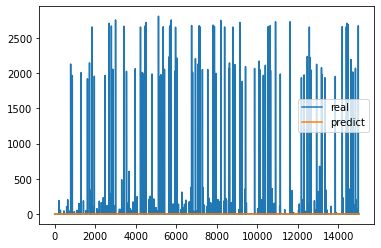

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


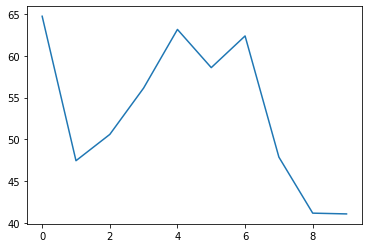

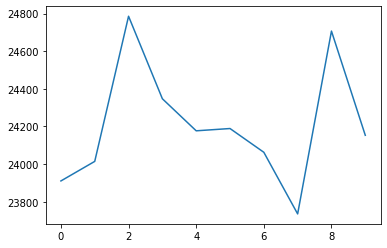

-------------------------- total running losses in 10 epoches as follows---------------------------------


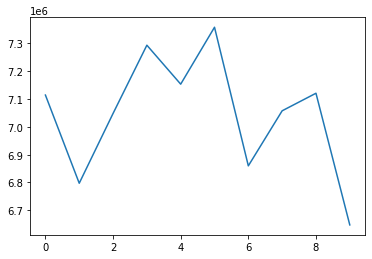

Epoch: 10; MSE loss: 6600333.477
Epoch: 10; disc loss: 34.109
Epoch: 10; ceod loss: 24209.870
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.1717, 0.2539, 0.3852, 0.0200, 0.1692], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 6606910.006
Epoch: 11; disc loss: 37.991
Epoch: 11; ceod loss: 23764.392
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.1563, 0.2548, 0.4128, 0.0200, 0.1560], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 5527921.049
Epoch: 12; disc loss: 36.767
Epoch: 12; ceod loss: 23676.896
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.1355, 0.2580, 0.4504, 0.0200, 0.1361], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 5671245.559
Epoch: 13; disc loss: 37.694
Epoch: 13; ceod loss: 24076.748
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.1145, 0.2608, 0.4932, 0.0200, 0.1115], device='cuda:0',
       requires_grad=True)
Epoch: 14; MSE l

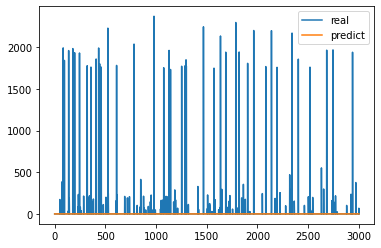

Epoch: 19; Test MAE loss on source data is: 15.262


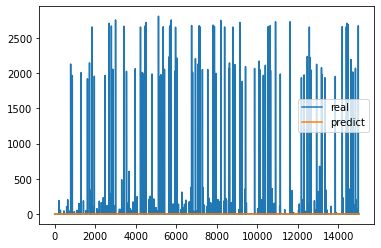

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


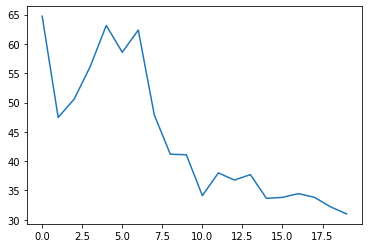

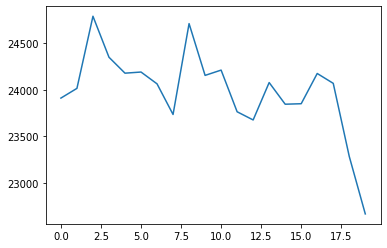

-------------------------- total running losses in 10 epoches as follows---------------------------------


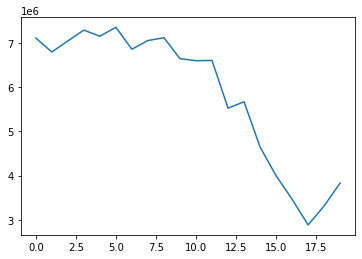

Epoch: 20; MSE loss: 3628778.672
Epoch: 20; disc loss: 29.016
Epoch: 20; ceod loss: 22735.152
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.0200, 0.1754, 0.7646, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 3816712.417
Epoch: 21; disc loss: 27.358
Epoch: 21; ceod loss: 22674.000
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.0200, 0.1433, 0.7967, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 4003333.868
Epoch: 22; disc loss: 26.368
Epoch: 22; ceod loss: 21307.527
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.0200, 0.1102, 0.8298, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 3413221.940
Epoch: 23; disc loss: 28.853
Epoch: 23; ceod loss: 20644.599
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.0200, 0.0753, 0.8647, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 24; MSE l

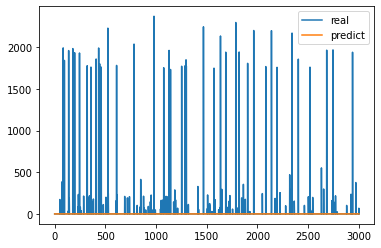

Epoch: 29; Test MAE loss on source data is: 15.262


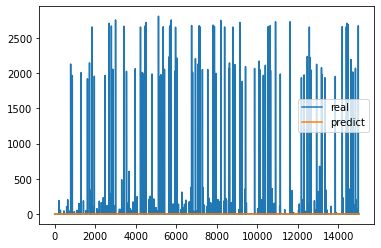

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


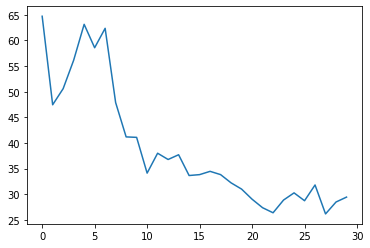

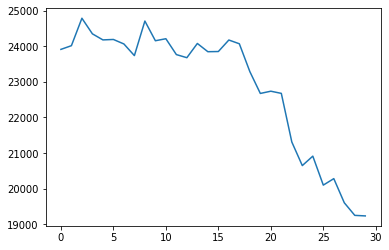

-------------------------- total running losses in 10 epoches as follows---------------------------------


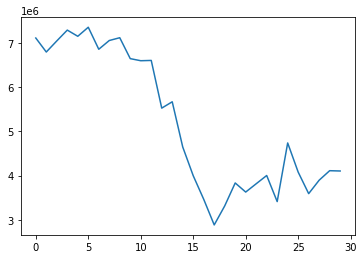

Epoch: 30; MSE loss: 4664711.997
Epoch: 30; disc loss: 27.490
Epoch: 30; ceod loss: 20954.646
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.0200, 0.0200, 0.9200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 4543815.362
Epoch: 31; disc loss: 31.098
Epoch: 31; ceod loss: 22746.046
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.0200, 0.0200, 0.9200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 3746617.995
Epoch: 32; disc loss: 35.539
Epoch: 32; ceod loss: 31788.987
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.0200, 0.0200, 0.9200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 4604675.662
Epoch: 33; disc loss: 41.420
Epoch: 33; ceod loss: 40207.183
31.254327563249003
51451.96254993342
Parameter containing:
tensor([0.0200, 0.0200, 0.9200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 34; MSE l

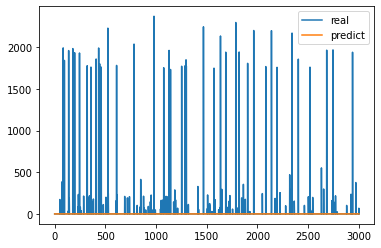

Epoch: 39; Test MAE loss on source data is: 15.262


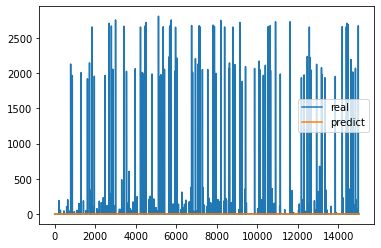

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


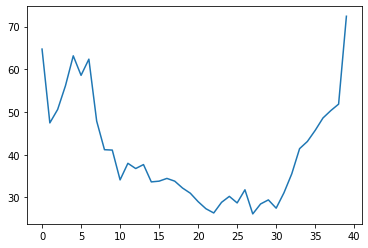

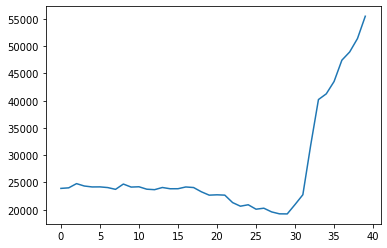

-------------------------- total running losses in 10 epoches as follows---------------------------------


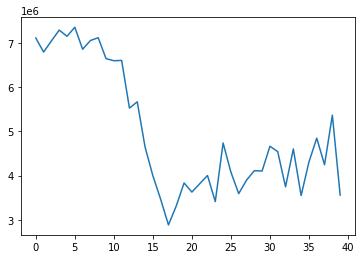

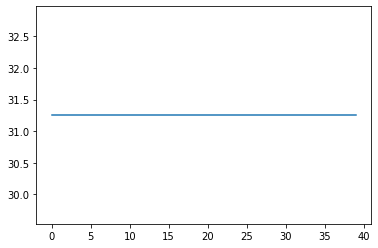

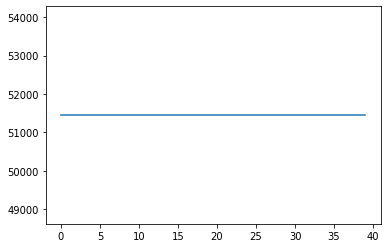

31.254327563249003
1.0
1.0
Parameter containing:
tensor([0.0200, 0.0200, 0.9200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 5 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 6816595.000
47.323595747696395
39736.68864543065
Epoch: 1; MSE loss: 6572385.000
44.99197007035626
38702.26847631004
Epoch: 2; MSE loss: 6578482.000
49.113544330863995
38591.32652393625
Epoch: 3; MSE loss: 6720177.000
42.3427772862358
39074.94333437907
Epoch: 4; MSE loss: 6879281.500
43.46437717332305
38421.535282033015
Epoch: 5; MSE loss: 7100549.000
43.413388369146105
38004.57722988948
Epoch: 6; MSE loss: 6159321.000
38.73101336527839
39221.46569375405
Epoch: 7; MSE loss: 6135050.000
39.35091602387584
39233.42813302283
Epoch: 8; MSE loss: 6138853.500
41.030020326276755
38670.39753353293
Epoch: 9; MSE loss: 6799751.000
38.967862882186346
38464.24752206085
Epoch: 10; Test MAE loss on ta

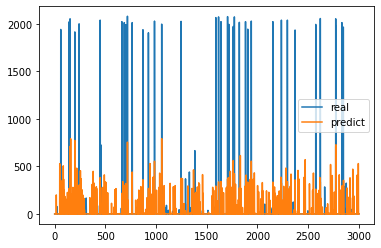

Epoch: 10; Test MAE loss on source data is: 23.335
Epoch: 10; Test MSE loss on source data is: 24366.943


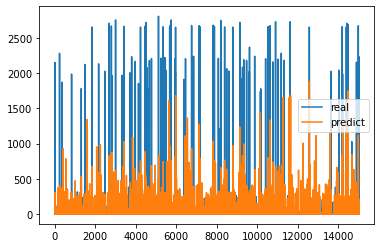

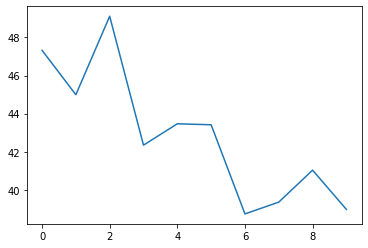

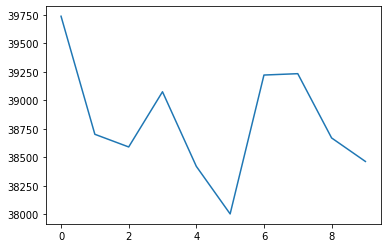

------------Domain Adaptation------------
Epoch: 0; MSE loss: 5488174.932
Epoch: 0; disc loss: 415630.495
Epoch: 0; ceod loss: 30295.444
37.46808808968562
41312.06052068473
Parameter containing:
tensor([0.1981, 0.2012, 0.1997, 0.1986, 0.2023], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 6145594.113
Epoch: 1; disc loss: 220149.642
Epoch: 1; ceod loss: 29251.480
33.058790436597384
43432.50167758493
Parameter containing:
tensor([0.1980, 0.1993, 0.2000, 0.1992, 0.2034], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 7280210.988
Epoch: 2; disc loss: 140903.200
Epoch: 2; ceod loss: 29224.742
32.57380417580611
44581.66357993141
Parameter containing:
tensor([0.1972, 0.1977, 0.2022, 0.1995, 0.2034], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 7380380.522
Epoch: 3; disc loss: 68836.219
Epoch: 3; ceod loss: 29138.049
29.998658597072495
47102.31995926558
Parameter containing:
tensor([0.2017, 0.1984, 0.2018, 0.1957, 0.2023], device='cuda:0',


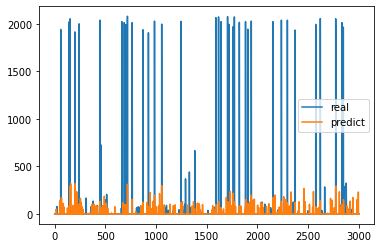

Epoch: 9; Test MAE loss on source data is: 17.636


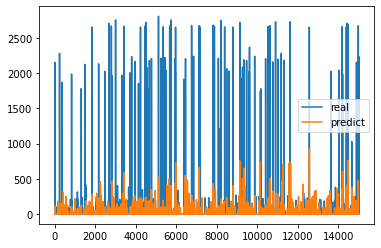

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


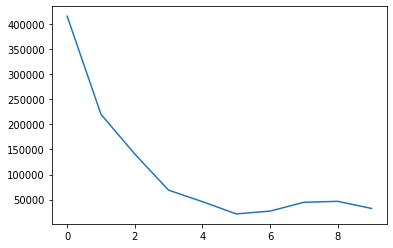

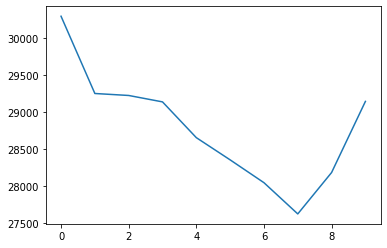

-------------------------- total running losses in 10 epoches as follows---------------------------------


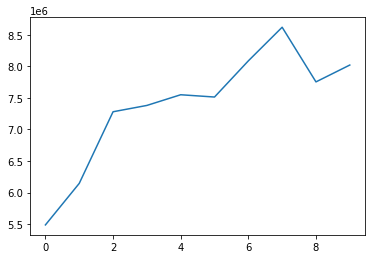

Epoch: 10; MSE loss: 9259477.075
Epoch: 10; disc loss: 15584.938
Epoch: 10; ceod loss: 29360.358
28.564471893478807
50050.38580397509
Parameter containing:
tensor([0.2551, 0.1750, 0.2175, 0.1479, 0.2045], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 9022906.880
Epoch: 11; disc loss: 22169.681
Epoch: 11; ceod loss: 27795.172
28.904677689472305
49563.389502676844
Parameter containing:
tensor([0.2691, 0.1738, 0.2114, 0.1370, 0.2087], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 8941423.512
Epoch: 12; disc loss: 42730.615
Epoch: 12; ceod loss: 27026.075
29.711118073184068
48297.17284522042
Parameter containing:
tensor([0.2906, 0.1617, 0.2203, 0.1218, 0.2056], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 8767899.597
Epoch: 13; disc loss: 43601.463
Epoch: 13; ceod loss: 26871.925
30.276434874248885
47648.55886155141
Parameter containing:
tensor([0.3150, 0.1449, 0.2355, 0.1009, 0.2038], device='cuda:0',
       requires_grad=True)
Epo

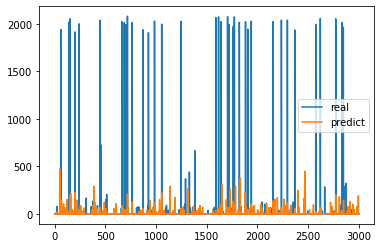

Epoch: 19; Test MAE loss on source data is: 17.023


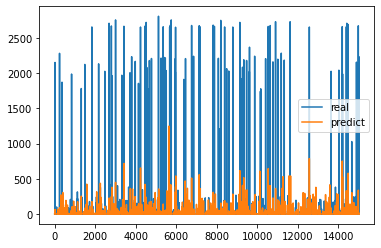

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


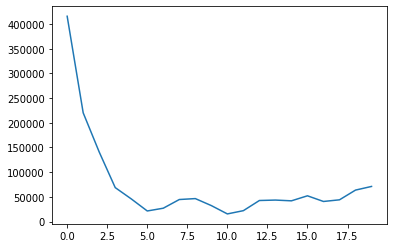

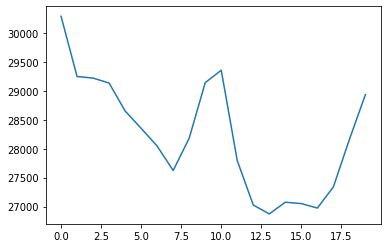

-------------------------- total running losses in 10 epoches as follows---------------------------------


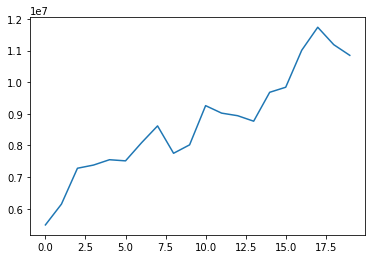

Epoch: 20; MSE loss: 13382165.545
Epoch: 20; disc loss: 106531.017
Epoch: 20; ceod loss: 30708.035
30.81648602805903
47032.9291088754
Parameter containing:
tensor([0.5183, 0.0200, 0.2960, 0.0200, 0.1457], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 13324575.675
Epoch: 21; disc loss: 126488.678
Epoch: 21; ceod loss: 30528.673
31.752661755732625
45090.93072131932
Parameter containing:
tensor([0.5409, 0.0200, 0.2931, 0.0200, 0.1259], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 12368611.044
Epoch: 22; disc loss: 174313.867
Epoch: 22; ceod loss: 31621.502
33.32067588126453
44388.633635083606
Parameter containing:
tensor([0.5652, 0.0200, 0.2933, 0.0200, 0.1015], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 11921232.288
Epoch: 23; disc loss: 205660.984
Epoch: 23; ceod loss: 32249.135
40.96900279829886
40259.28741704315
Parameter containing:
tensor([0.5955, 0.0200, 0.2876, 0.0200, 0.0769], device='cuda:0',
       requires_grad=True)

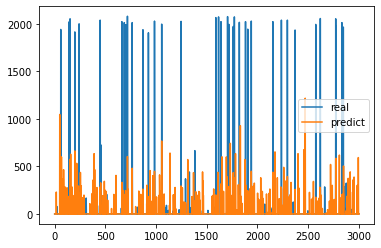

Epoch: 29; Test MAE loss on source data is: 22.940


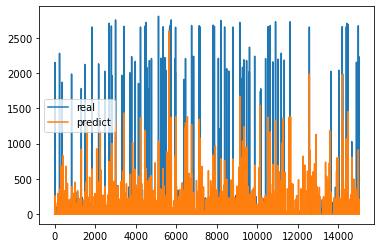

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


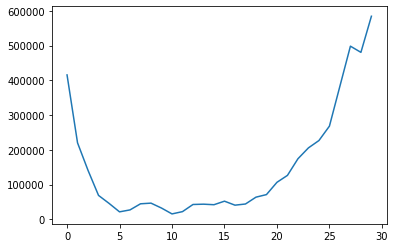

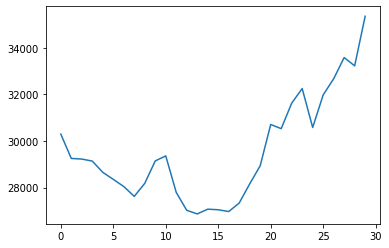

-------------------------- total running losses in 10 epoches as follows---------------------------------


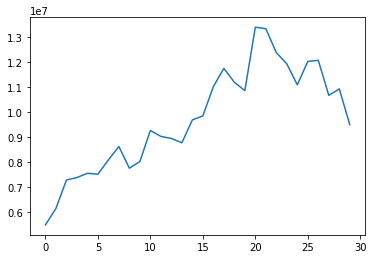

Epoch: 30; MSE loss: 10786100.791
Epoch: 30; disc loss: 683330.688
Epoch: 30; ceod loss: 37951.548
40.864026996211585
43361.425587835955
Parameter containing:
tensor([0.7706, 0.0200, 0.1694, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 10176800.688
Epoch: 31; disc loss: 684778.736
Epoch: 31; ceod loss: 38654.634
44.65967399068425
43023.705920314875
Parameter containing:
tensor([0.7972, 0.0200, 0.1428, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 10065692.827
Epoch: 32; disc loss: 654674.460
Epoch: 32; ceod loss: 39295.251
42.122877095098026
43796.40617932879
Parameter containing:
tensor([0.8236, 0.0200, 0.1164, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 10334173.149
Epoch: 33; disc loss: 734180.327
Epoch: 33; ceod loss: 39571.832
56.95987657422867
52195.14274141146
Parameter containing:
tensor([0.8537, 0.0200, 0.0863, 0.0200, 0.0200], device='cuda:0',
       requires_grad=Tr

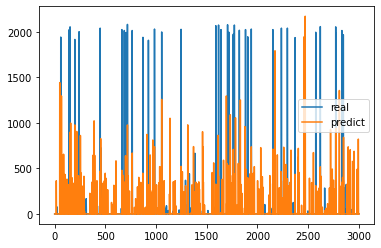

Epoch: 39; Test MAE loss on source data is: 29.029


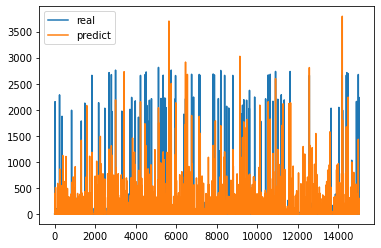

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


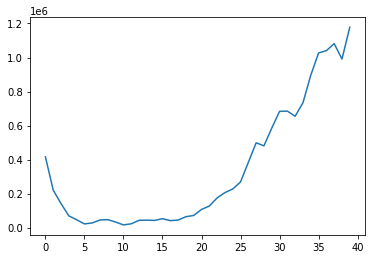

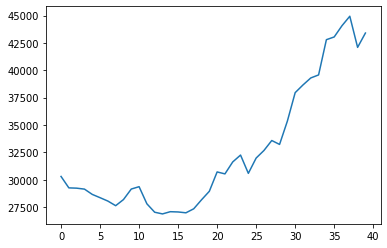

-------------------------- total running losses in 10 epoches as follows---------------------------------


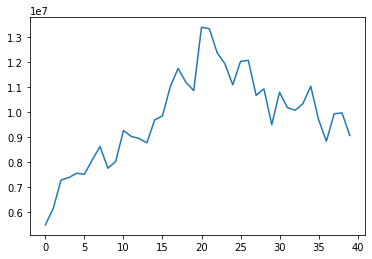

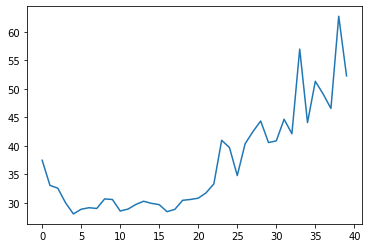

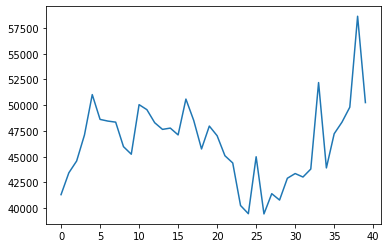

52.26528021534496
0.3754289728566304
0.9862166760394909
Parameter containing:
tensor([0.9200, 0.0200, 0.0200, 0.0200, 0.0200], device='cuda:0',
       requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [0,2,5]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
        lr = 0.0001
        lr1=0.000001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(1):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(2):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)

In [ ]:
######################################dishwasher###############################################################
# #trainfile4="/content/drive/MyDrive/training_data/dishwasher_test_.csv"
# trainfile1="/content/drive/MyDrive/training_data/dishwasher_house_3_training_.csv"

# trainfile2="/content/drive/MyDrive/ukdale_training/dishwasher_house_2_training_.csv"
# # trainfile3="/content/drive/MyDrive/ukdale_training/fridge_house_2_training_.csv"
# trainfile3="/content/drive/MyDrive/refit_training/dishwasher/dishwasher_house_13_training_.csv"
# trainfile4="/content/drive/MyDrive/refit_training/dishwasher/dishwasher_house_18_training_.csv"

# fileList=[trainfile1,trainfile2,trainfile3,trainfile4]
# stepsizeList=[2,16,16,16]
trainfile1="/content/drive/MyDrive/training_data/dishwasher_test_.csv"
trainfile2="/content/drive/MyDrive/training_data/dishwasher_house_2_training_.csv"
trainfile3="/content/drive/MyDrive/ukdale_training/dishwasher_house_1_training_.csv"
trainfile4="/content/drive/MyDrive/ukdale_training/dishwasher_house_2_training_.csv"
trainfile5="/content/drive/MyDrive/refit_training/dishwasher/dishwasher_house_13_training_.csv"
trainfile6="/content/drive/MyDrive/refit_training/dishwasher/dishwasher_house_18_training_.csv"
fileList=[trainfile1,trainfile2,trainfile3,trainfile4,trainfile5,trainfile6]
stepsizeList=[2,2,16,16,16,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=10
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    Y=Y.reshape(-1,1)
    data_insts.append(X)
    data_labels.append(Y)
    num_insts.append(X.shape[0])
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[15017, 15017, 15017, 15017, 15017, 15017]


In [ ]:
trainfile1="/content/drive/MyDrive/training_data/dishwasher_test_.csv"
trainfile2="/content/drive/MyDrive/refit_training/dishwasher/dishwasher_house_18_training_.csv"

fileList=[trainfile1,trainfile2]
stepsizeList=[2,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=10
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    Y=Y.reshape(-1,1)
    data_insts.append(X)
    data_labels.append(Y)
    num_insts.append(X.shape[0])
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[19705, 19705]



 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 0 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 13806918.000
35.81384081468062
24548.52395123897
Epoch: 1; MSE loss: 11813443.000
44.34480653492986
32990.59452613532
Epoch: 2; MSE loss: 12129651.000
51.534461873171594
43971.922979368304
Epoch: 3; MSE loss: 12867860.000
44.111786236393364
37430.162404710085
Epoch: 4; MSE loss: 12163116.000
41.362680650368404
34311.48385373751
Epoch: 5; MSE loss: 12424722.000
50.07377496666486
50946.061195426875
Epoch: 6; MSE loss: 12049484.000
50.68597736255193
51200.710401497054
Epoch: 7; MSE loss: 11406173.000
43.3015952600921
39451.62003990893
Epoch: 8; MSE loss: 11198543.000
43.63612871713307
42310.230413209814
Epoch: 9; MSE loss: 10492533.000
42.562270967284604
40981.05069134578
Epoch: 10; Test MAE loss on target data is: 42.562
Epoch: 10; Test MSE loss on target data 

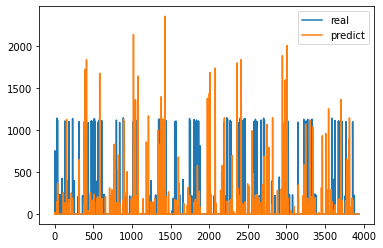

Epoch: 10; Test MAE loss on source data is: 18.726
Epoch: 10; Test MSE loss on source data is: 26165.978


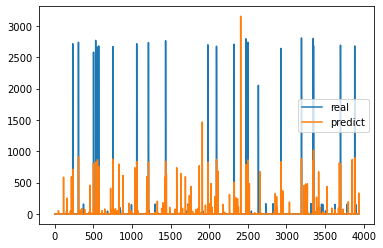

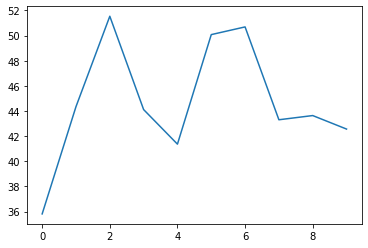

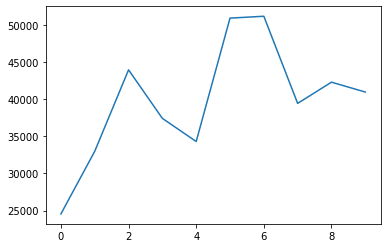

------------Domain Adaptation------------
Epoch: 0; MSE loss: 2024266.322
Epoch: 0; disc loss: 392336.017
Epoch: 0; ceod loss: 6918.420
37.448018032595215
32683.015161036943
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 1; MSE loss: 2686507.370
Epoch: 1; disc loss: 405900.988
Epoch: 1; ceod loss: 6973.749
45.943390077940855
49674.18364106387
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 2; MSE loss: 2235574.938
Epoch: 2; disc loss: 370119.122
Epoch: 2; ceod loss: 6979.277
42.262185276431865
41662.215809911264
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 3; MSE loss: 2263822.180
Epoch: 3; disc loss: 343966.157
Epoch: 3; ceod loss: 6325.421
39.312797340697
36360.802755462704
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 4; MSE loss: 2297948.338
Epoch: 4; disc loss: 347964.654
Epoch: 4; ceod loss: 6223.939
40.126470608022785
38960.76968040585
Parameter conta

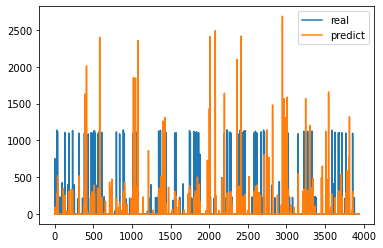

Epoch: 9; Test MAE loss on source data is: 18.790


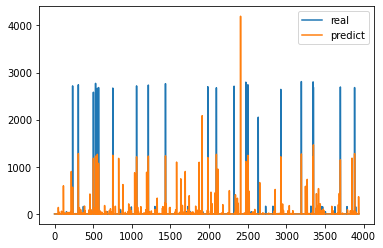

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


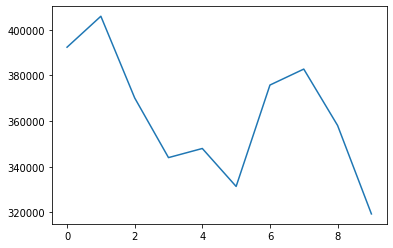

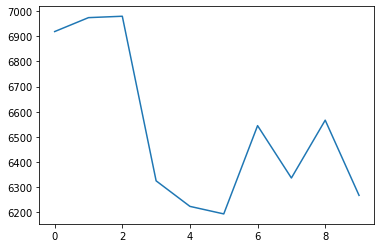

-------------------------- total running losses in 10 epoches as follows---------------------------------


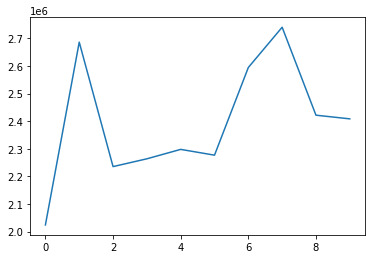

Epoch: 10; MSE loss: 3008423.363
Epoch: 10; disc loss: 342853.053
Epoch: 10; ceod loss: 6211.401
37.10413329004183
37538.10725289091
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 11; MSE loss: 2290602.821
Epoch: 11; disc loss: 355511.986
Epoch: 11; ceod loss: 6259.390
31.451659344108357
27050.111870450783
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 12; MSE loss: 2624459.553
Epoch: 12; disc loss: 350963.973
Epoch: 12; ceod loss: 6557.001
35.00620684929833
33836.33732074934
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 13; MSE loss: 2613291.400
Epoch: 13; disc loss: 306012.134
Epoch: 13; ceod loss: 6386.700
31.28840163806101
27165.579346489118
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 14; MSE loss: 2422016.383
Epoch: 14; disc loss: 350110.299
Epoch: 14; ceod loss: 6439.014
37.53402240657165
47124.92062323959
Parameter containing:
tensor([1.], device='c

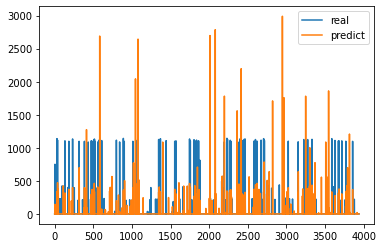

Epoch: 19; Test MAE loss on source data is: 18.772


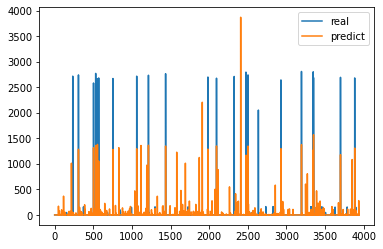

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


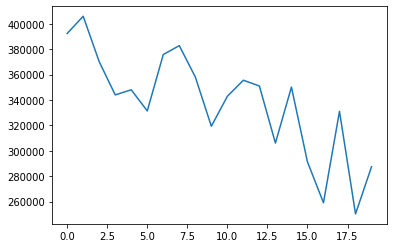

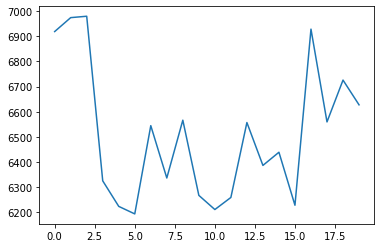

-------------------------- total running losses in 10 epoches as follows---------------------------------


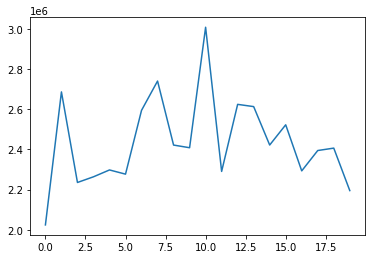

Epoch: 20; MSE loss: 2216444.822
Epoch: 20; disc loss: 323864.415
Epoch: 20; ceod loss: 6610.011
35.479166900709295
35965.95162062961
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 21; MSE loss: 2829157.772
Epoch: 21; disc loss: 354391.463
Epoch: 21; ceod loss: 6907.204
35.63672784826109
36823.12423256373
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 22; MSE loss: 2258119.023
Epoch: 22; disc loss: 327651.613
Epoch: 22; ceod loss: 6312.663
34.89396396331514
36034.70240059222
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 23; MSE loss: 2386443.385
Epoch: 23; disc loss: 328417.731
Epoch: 23; ceod loss: 6539.009
35.64082895212142
39111.31332434605
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 24; MSE loss: 2360416.564
Epoch: 24; disc loss: 316682.639
Epoch: 24; ceod loss: 6309.267
35.59295266499165
38504.286423814825
Parameter containing:
tensor([1.], device='cu

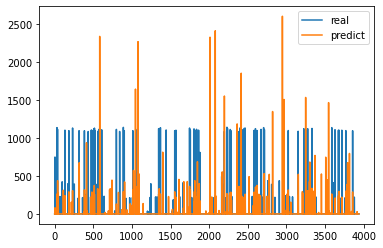

Epoch: 29; Test MAE loss on source data is: 17.178


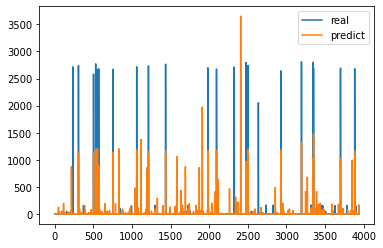

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


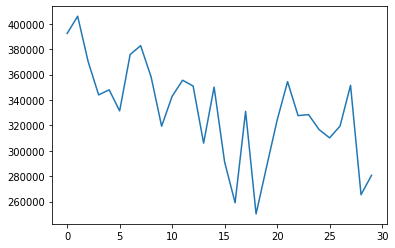

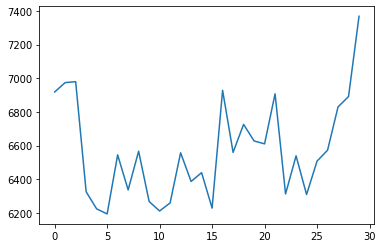

-------------------------- total running losses in 10 epoches as follows---------------------------------


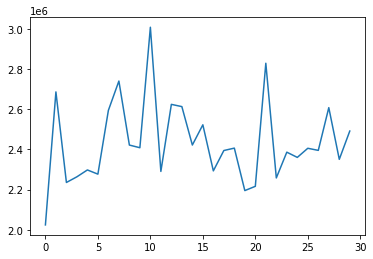

Epoch: 30; MSE loss: 2209083.232
Epoch: 30; disc loss: 294058.868
Epoch: 30; ceod loss: 6824.919
32.15693054730684
29091.37772561456
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 31; MSE loss: 2496532.799
Epoch: 31; disc loss: 275656.169
Epoch: 31; ceod loss: 6582.754
32.028278917565736
27844.33810114378
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 32; MSE loss: 2260600.516
Epoch: 32; disc loss: 342796.629
Epoch: 32; ceod loss: 7207.298
34.31408109243858
29675.47137291205
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 33; MSE loss: 2777905.960
Epoch: 33; disc loss: 232850.999
Epoch: 33; ceod loss: 7868.930
42.64136801534908
53289.395933560205
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 34; MSE loss: 2319166.774
Epoch: 34; disc loss: 307424.501
Epoch: 34; ceod loss: 6963.351
32.41289314719149
30074.880299781453
Parameter containing:
tensor([1.], device='c

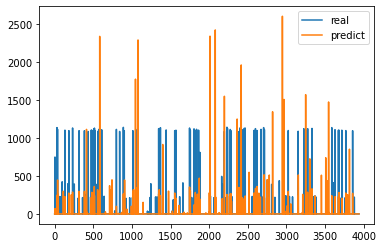

Epoch: 39; Test MAE loss on source data is: 16.749


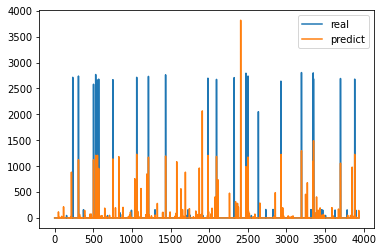

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


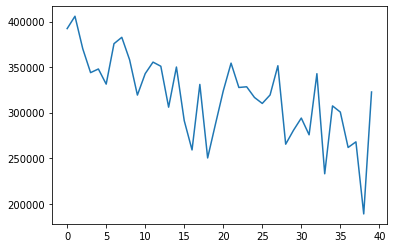

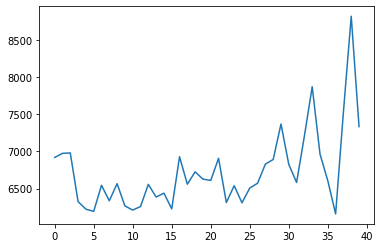

-------------------------- total running losses in 10 epoches as follows---------------------------------


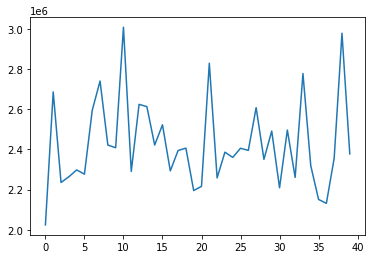

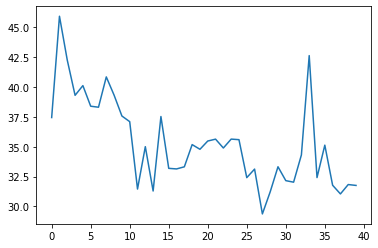

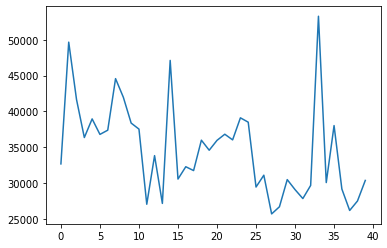

31.755211720125406
0.40881630569571537
1.1252521980785977
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [0]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
        lr = 0.0001
        lr1=0.000001
        batch_size =256
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(2):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(1):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)


 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 4 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 9488271.000
35.02566787586132
49402.36397201687
Epoch: 1; MSE loss: 9643521.000
41.27439073970065
45261.202200380765
Epoch: 2; MSE loss: 8606491.000
44.555311923667404
43587.29160369466
Epoch: 3; MSE loss: 8634741.000
42.982730346018776
43253.69503945308
Epoch: 4; MSE loss: 8620021.000
55.89374940931306
41325.289489832205
Epoch: 5; MSE loss: 7754212.500
48.26027322449559
41399.685311264264
Epoch: 6; MSE loss: 7240011.500
57.129622512341996
42343.58935412637
Epoch: 7; MSE loss: 7790753.000
81.10294736497298
49276.31532489708
Epoch: 8; MSE loss: 7618509.500
62.79546770028839
42543.023780890835
Epoch: 9; MSE loss: 7188492.000
57.00893873218187
42278.40932601587
Epoch: 10; Test MAE loss on target data is: 57.009
Epoch: 10; Test MSE loss on target data is: 42278.4

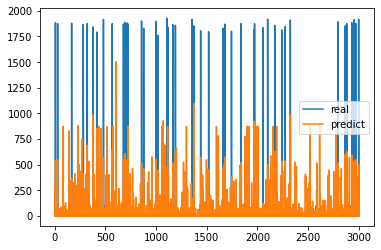

Epoch: 10; Test MAE loss on source data is: 32.825
Epoch: 10; Test MSE loss on source data is: 31527.957


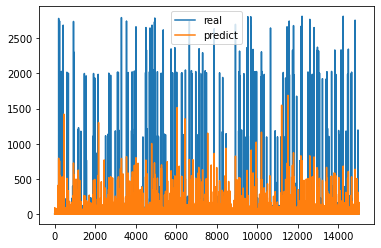

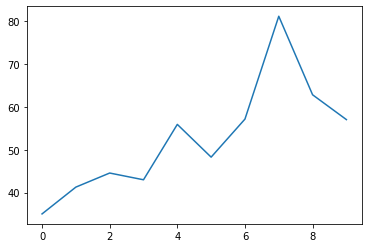

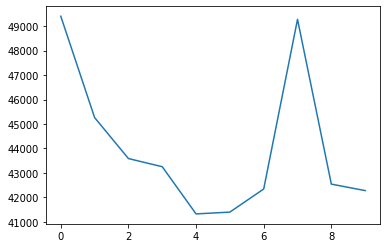

------------Domain Adaptation------------
Epoch: 0; MSE loss: 6526178.920
Epoch: 0; disc loss: 548165.935
Epoch: 0; ceod loss: 28844.757
67.07297126037228
46783.67993911007
Parameter containing:
tensor([0.2056, 0.1974, 0.2014, 0.2000, 0.1956], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 6993213.565
Epoch: 1; disc loss: 442421.619
Epoch: 1; ceod loss: 31077.393
64.95319756428735
47096.031677213294
Parameter containing:
tensor([0.2033, 0.1974, 0.2019, 0.2058, 0.1915], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 7367741.346
Epoch: 2; disc loss: 350329.708
Epoch: 2; ceod loss: 31208.135
56.83376185648818
44528.28128341541
Parameter containing:
tensor([0.1966, 0.1898, 0.2069, 0.2156, 0.1912], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 7630553.869
Epoch: 3; disc loss: 300201.774
Epoch: 3; ceod loss: 31144.891
69.95611118297086
48460.524831746545
Parameter containing:
tensor([0.1848, 0.1816, 0.2090, 0.2318, 0.1928], device='cuda:0',

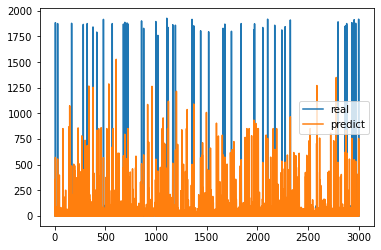

Epoch: 9; Test MAE loss on source data is: 40.590


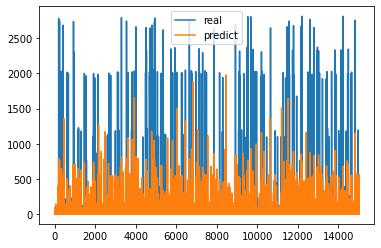

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


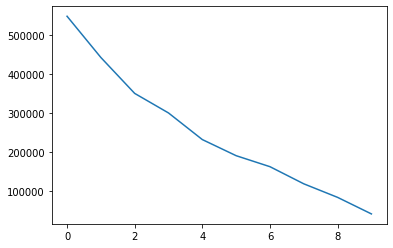

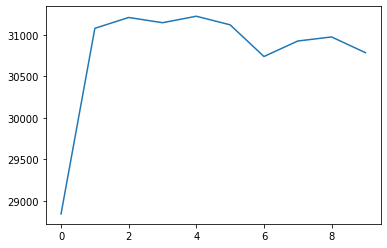

-------------------------- total running losses in 10 epoches as follows---------------------------------


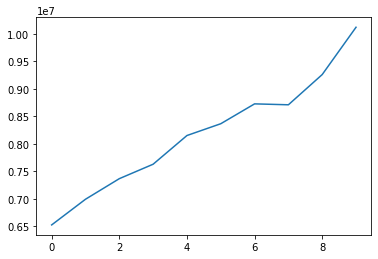

Epoch: 10; MSE loss: 10689374.467
Epoch: 10; disc loss: 27897.369
Epoch: 10; ceod loss: 31846.852
58.071325529145994
44832.84125017751
Parameter containing:
tensor([0.0200, 0.0200, 0.1422, 0.7183, 0.0995], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 10187965.767
Epoch: 11; disc loss: 28956.752
Epoch: 11; ceod loss: 32050.893
54.746785290928656
43970.85840464682
Parameter containing:
tensor([0.0200, 0.0200, 0.1184, 0.7782, 0.0634], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 10890853.958
Epoch: 12; disc loss: 35958.266
Epoch: 12; ceod loss: 32634.187
56.734554252898526
44451.25156728212
Parameter containing:
tensor([0.0200, 0.0200, 0.1024, 0.8268, 0.0308], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 10697087.708
Epoch: 13; disc loss: 54259.618
Epoch: 13; ceod loss: 32401.477
51.79447450634333
44093.42079591437
Parameter containing:
tensor([0.0200, 0.0200, 0.0934, 0.8466, 0.0200], device='cuda:0',
       requires_grad=True)
E

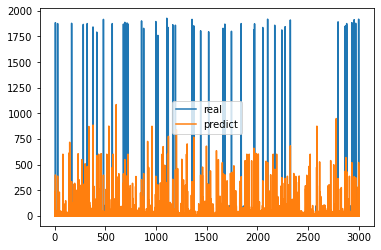

Epoch: 19; Test MAE loss on source data is: 32.674


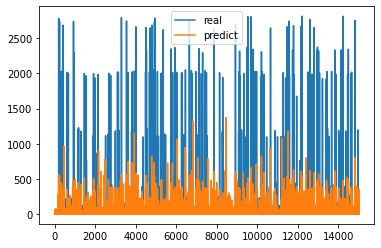

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


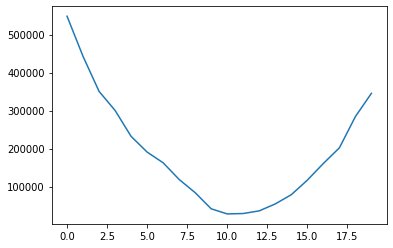

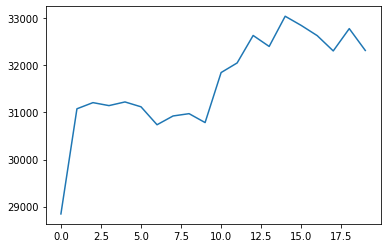

-------------------------- total running losses in 10 epoches as follows---------------------------------


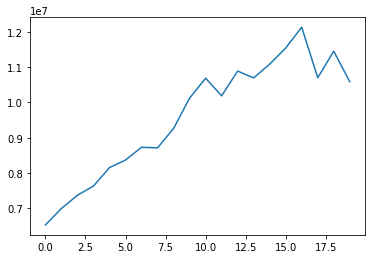

Epoch: 20; MSE loss: 10661286.503
Epoch: 20; disc loss: 404515.718
Epoch: 20; ceod loss: 32188.224
60.18940278227018
44681.617542896405
Parameter containing:
tensor([0.0200, 0.0200, 0.0878, 0.8521, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 11207281.316
Epoch: 21; disc loss: 470926.394
Epoch: 21; ceod loss: 32428.800
58.96232563291444
45199.84942972547
Parameter containing:
tensor([0.0200, 0.0200, 0.0740, 0.8660, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 10547492.724
Epoch: 22; disc loss: 569410.673
Epoch: 22; ceod loss: 32107.663
57.88410395709736
44677.05436644925
Parameter containing:
tensor([0.0200, 0.0200, 0.0476, 0.8924, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 10143388.045
Epoch: 23; disc loss: 728834.715
Epoch: 23; ceod loss: 32335.661
66.08600793397376
47426.06427985241
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.9200, 0.0200], device='cuda:0',
       requires_grad=True)

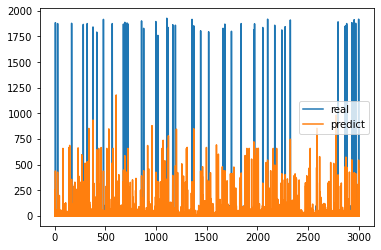

Epoch: 29; Test MAE loss on source data is: 33.863


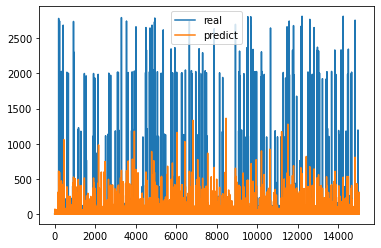

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


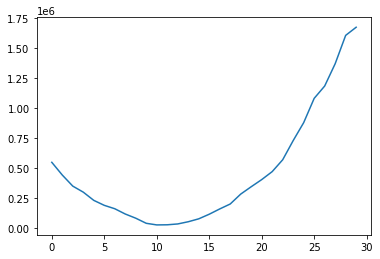

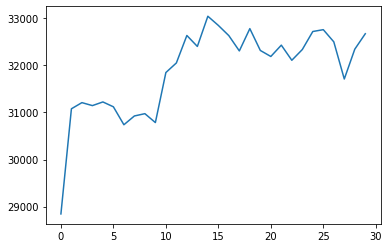

-------------------------- total running losses in 10 epoches as follows---------------------------------


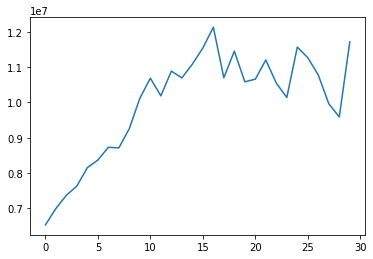

Epoch: 30; MSE loss: 10677296.487
Epoch: 30; disc loss: 1886495.325
Epoch: 30; ceod loss: 32781.938
57.700514420750395
43726.65596503408
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.9200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 11245532.006
Epoch: 31; disc loss: 1887570.355
Epoch: 31; ceod loss: 32476.455
56.68179643650002
43330.96249631291
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.9200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 10123483.407
Epoch: 32; disc loss: 2259614.654
Epoch: 32; ceod loss: 31227.780
55.57317048698768
43690.73250983194
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.9200, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 12040491.353
Epoch: 33; disc loss: 2375623.823
Epoch: 33; ceod loss: 32567.322
58.77030754988931
44127.22894604773
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.9200, 0.0200], device='cuda:0',
       requires_grad=T

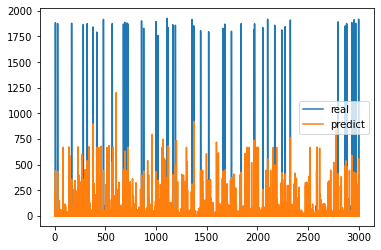

Epoch: 39; Test MAE loss on source data is: 32.166


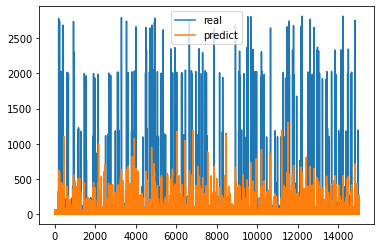

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


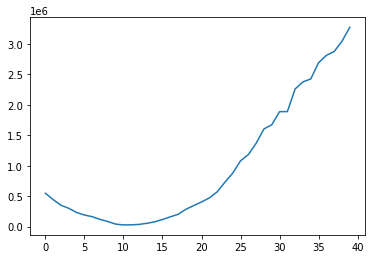

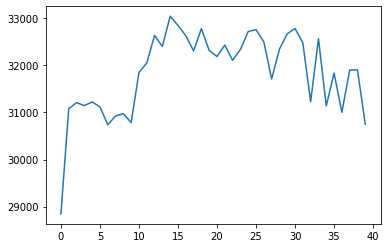

-------------------------- total running losses in 10 epoches as follows---------------------------------


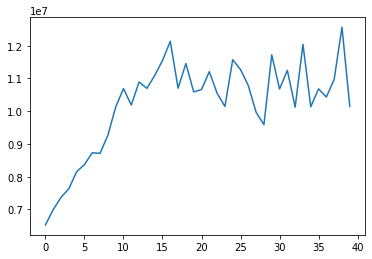

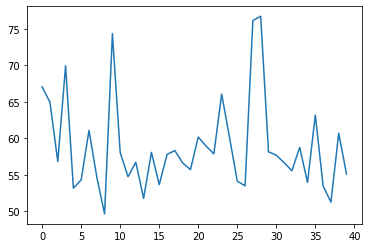

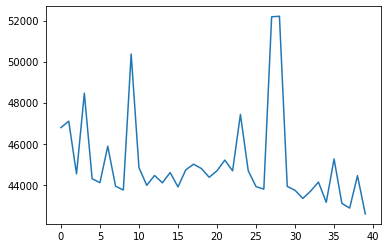

55.12110514597646
0.3565359801733563
0.8867477213369491
Parameter containing:
tensor([0.0200, 0.0200, 0.0200, 0.9200, 0.0200], device='cuda:0',
       requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [4]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.0001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
#         lr = 0.0001
#         lr1=0.000001
#         batch_size =64
#         b1=0.99
#         b2=0.999
# #         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
# #         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
#         opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
#         opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
#         opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
#         opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
#         opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
#         opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
#         model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(2):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(2):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(3):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)

In [ ]:
# ######################################microwave###############################################################
# #trainfile4="/content/drive/MyDrive/training_data/dishwasher_test_.csv"
# # trainfile2="/content/drive/MyDrive/training_data/microwave_house_3_training_.csv"

# # trainfile1="/content/drive/MyDrive/ukdale_training/microwave_house_2_training_.csv"
# # trainfile3="/content/drive/MyDrive/ukdale_training/fridge_house_2_training_.csv"
# trainfile4="/content/drive/MyDrive/refit_training/microwave/microwave_house_10_training_.csv"
# trainfile3="/content/drive/MyDrive/refit_training/microwave/microwave_house_17_training_.csv"

# fileList=[trainfile1,trainfile2,trainfile3,trainfile4]
# stepsizeList=[16,2,16,16]
# data_insts, data_labels, num_insts,on = [], [], [],[]
# threshold=200
# for i in range(len(fileList)):
#     X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
#     Y=Y.reshape(-1,1)
#     data_insts.append(X)
#     data_labels.append(Y)
#     num_insts.append(X.shape[0])
# min_size=min(num_insts)
# x_tem, y_tem=[],[]
# for j in range(len(fileList)):
#   ridx = np.random.choice(num_insts[j], min_size)
#   x_tem.append(data_insts[j][ridx, :])
#   y_tem.append(data_labels[j][ridx, :])
#   num_insts[j]=x_tem[j].shape[0]
# data_insts=x_tem
# data_labels=y_tem 
# print(num_insts)

In [ ]:
# ######################################microwave###############################################################
#trainfile4="/content/drive/MyDrive/training_data/dishwasher_test_.csv"
# trainfile1="/content/drive/MyDrive/training_data/microwave_house_3_training_.csv"

# trainfile2="/content/drive/MyDrive/ukdale_training/microwave_house_2_training_.csv"
# # trainfile3="/content/drive/MyDrive/ukdale_training/fridge_house_2_training_.csv"
# trainfile3="/content/drive/MyDrive/refit_training/microwave/microwave_house_10_training_.csv"
# trainfile4="/content/drive/MyDrive/refit_training/microwave/microwave_house_17_training_.csv"

# fileList=[trainfile1,trainfile2,trainfile3,trainfile4]
# stepsizeList=[2,16,16,16]

trainfile1="/content/drive/MyDrive/training_data/microwave_test_.csv"
trainfile2="/content/drive/MyDrive/training_data/microwave_house_2_training_.csv"
trainfile3="/content/drive/MyDrive/ukdale_training/microwave_house_1_training_.csv"
trainfile4="/content/drive/MyDrive/ukdale_training/microwave_house_2_training_.csv"
trainfile5="/content/drive/MyDrive/refit_training/microwave/microwave_house_10_training_.csv"
trainfile6="/content/drive/MyDrive/refit_training/microwave/microwave_house_17_training_.csv"
fileList=[trainfile1,trainfile2,trainfile3,trainfile4,trainfile5,trainfile6]
stepsizeList=[2,2,16,16,16,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=200
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    X_on=X[Y>0]
    Y_on=Y[Y>0]
    X_off=X[Y==0]
    Y_off=Y[Y==0]
    ridx = np.random.choice(X_off.shape[0], int(len(Y_on)*50))
    X_off = X_off[ridx, :]
    Y_on=Y_on.reshape(-1,1)
    Y_off=Y_off.reshape(-1,1)
    Y_off = Y_off[ridx, :]
    X_pre=np.concatenate([X_on,X_off], axis=0)
    Y_pre=np.concatenate([Y_on,Y_off], axis=0)
    on.append(Y_on)
    data_insts.append(X_pre)
    data_labels.append(Y_pre)
    num_insts.append(X_pre.shape[0])
    # r_order = np.arange(num_insts[i])
    # np.random.shuffle(r_order)
    # data_insts[i] = data_insts[i][r_order, :]
    # data_labels[i] = data_labels[i][r_order,:]
print(num_insts)
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[13311, 2907, 51816, 4335, 11475, 10302]
[2907, 2907, 2907, 2907, 2907, 2907]


In [ ]:
trainfile1="/content/drive/MyDrive/training_data/microwave_test_.csv"
trainfile2="/content/drive/MyDrive/refit_training/microwave/microwave_house_17_training_.csv"
fileList=[trainfile1,trainfile2]
stepsizeList=[2,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=200
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    X_on=X[Y>0]
    Y_on=Y[Y>0]
    X_off=X[Y==0]
    Y_off=Y[Y==0]
    ridx = np.random.choice(X_off.shape[0], int(len(Y_on)*50))
    X_off = X_off[ridx, :]
    Y_on=Y_on.reshape(-1,1)
    Y_off=Y_off.reshape(-1,1)
    Y_off = Y_off[ridx, :]
    X_pre=np.concatenate([X_on,X_off], axis=0)
    Y_pre=np.concatenate([Y_on,Y_off], axis=0)
    on.append(Y_on)
    data_insts.append(X_pre)
    data_labels.append(Y_pre)
    num_insts.append(X_pre.shape[0])
    # r_order = np.arange(num_insts[i])
    # np.random.shuffle(r_order)
    # data_insts[i] = data_insts[i][r_order, :]
    # data_labels[i] = data_labels[i][r_order,:]
print(num_insts)
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[13311, 10302]
[10302, 10302]



 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 0 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 5209638.500
27.582938445597488
37294.47815772266
Epoch: 1; MSE loss: 5191712.500
28.55233234181258
36230.81868251786
Epoch: 2; MSE loss: 5372607.500
29.60064071499609
34821.22967726404
Epoch: 3; MSE loss: 5288645.000
28.87251800662604
34726.42355521307
Epoch: 4; MSE loss: 5314192.000
31.655100755958053
34071.80444576084
Epoch: 5; MSE loss: 4796179.500
30.581524387203228
34211.44205856638
Epoch: 6; MSE loss: 4356175.000
34.853939394511016
33898.87153257401
Epoch: 7; MSE loss: 4673346.000
31.10844524763133
33908.07328252306
Epoch: 8; MSE loss: 4344804.000
36.1046438573774
34854.634804087116
Epoch: 9; MSE loss: 4002120.250
30.743124787399424
33262.786269142875
Epoch: 10; Test MAE loss on target data is: 30.743
Epoch: 10; Test MSE loss on target data is: 33262.78

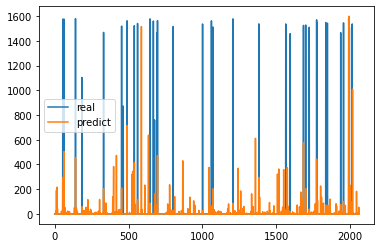

Epoch: 10; Test MAE loss on source data is: 25.845
Epoch: 10; Test MSE loss on source data is: 21385.501


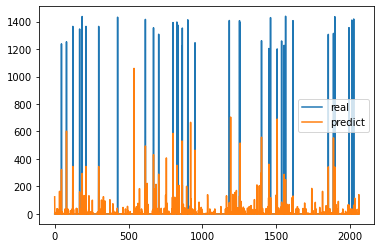

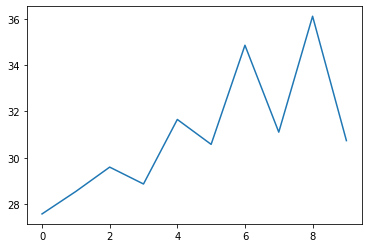

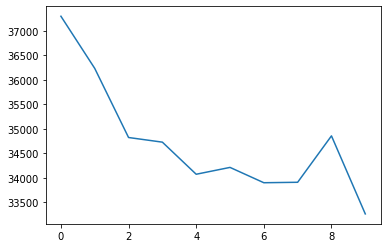

------------Domain Adaptation------------
Epoch: 0; MSE loss: 1693274.228
Epoch: 0; disc loss: 52989.149
Epoch: 0; ceod loss: 12232.573
32.353257160826004
35294.75920841934
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 1; MSE loss: 1627405.515
Epoch: 1; disc loss: 65730.305
Epoch: 1; ceod loss: 15024.775
36.48667660874205
36053.713148322175
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 2; MSE loss: 1768319.928
Epoch: 2; disc loss: 69853.881
Epoch: 2; ceod loss: 14923.514
37.510300185188555
36870.020265979634
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 3; MSE loss: 1995658.495
Epoch: 3; disc loss: 43529.210
Epoch: 3; ceod loss: 14933.534
36.35320543819057
35275.38526389333
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 4; MSE loss: 1675508.897
Epoch: 4; disc loss: 53695.066
Epoch: 4; ceod loss: 14132.857
33.25230615370105
33157.593324157264
Parameter conta

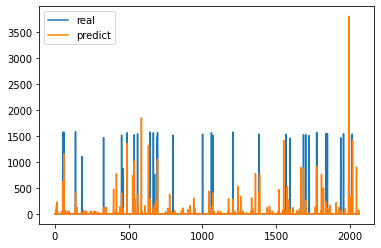

Epoch: 9; Test MAE loss on source data is: 21.441


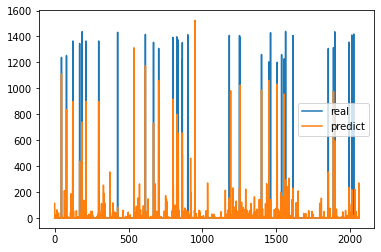

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


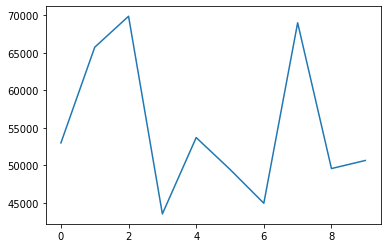

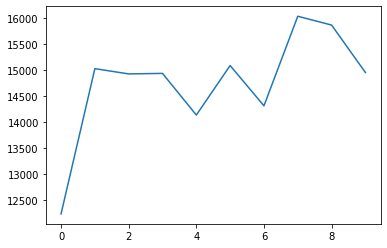

-------------------------- total running losses in 10 epoches as follows---------------------------------


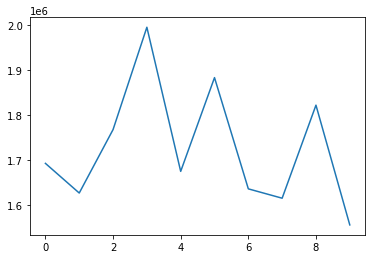

Epoch: 10; MSE loss: 1465083.826
Epoch: 10; disc loss: 66599.024
Epoch: 10; ceod loss: 16999.176
33.77474250304151
34203.62600946101
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 11; MSE loss: 1355231.276
Epoch: 11; disc loss: 68809.720
Epoch: 11; ceod loss: 16635.708
33.534697716914394
34028.041745505885
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 12; MSE loss: 1309605.280
Epoch: 12; disc loss: 98250.148
Epoch: 12; ceod loss: 16839.153
32.09753848382092
32859.68309302253
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 13; MSE loss: 1483887.693
Epoch: 13; disc loss: 90088.805
Epoch: 13; ceod loss: 16904.329
35.412087229910306
44165.25975215671
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 14; MSE loss: 1471554.423
Epoch: 14; disc loss: 82766.576
Epoch: 14; ceod loss: 15819.580
33.950941306108845
33800.13799990656
Parameter containing:
tensor([1.], device='

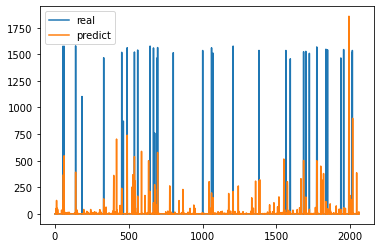

Epoch: 19; Test MAE loss on source data is: 21.367


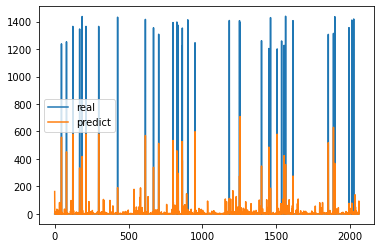

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


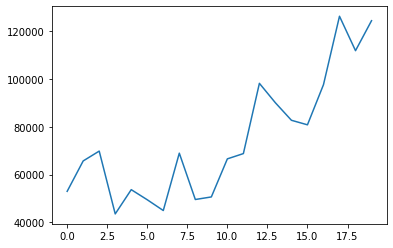

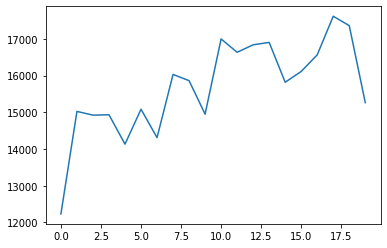

-------------------------- total running losses in 10 epoches as follows---------------------------------


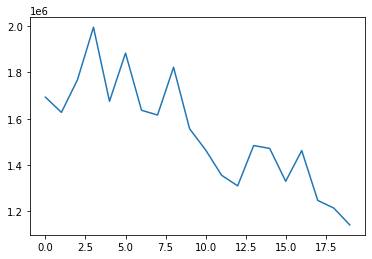

Epoch: 20; MSE loss: 1155887.119
Epoch: 20; disc loss: 106239.249
Epoch: 20; ceod loss: 16523.336
40.46113176841711
47851.15031401079
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 21; MSE loss: 1217335.024
Epoch: 21; disc loss: 113306.115
Epoch: 21; ceod loss: 14284.088
35.795711938165866
38264.16877705321
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 22; MSE loss: 1341190.714
Epoch: 22; disc loss: 120497.787
Epoch: 22; ceod loss: 14174.168
32.712336305043266
34324.84558830484
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 23; MSE loss: 984298.899
Epoch: 23; disc loss: 131931.090
Epoch: 23; ceod loss: 16809.999
30.770326898277972
33220.279005852775
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 24; MSE loss: 1154972.073
Epoch: 24; disc loss: 133242.355
Epoch: 24; ceod loss: 16104.159
37.09374499866613
39868.09145655379
Parameter containing:
tensor([1.], devi

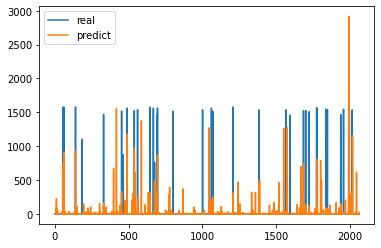

Epoch: 29; Test MAE loss on source data is: 15.893


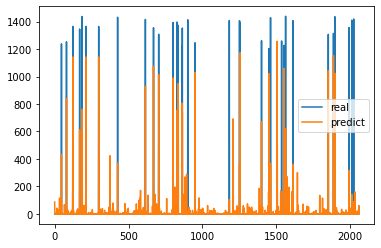

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


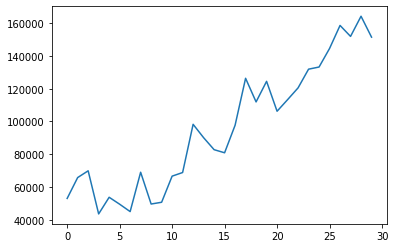

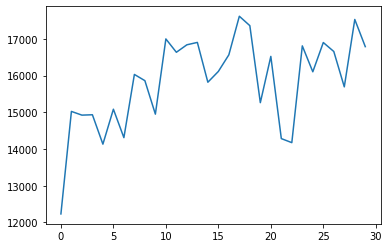

-------------------------- total running losses in 10 epoches as follows---------------------------------


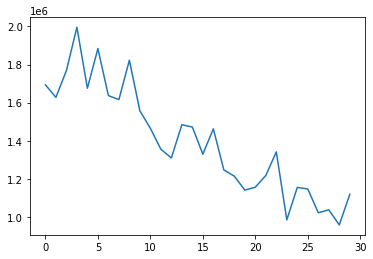

Epoch: 30; MSE loss: 1065561.624
Epoch: 30; disc loss: 145660.901
Epoch: 30; ceod loss: 17479.137
40.92737759769833
38331.4919300155
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 31; MSE loss: 1202063.600
Epoch: 31; disc loss: 181099.054
Epoch: 31; ceod loss: 16240.372
31.004626205751045
31673.197287020525
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 32; MSE loss: 982177.062
Epoch: 32; disc loss: 174980.829
Epoch: 32; ceod loss: 14564.030
31.305291702128258
33539.52919099381
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 33; MSE loss: 979262.081
Epoch: 33; disc loss: 190989.012
Epoch: 33; ceod loss: 13944.477
46.291175047443296
45503.133522028904
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)
Epoch: 34; MSE loss: 1063591.908
Epoch: 34; disc loss: 153920.595
Epoch: 34; ceod loss: 15210.715
41.17640823239051
44653.93112041638
Parameter containing:
tensor([1.], devic

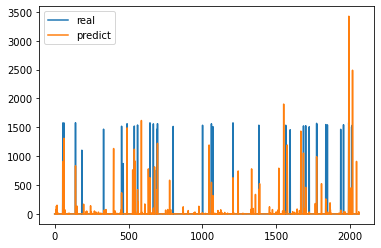

Epoch: 39; Test MAE loss on source data is: 12.102


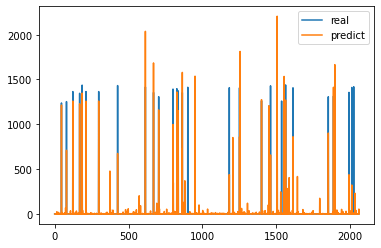

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


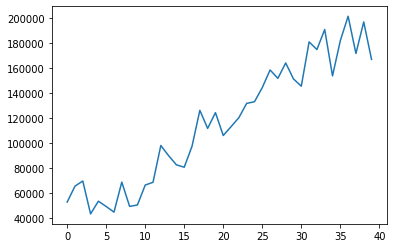

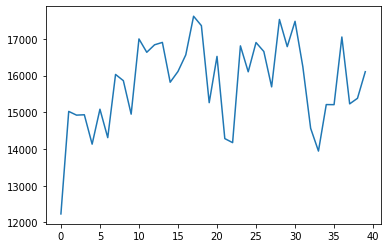

-------------------------- total running losses in 10 epoches as follows---------------------------------


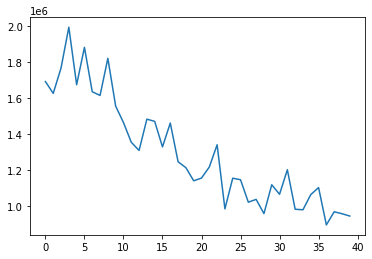

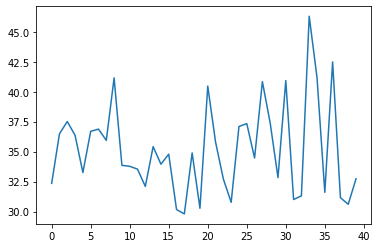

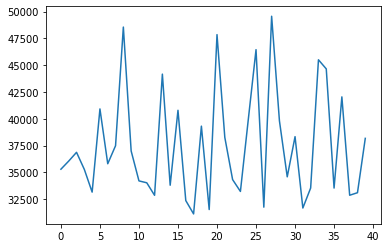

32.7317155101485
0.14828902706090896
0.9909527692619077
Parameter containing:
tensor([1.], device='cuda:0', requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [0]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.0001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
        lr = 0.0001
        lr1=0.000001
        batch_size =128
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(2):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(1):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)


 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 0 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1606986.625
30.40620889001337
40234.2769448626
Epoch: 1; MSE loss: 1680911.375
30.312078404435535
39963.6474328109
Epoch: 2; MSE loss: 1429583.375
30.34780709030702
39681.44156587797
Epoch: 3; MSE loss: 1605277.125
30.866675096637604
39013.32219724248
Epoch: 4; MSE loss: 1628125.375
30.93916062468381
38904.281461114995
Epoch: 5; MSE loss: 1584691.625
30.92428298019308
38911.178792098
Epoch: 6; MSE loss: 1696026.250
31.364405022210786
38859.12524495035
Epoch: 7; MSE loss: 1496824.250
32.06751173831318
38100.28168957259
Epoch: 8; MSE loss: 1438489.500
31.425895543237733
38297.82638135982
Epoch: 9; MSE loss: 1387344.125
33.62659995467802
37616.347838672154
Epoch: 10; Test MAE loss on target data is: 33.627
Epoch: 10; Test MSE loss on target data is: 37616.348


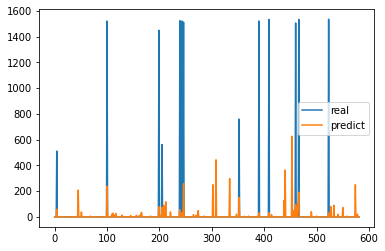

Epoch: 10; Test MAE loss on source data is: 31.257
Epoch: 10; Test MSE loss on source data is: 31547.090


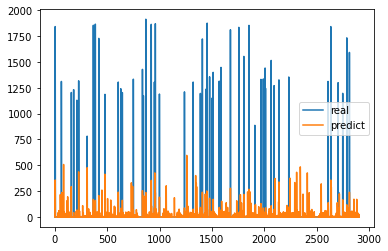

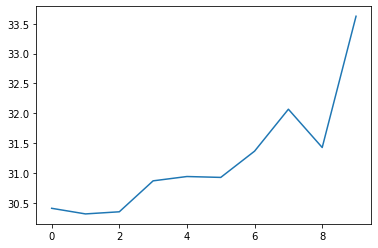

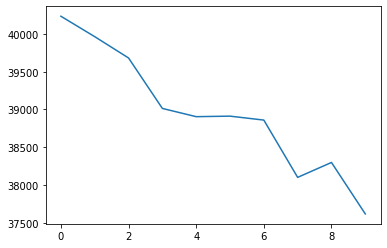

------------Domain Adaptation------------
Epoch: 0; MSE loss: 604536.384
Epoch: 0; disc loss: 830.289
Epoch: 0; ceod loss: 2390.745
31.91908550017939
38312.93482512841
Parameter containing:
tensor([0.2000, 0.1998, 0.2002, 0.2000, 0.1999], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 584081.651
Epoch: 1; disc loss: 946.820
Epoch: 1; ceod loss: 2272.734
32.01331616579667
38400.92980926422
Parameter containing:
tensor([0.2001, 0.1998, 0.2004, 0.1998, 0.2000], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 626837.845
Epoch: 2; disc loss: 1414.336
Epoch: 2; ceod loss: 2651.429
32.54861859705849
38497.4337716552
Parameter containing:
tensor([0.2002, 0.1998, 0.2005, 0.1995, 0.2000], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 640269.417
Epoch: 3; disc loss: 1342.258
Epoch: 3; ceod loss: 3004.085
32.723449703241954
38293.63543961827
Parameter containing:
tensor([0.2003, 0.1998, 0.2006, 0.1993, 0.2000], device='cuda:0',
       requires_gra

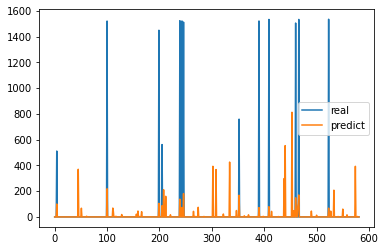

Epoch: 9; Test MAE loss on source data is: 33.894


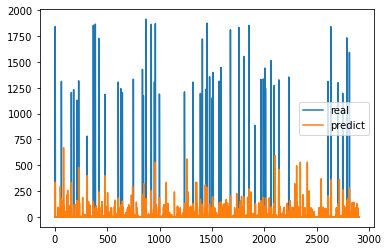

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


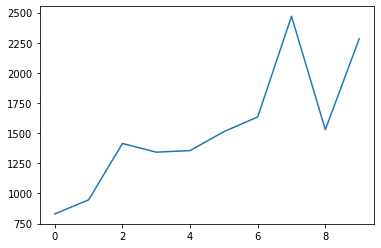

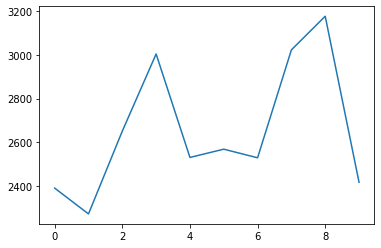

-------------------------- total running losses in 10 epoches as follows---------------------------------


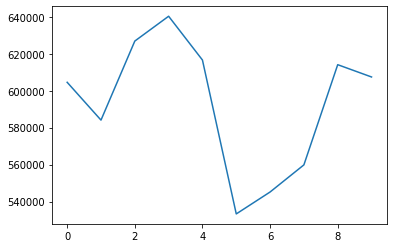

Epoch: 10; MSE loss: 544358.149
Epoch: 10; disc loss: 2551.191
Epoch: 10; ceod loss: 2646.229
38.612860445061195
41625.777810351894
Parameter containing:
tensor([0.2009, 0.1997, 0.2013, 0.1982, 0.2000], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 501910.898
Epoch: 11; disc loss: 8723.987
Epoch: 11; ceod loss: 4163.097
34.08196235481407
39247.33296537451
Parameter containing:
tensor([0.2009, 0.1997, 0.2013, 0.1980, 0.2000], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 600072.423
Epoch: 12; disc loss: 5933.607
Epoch: 12; ceod loss: 3372.953
34.40580434018035
38839.27971666766
Parameter containing:
tensor([0.2010, 0.1996, 0.2013, 0.1980, 0.2000], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 595913.953
Epoch: 13; disc loss: 3758.080
Epoch: 13; ceod loss: 2796.789
36.221853570071694
39803.76466358817
Parameter containing:
tensor([0.2012, 0.1996, 0.2013, 0.1979, 0.2000], device='cuda:0',
       requires_grad=True)
Epoch: 14; MSE lo

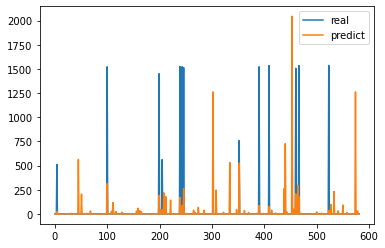

Epoch: 19; Test MAE loss on source data is: 34.811


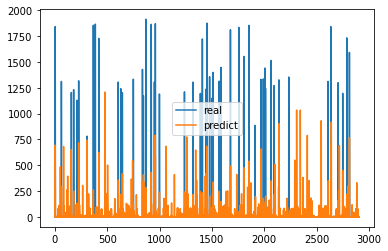

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


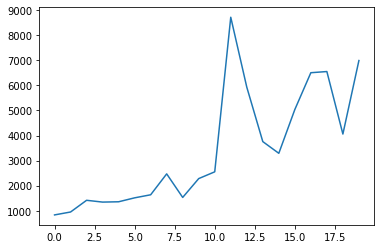

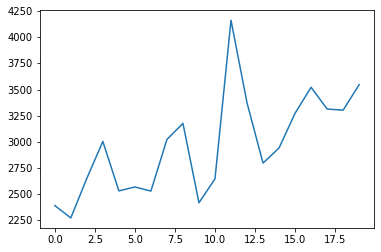

-------------------------- total running losses in 10 epoches as follows---------------------------------


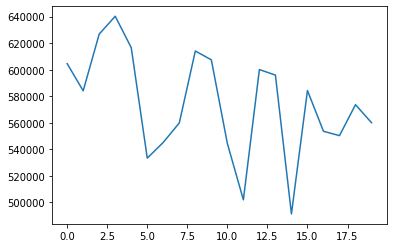

Epoch: 20; MSE loss: 526117.389
Epoch: 20; disc loss: 12582.762
Epoch: 20; ceod loss: 3847.632
39.44223057824312
46896.028486064104
Parameter containing:
tensor([0.2026, 0.1987, 0.2006, 0.1986, 0.1995], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 542541.638
Epoch: 21; disc loss: 10862.618
Epoch: 21; ceod loss: 4161.927
38.03291226298744
42765.23880304758
Parameter containing:
tensor([0.2028, 0.1986, 0.2005, 0.1988, 0.1992], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 587878.783
Epoch: 22; disc loss: 6907.737
Epoch: 22; ceod loss: 3569.474
39.24045092415359
43896.02303987058
Parameter containing:
tensor([0.2031, 0.1985, 0.2004, 0.1991, 0.1989], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 538790.273
Epoch: 23; disc loss: 10514.984
Epoch: 23; ceod loss: 4374.966
36.520917417359925
41281.721302198974
Parameter containing:
tensor([0.2033, 0.1984, 0.2003, 0.1994, 0.1986], device='cuda:0',
       requires_grad=True)
Epoch: 24; MSE

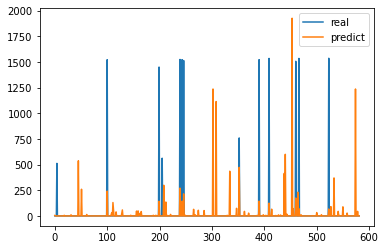

Epoch: 29; Test MAE loss on source data is: 35.216


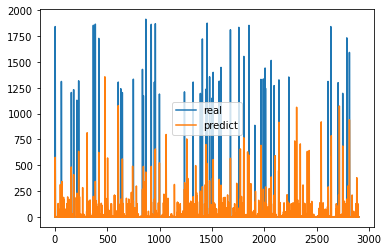

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


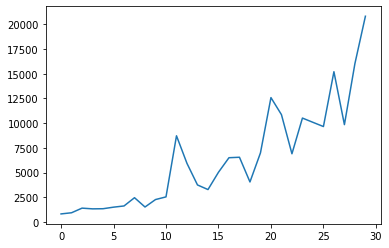

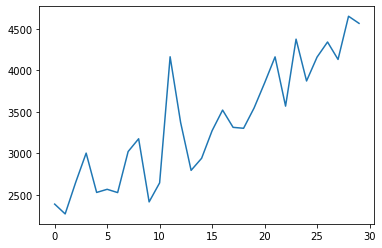

-------------------------- total running losses in 10 epoches as follows---------------------------------


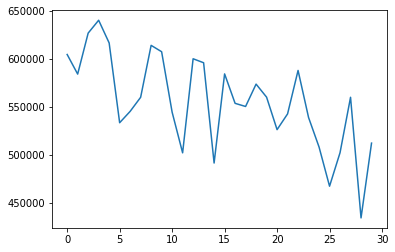

Epoch: 30; MSE loss: 496216.916
Epoch: 30; disc loss: 12416.343
Epoch: 30; ceod loss: 3745.876
40.95578150451183
44989.923405768255
Parameter containing:
tensor([0.2052, 0.1977, 0.1989, 0.2019, 0.1963], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 539995.023
Epoch: 31; disc loss: 14707.243
Epoch: 31; ceod loss: 4806.860
41.20211748937561
47275.07686584723
Parameter containing:
tensor([0.2055, 0.1977, 0.1986, 0.2023, 0.1960], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 528644.181
Epoch: 32; disc loss: 15121.290
Epoch: 32; ceod loss: 4460.372
40.814796951781844
45184.95985278194
Parameter containing:
tensor([0.2058, 0.1976, 0.1982, 0.2027, 0.1957], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 500863.296
Epoch: 33; disc loss: 16134.919
Epoch: 33; ceod loss: 3990.106
40.06589402794787
46542.79718270964
Parameter containing:
tensor([0.2060, 0.1976, 0.1979, 0.2031, 0.1954], device='cuda:0',
       requires_grad=True)
Epoch: 34; MSE

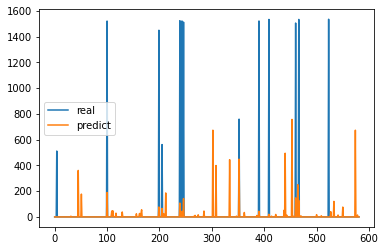

Epoch: 39; Test MAE loss on source data is: 26.849


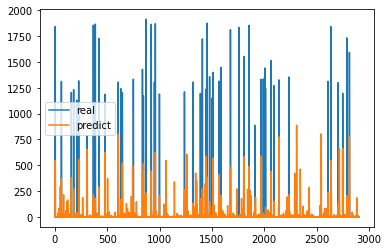

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


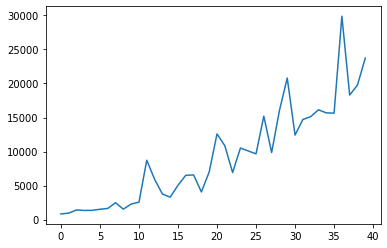

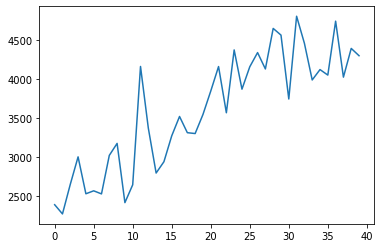

-------------------------- total running losses in 10 epoches as follows---------------------------------


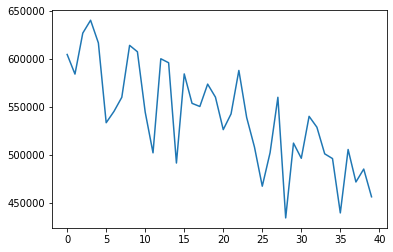

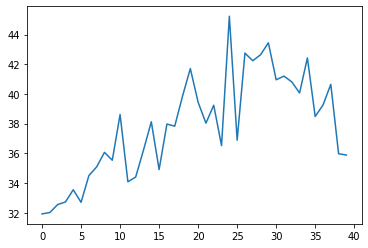

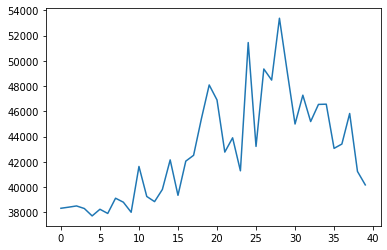

35.88576921626055
0.6046903672571416
0.983858862374375
Parameter containing:
tensor([0.2073, 0.1975, 0.1960, 0.2053, 0.1939], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 3 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1708736.250
23.797170654016057
28817.574860142202
Epoch: 1; MSE loss: 1632057.500
23.750285180458395
28371.32681154711
Epoch: 2; MSE loss: 1580302.125
23.435213006443995
28096.975088312996
Epoch: 3; MSE loss: 1638389.750
23.991092692516563
27295.636894501702
Epoch: 4; MSE loss: 1563280.250
24.06022786172395
27251.539232512543
Epoch: 5; MSE loss: 1733881.750
24.38966840413428
26509.216191076932
Epoch: 6; MSE loss: 1555104.000
25.51316365932476
26319.854728387534
Epoch: 7; MSE loss: 1462899.750
24.913038959592274
26577.051790538197
Epoch: 8; MSE loss: 1667342.875
25.056839748551347
26713.74868179423
Epoch: 9; MSE loss: 1433710.125
25.439746852541706
26738.45290

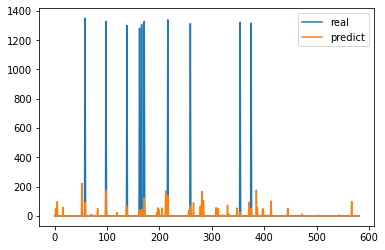

Epoch: 10; Test MAE loss on source data is: 30.633
Epoch: 10; Test MSE loss on source data is: 34168.164


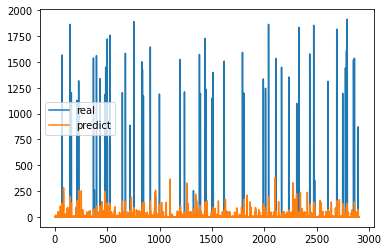

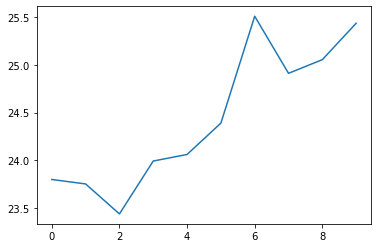

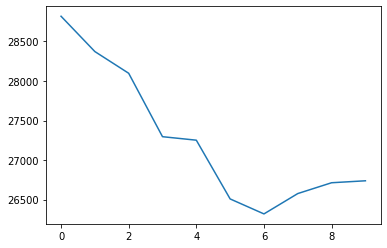

------------Domain Adaptation------------
Epoch: 0; MSE loss: 715984.222
Epoch: 0; disc loss: 1682.189
Epoch: 0; ceod loss: 2562.339
25.169184360921996
26130.300323384152
Parameter containing:
tensor([0.1999, 0.2001, 0.1999, 0.1999, 0.2001], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 687985.539
Epoch: 1; disc loss: 1615.735
Epoch: 1; ceod loss: 2935.114
25.866976938808907
25684.37655913371
Parameter containing:
tensor([0.1998, 0.2003, 0.1999, 0.1999, 0.2001], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 675325.696
Epoch: 2; disc loss: 1189.376
Epoch: 2; ceod loss: 2313.764
26.59547890748355
25286.99490324225
Parameter containing:
tensor([0.1997, 0.2003, 0.2001, 0.1998, 0.2001], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 634460.441
Epoch: 3; disc loss: 1319.555
Epoch: 3; ceod loss: 2465.055
25.479420269426612
25795.269471553514
Parameter containing:
tensor([0.1996, 0.2004, 0.2002, 0.1997, 0.2000], device='cuda:0',
       requi

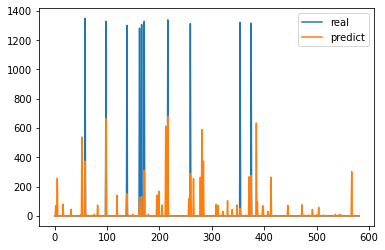

Epoch: 9; Test MAE loss on source data is: 36.401


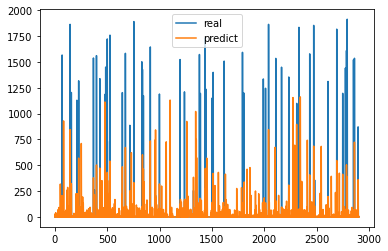

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


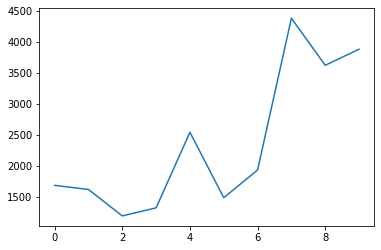

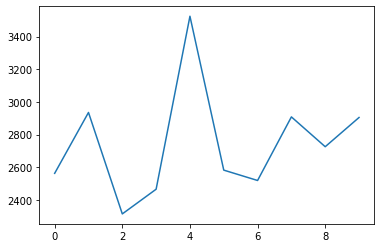

-------------------------- total running losses in 10 epoches as follows---------------------------------


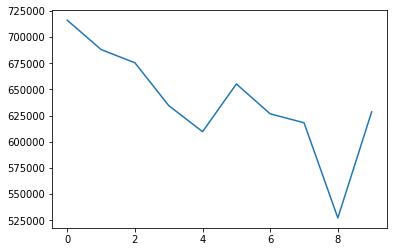

Epoch: 10; MSE loss: 610651.687
Epoch: 10; disc loss: 3492.912
Epoch: 10; ceod loss: 2995.254
27.82800102288934
22580.123493942137
Parameter containing:
tensor([0.1985, 0.2011, 0.2007, 0.2004, 0.1993], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 596322.417
Epoch: 11; disc loss: 5350.954
Epoch: 11; ceod loss: 3329.265
26.090094015463112
23441.758932944736
Parameter containing:
tensor([0.1983, 0.2013, 0.2006, 0.2006, 0.1992], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 638839.245
Epoch: 12; disc loss: 7080.978
Epoch: 12; ceod loss: 3838.805
26.672868400300082
22524.793356344602
Parameter containing:
tensor([0.1981, 0.2014, 0.2006, 0.2008, 0.1991], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 568242.408
Epoch: 13; disc loss: 5141.218
Epoch: 13; ceod loss: 3644.408
27.743749663592205
22076.946516461525
Parameter containing:
tensor([0.1979, 0.2015, 0.2006, 0.2011, 0.1989], device='cuda:0',
       requires_grad=True)
Epoch: 14; MS

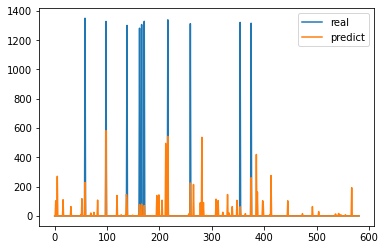

Epoch: 19; Test MAE loss on source data is: 35.994


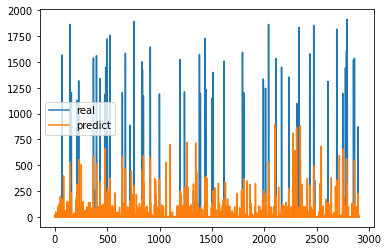

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


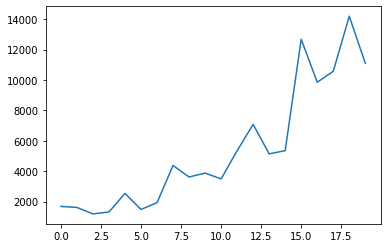

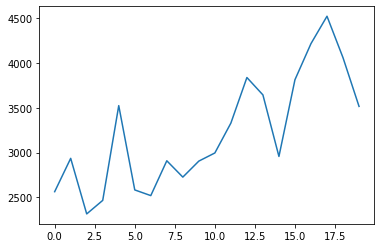

-------------------------- total running losses in 10 epoches as follows---------------------------------


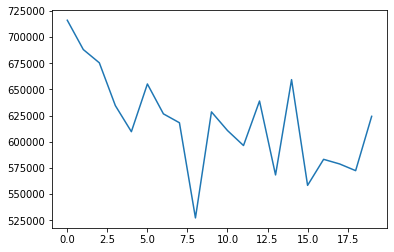

Epoch: 20; MSE loss: 550946.704
Epoch: 20; disc loss: 11120.077
Epoch: 20; ceod loss: 4110.313
26.66598238798556
20885.650760586574
Parameter containing:
tensor([0.1963, 0.2022, 0.2006, 0.2032, 0.1978], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 545434.521
Epoch: 21; disc loss: 17265.585
Epoch: 21; ceod loss: 4850.204
27.10896689145221
21432.80741102674
Parameter containing:
tensor([0.1960, 0.2023, 0.2006, 0.2035, 0.1976], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 636792.371
Epoch: 22; disc loss: 13398.653
Epoch: 22; ceod loss: 3996.509
26.12377522115138
23308.44556861728
Parameter containing:
tensor([0.1958, 0.2023, 0.2006, 0.2039, 0.1974], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 576348.095
Epoch: 23; disc loss: 20472.478
Epoch: 23; ceod loss: 4338.428
26.350718150945873
22432.8389916068
Parameter containing:
tensor([0.1956, 0.2024, 0.2006, 0.2042, 0.1972], device='cuda:0',
       requires_grad=True)
Epoch: 24; MSE 

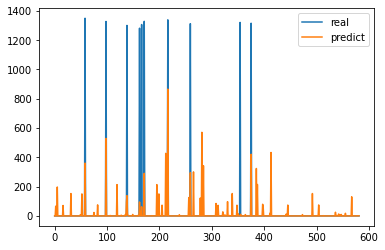

Epoch: 29; Test MAE loss on source data is: 33.470


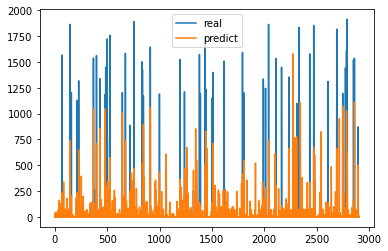

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


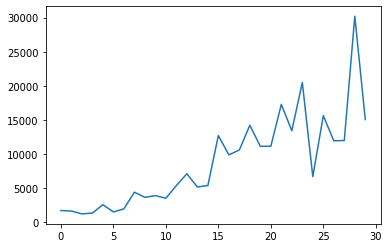

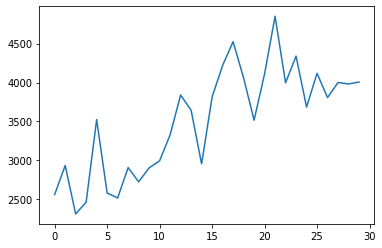

-------------------------- total running losses in 10 epoches as follows---------------------------------


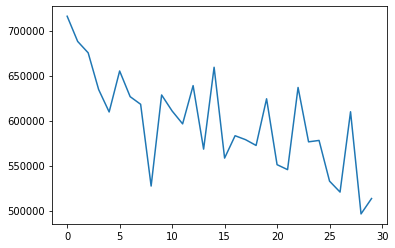

Epoch: 30; MSE loss: 607960.255
Epoch: 30; disc loss: 23301.009
Epoch: 30; ceod loss: 4287.385
26.15955011974188
22409.410565786562
Parameter containing:
tensor([0.1942, 0.2032, 0.2001, 0.2072, 0.1953], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 542319.610
Epoch: 31; disc loss: 13691.500
Epoch: 31; ceod loss: 3997.867
27.25951551241461
23170.601111474585
Parameter containing:
tensor([0.1939, 0.2034, 0.2001, 0.2077, 0.1949], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 529148.718
Epoch: 32; disc loss: 22370.022
Epoch: 32; ceod loss: 4092.302
25.296751038289766
22123.69016402875
Parameter containing:
tensor([0.1937, 0.2035, 0.2000, 0.2082, 0.1946], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 584818.633
Epoch: 33; disc loss: 14565.157
Epoch: 33; ceod loss: 3945.815
29.835172838451424
21257.625110322286
Parameter containing:
tensor([0.1934, 0.2036, 0.2001, 0.2087, 0.1942], device='cuda:0',
       requires_grad=True)
Epoch: 34; 

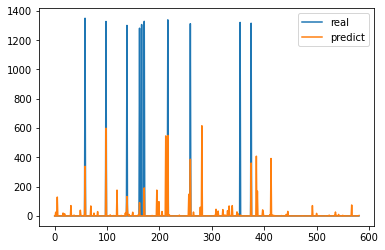

Epoch: 39; Test MAE loss on source data is: 28.988


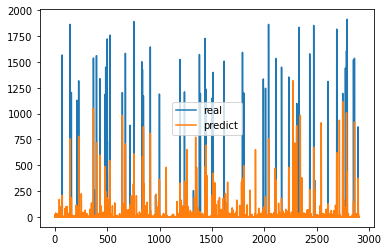

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


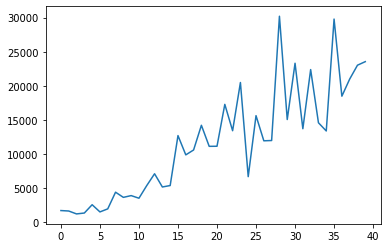

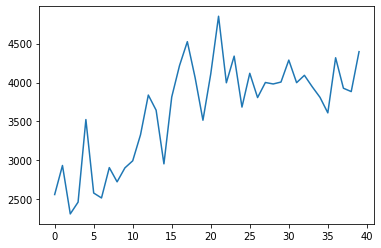

-------------------------- total running losses in 10 epoches as follows---------------------------------


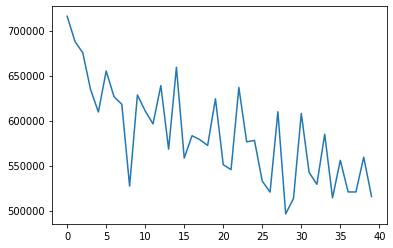

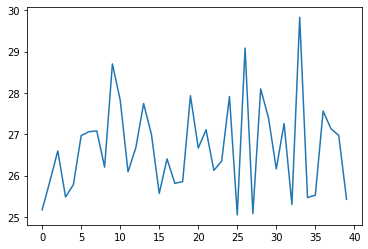

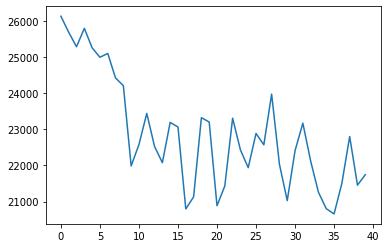

25.425280047241355
0.4750352337731947
0.8536741648594128
Parameter containing:
tensor([0.1919, 0.2045, 0.1997, 0.2117, 0.1923], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 5 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1845816.375
22.556137015428586
26173.057954677726
Epoch: 1; MSE loss: 1701303.000
22.86351139654479
25881.388095996797
Epoch: 2; MSE loss: 1756941.125
23.6574391106342
25269.87209344149
Epoch: 3; MSE loss: 1725102.625
24.937480621014263
24495.209861530297
Epoch: 4; MSE loss: 1541422.250
24.613999364942416
25005.03470240894
Epoch: 5; MSE loss: 1846757.375
27.03278112783388
23462.0398086259
Epoch: 6; MSE loss: 1566692.500
24.6460740622069
24489.794902591406
Epoch: 7; MSE loss: 1501260.500
26.531011621413363
23318.735607599003
Epoch: 8; MSE loss: 1764944.375
25.319745551257096
24096.779288361486
Epoch: 9; MSE loss: 1541407.875
26.574408714099437
23372.46345240

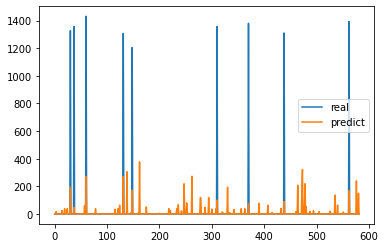

Epoch: 10; Test MAE loss on source data is: 33.258
Epoch: 10; Test MSE loss on source data is: 37562.216


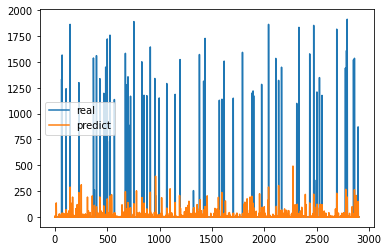

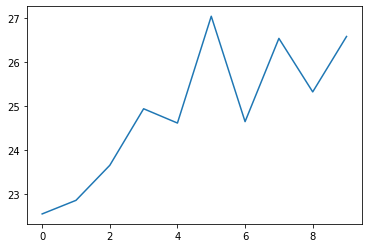

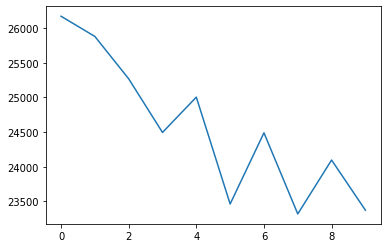

------------Domain Adaptation------------
Epoch: 0; MSE loss: 589071.460
Epoch: 0; disc loss: 879.535
Epoch: 0; ceod loss: 2577.879
27.765512345377932
23437.754101146467
Parameter containing:
tensor([0.1999, 0.2002, 0.2000, 0.2000, 0.1999], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 609913.248
Epoch: 1; disc loss: 862.045
Epoch: 1; ceod loss: 2572.786
27.843397571279624
23483.363249309456
Parameter containing:
tensor([0.1999, 0.2004, 0.2001, 0.1998, 0.1999], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 723665.295
Epoch: 2; disc loss: 951.452
Epoch: 2; ceod loss: 2501.615
26.36655900343177
23715.548026864668
Parameter containing:
tensor([0.1997, 0.2006, 0.2001, 0.1997, 0.1998], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 595939.520
Epoch: 3; disc loss: 1167.101
Epoch: 3; ceod loss: 2720.413
30.915888005925208
23035.50969094419
Parameter containing:
tensor([0.1996, 0.2008, 0.2003, 0.1996, 0.1997], device='cuda:0',
       require

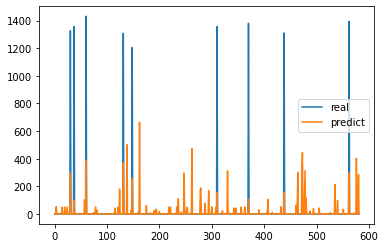

Epoch: 9; Test MAE loss on source data is: 34.643


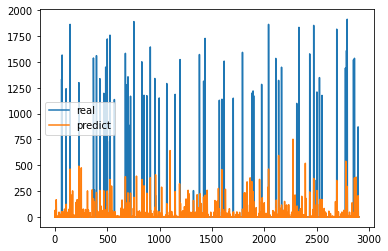

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


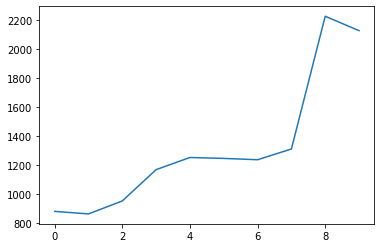

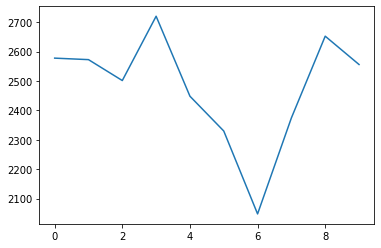

-------------------------- total running losses in 10 epoches as follows---------------------------------


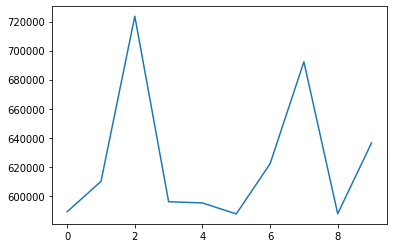

Epoch: 10; MSE loss: 638963.894
Epoch: 10; disc loss: 2013.671
Epoch: 10; ceod loss: 2270.669
32.129707569314036
22553.865791990105
Parameter containing:
tensor([0.1996, 0.2015, 0.2017, 0.1991, 0.1982], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 613375.734
Epoch: 11; disc loss: 2025.982
Epoch: 11; ceod loss: 2268.228
30.705889524155875
22502.796963985013
Parameter containing:
tensor([0.1996, 0.2016, 0.2019, 0.1989, 0.1979], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 628736.576
Epoch: 12; disc loss: 2036.409
Epoch: 12; ceod loss: 2545.554
30.99842731874833
23495.81747392001
Parameter containing:
tensor([0.1997, 0.2016, 0.2021, 0.1989, 0.1977], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 638360.988
Epoch: 13; disc loss: 4639.220
Epoch: 13; ceod loss: 2823.928
33.80905028387161
23682.821155204398
Parameter containing:
tensor([0.1997, 0.2017, 0.2023, 0.1988, 0.1975], device='cuda:0',
       requires_grad=True)
Epoch: 14; MSE 

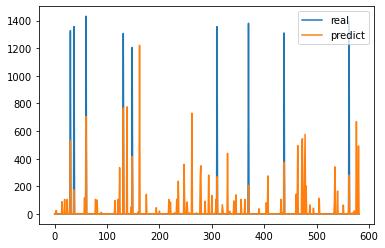

Epoch: 19; Test MAE loss on source data is: 38.122


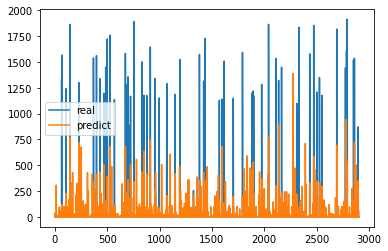

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


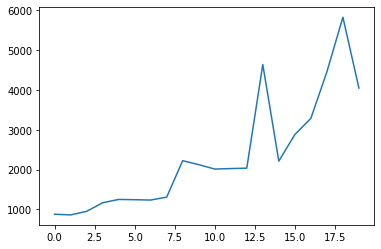

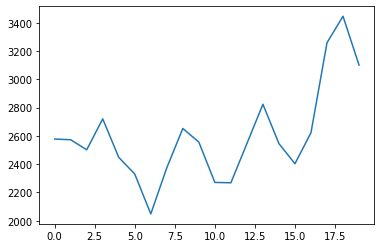

-------------------------- total running losses in 10 epoches as follows---------------------------------


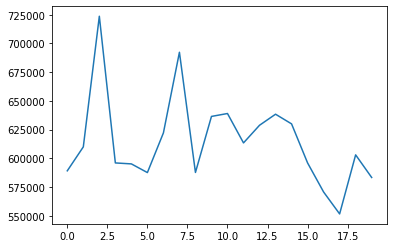

Epoch: 20; MSE loss: 641010.407
Epoch: 20; disc loss: 4553.575
Epoch: 20; ceod loss: 3009.803
31.3061409475237
22780.46807814481
Parameter containing:
tensor([0.1998, 0.2027, 0.2030, 0.1980, 0.1965], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 626707.142
Epoch: 21; disc loss: 6288.220
Epoch: 21; ceod loss: 3676.394
33.512074093023934
23556.306300877426
Parameter containing:
tensor([0.1998, 0.2029, 0.2030, 0.1979, 0.1965], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 593812.770
Epoch: 22; disc loss: 10710.470
Epoch: 22; ceod loss: 4153.121
34.29362090633497
24948.94360081842
Parameter containing:
tensor([0.1997, 0.2030, 0.2030, 0.1978, 0.1965], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 525955.093
Epoch: 23; disc loss: 12142.507
Epoch: 23; ceod loss: 4003.842
31.842390959794376
22108.44306950115
Parameter containing:
tensor([0.1995, 0.2031, 0.2031, 0.1977, 0.1966], device='cuda:0',
       requires_grad=True)
Epoch: 24; MSE l

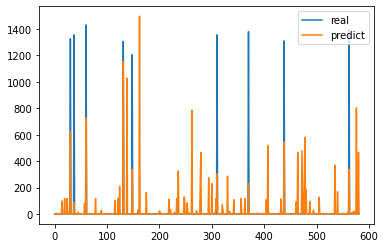

Epoch: 29; Test MAE loss on source data is: 35.513


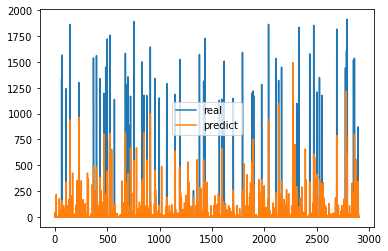

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


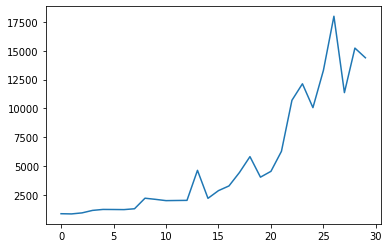

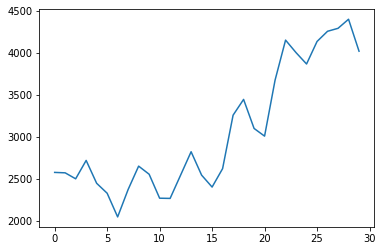

-------------------------- total running losses in 10 epoches as follows---------------------------------


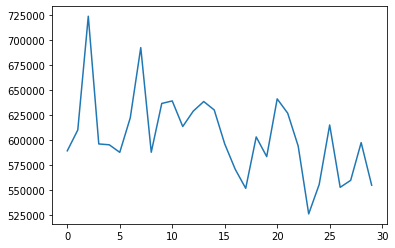

Epoch: 30; MSE loss: 491649.377
Epoch: 30; disc loss: 13942.623
Epoch: 30; ceod loss: 3866.253
36.537526933444326
26292.257026047304
Parameter containing:
tensor([0.1978, 0.2042, 0.2035, 0.1963, 0.1982], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 545237.721
Epoch: 31; disc loss: 23224.997
Epoch: 31; ceod loss: 4448.656
32.29520346578915
23075.8602405082
Parameter containing:
tensor([0.1975, 0.2044, 0.2036, 0.1961, 0.1985], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 519204.084
Epoch: 32; disc loss: 18636.085
Epoch: 32; ceod loss: 4090.259
34.90821510689058
25366.760555970774
Parameter containing:
tensor([0.1973, 0.2045, 0.2036, 0.1958, 0.1988], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 602512.031
Epoch: 33; disc loss: 21551.601
Epoch: 33; ceod loss: 4276.997
36.9254880954361
29508.286440747186
Parameter containing:
tensor([0.1971, 0.2047, 0.2036, 0.1956, 0.1991], device='cuda:0',
       requires_grad=True)
Epoch: 34; MSE

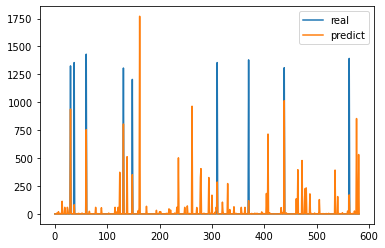

Epoch: 39; Test MAE loss on source data is: 31.213


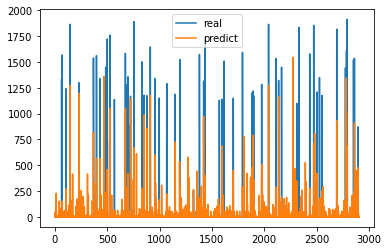

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


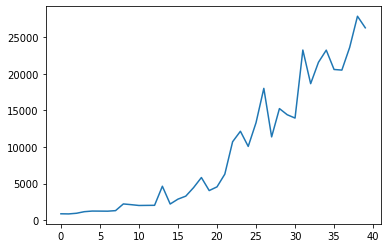

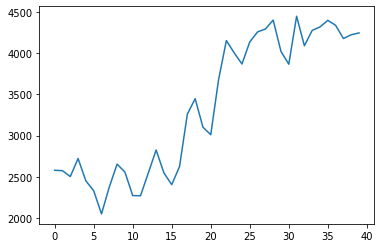

-------------------------- total running losses in 10 epoches as follows---------------------------------


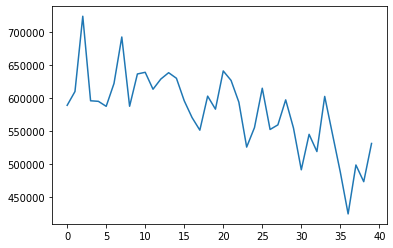

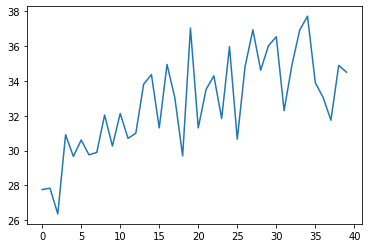

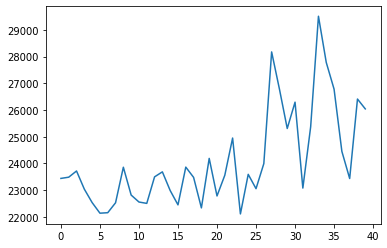

34.502899795591425
0.41432428739431365
0.9670747105285972
Parameter containing:
tensor([0.1954, 0.2054, 0.2036, 0.1944, 0.2011], device='cuda:0',
       requires_grad=True)


In [ ]:
#########################0,3,5-----------microwave#################################
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [0,3,5]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.0001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
        lr = 0.0001
        lr1=0.000001
        batch_size =128
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(2):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(1):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)


 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 0 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1654477.375
29.235428482443435
40986.85161856425
Epoch: 1; MSE loss: 1652873.250
29.57177137590748
40572.25032374446
Epoch: 2; MSE loss: 1762629.125
29.466270384633695
40516.304989879776
Epoch: 3; MSE loss: 1747765.750
29.515565005962106
40201.31372098723
Epoch: 4; MSE loss: 1512021.625
29.637447198547786
39734.446889529565
Epoch: 5; MSE loss: 1642941.250
30.886266902208067
39039.87634501217
Epoch: 6; MSE loss: 1626604.250
30.439026601262654
39001.969874753326
Epoch: 7; MSE loss: 1557626.500
29.227172157450877
39602.349860831106
Epoch: 8; MSE loss: 1629142.000
30.858695570989706
38338.994000165934
Epoch: 9; MSE loss: 1611592.125
30.134875317512744
39241.181031666136
Epoch: 10; Test MAE loss on target data is: 30.135
Epoch: 10; Test MSE loss on target data is:

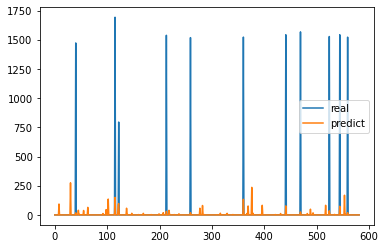

Epoch: 10; Test MAE loss on source data is: 28.381
Epoch: 10; Test MSE loss on source data is: 34344.419


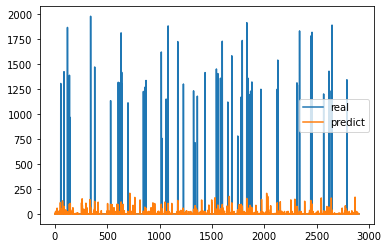

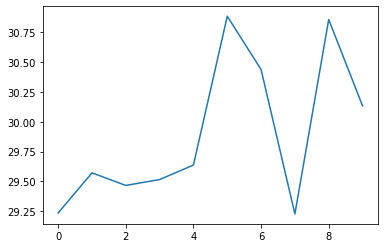

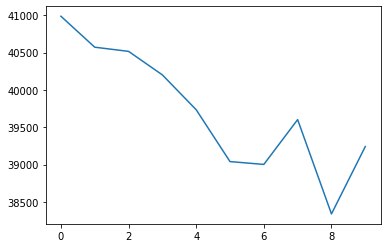

------------Domain Adaptation------------
Epoch: 0; MSE loss: 1485200.629
Epoch: 0; disc loss: 2613.947
Epoch: 0; ceod loss: 6727.039
32.87756435975607
37433.05460590535
Parameter containing:
tensor([0.2001, 0.1999, 0.1997, 0.1993, 0.2010], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 1521354.434
Epoch: 1; disc loss: 3404.738
Epoch: 1; ceod loss: 7291.403
30.45358786159296
39003.35505264477
Parameter containing:
tensor([0.2004, 0.2002, 0.1994, 0.1985, 0.2014], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 1501672.689
Epoch: 2; disc loss: 4281.554
Epoch: 2; ceod loss: 7641.358
32.209816839311266
37865.91602500984
Parameter containing:
tensor([0.2007, 0.2005, 0.1992, 0.1982, 0.2014], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 1253700.187
Epoch: 3; disc loss: 5381.639
Epoch: 3; ceod loss: 7937.479
34.657093802558734
37150.57478502007
Parameter containing:
tensor([0.2010, 0.2010, 0.1986, 0.1978, 0.2015], device='cuda:0',
       requ

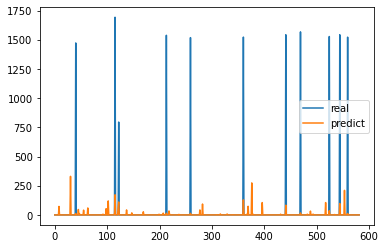

Epoch: 9; Test MAE loss on source data is: 28.113


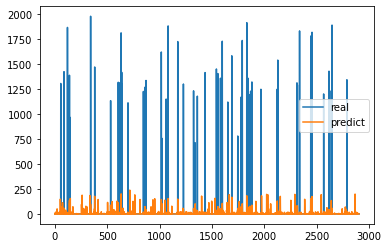

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


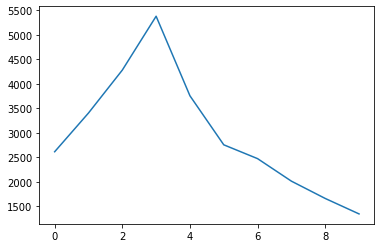

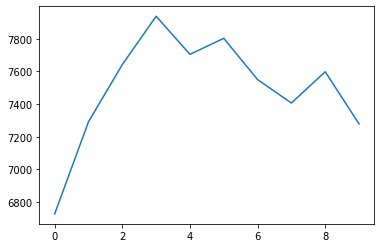

-------------------------- total running losses in 10 epoches as follows---------------------------------


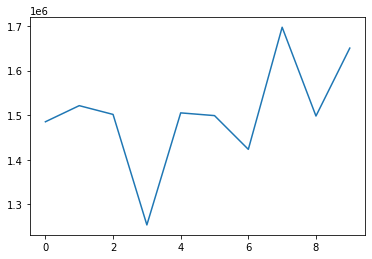

Epoch: 10; MSE loss: 1559055.499
Epoch: 10; disc loss: 1336.104
Epoch: 10; ceod loss: 7564.718
31.03639296151245
38588.93411025594
Parameter containing:
tensor([0.2027, 0.2049, 0.2002, 0.1921, 0.2002], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 1540709.987
Epoch: 11; disc loss: 1435.857
Epoch: 11; ceod loss: 8037.315
30.703510001899176
38906.57400662361
Parameter containing:
tensor([0.2033, 0.2055, 0.2005, 0.1910, 0.1997], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 1670051.137
Epoch: 12; disc loss: 1069.196
Epoch: 12; ceod loss: 7808.532
31.921230493064325
38036.0282554841
Parameter containing:
tensor([0.2046, 0.2057, 0.2010, 0.1896, 0.1990], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 1494618.207
Epoch: 13; disc loss: 719.547
Epoch: 13; ceod loss: 7736.147
32.49548373295406
37751.412635662724
Parameter containing:
tensor([0.2059, 0.2068, 0.2021, 0.1875, 0.1977], device='cuda:0',
       requires_grad=True)
Epoch: 14; MSE 

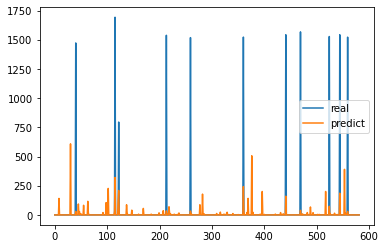

Epoch: 19; Test MAE loss on source data is: 31.044


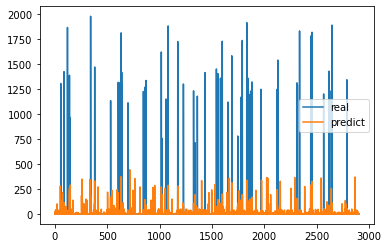

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


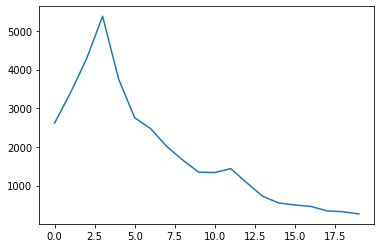

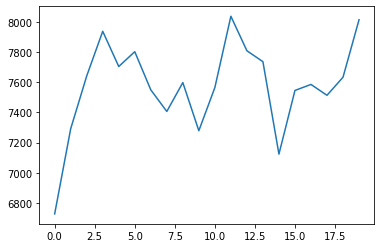

-------------------------- total running losses in 10 epoches as follows---------------------------------


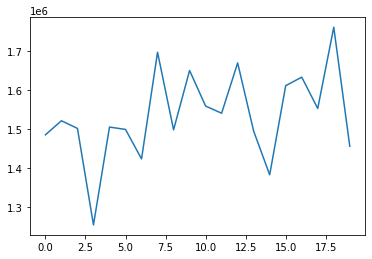

Epoch: 20; MSE loss: 1450420.427
Epoch: 20; disc loss: 216.421
Epoch: 20; ceod loss: 7822.488
30.85816495344128
38693.86513030236
Parameter containing:
tensor([0.2267, 0.2211, 0.2204, 0.1588, 0.1730], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 1516755.755
Epoch: 21; disc loss: 223.408
Epoch: 21; ceod loss: 7586.936
31.40966725834183
38335.97596933898
Parameter containing:
tensor([0.2281, 0.2254, 0.2244, 0.1528, 0.1692], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 1519085.456
Epoch: 22; disc loss: 217.729
Epoch: 22; ceod loss: 7789.217
30.57560524281289
38919.64973304095
Parameter containing:
tensor([0.2280, 0.2302, 0.2284, 0.1477, 0.1657], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 1600907.144
Epoch: 23; disc loss: 269.482
Epoch: 23; ceod loss: 7709.500
31.644580768359415
38184.39328660627
Parameter containing:
tensor([0.2267, 0.2351, 0.2316, 0.1432, 0.1634], device='cuda:0',
       requires_grad=True)
Epoch: 24; MSE loss

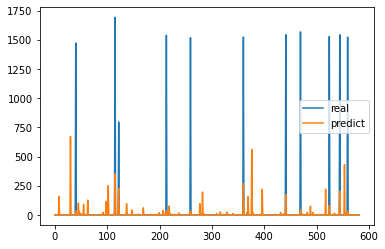

Epoch: 29; Test MAE loss on source data is: 31.432


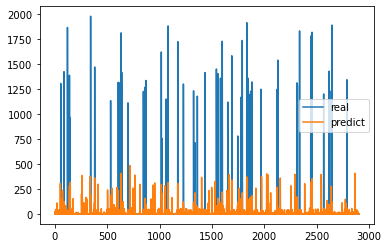

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


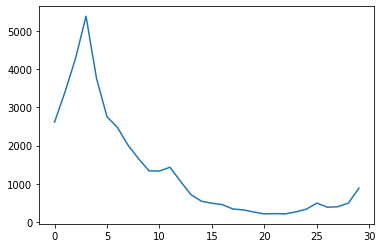

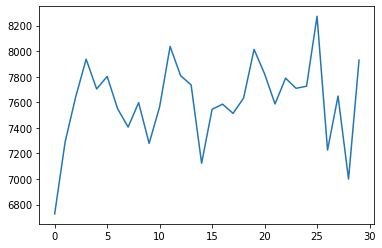

-------------------------- total running losses in 10 epoches as follows---------------------------------


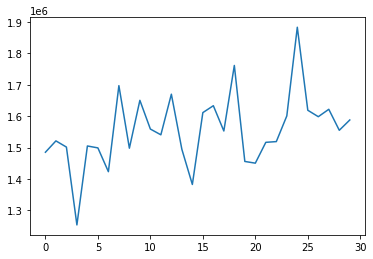

Epoch: 30; MSE loss: 1479234.823
Epoch: 30; disc loss: 694.039
Epoch: 30; ceod loss: 7346.292
32.542654801258244
37705.94654962682
Parameter containing:
tensor([0.2069, 0.2449, 0.2265, 0.1425, 0.1791], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 1578462.997
Epoch: 31; disc loss: 963.589
Epoch: 31; ceod loss: 7672.277
29.95290153893084
39513.63568447558
Parameter containing:
tensor([0.2043, 0.2437, 0.2233, 0.1450, 0.1837], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 1404486.206
Epoch: 32; disc loss: 1051.037
Epoch: 32; ceod loss: 7365.474
30.660268530539764
38856.983367617286
Parameter containing:
tensor([0.2007, 0.2425, 0.2206, 0.1478, 0.1884], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 1649680.186
Epoch: 33; disc loss: 1536.835
Epoch: 33; ceod loss: 7238.278
29.716163816841537
39771.07186457183
Parameter containing:
tensor([0.1969, 0.2411, 0.2180, 0.1508, 0.1933], device='cuda:0',
       requires_grad=True)
Epoch: 34; MSE

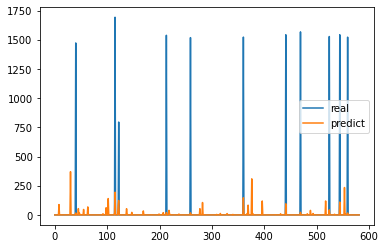

Epoch: 39; Test MAE loss on source data is: 28.660


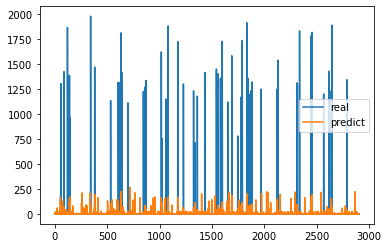

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


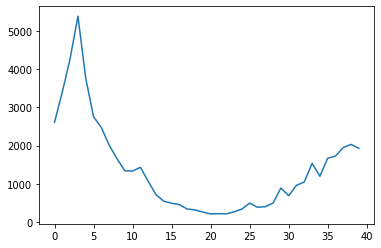

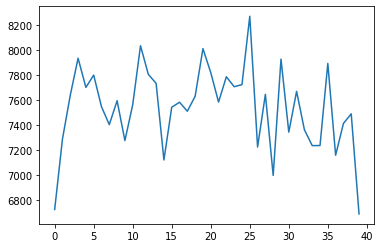

-------------------------- total running losses in 10 epoches as follows---------------------------------


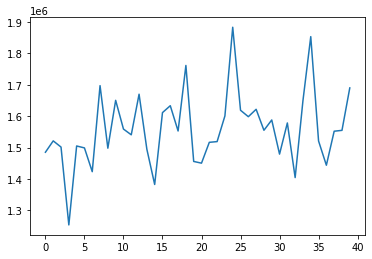

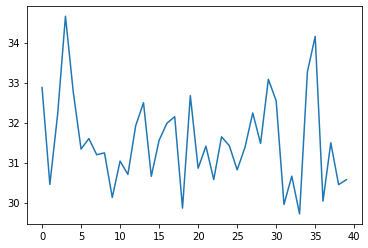

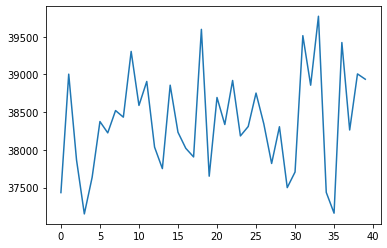

30.572647190568507
0.8051290873729333
0.9614199979090173
Parameter containing:
tensor([0.1764, 0.2299, 0.1985, 0.1714, 0.2239], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 2 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1657503.625
27.096229289648765
37833.136780171015
Epoch: 1; MSE loss: 1893715.750
26.938190331164094
37642.30611981034
Epoch: 2; MSE loss: 1812036.000
27.36131550440456
36906.33938971488
Epoch: 3; MSE loss: 1561238.500
27.228316780442174
36843.77776833258
Epoch: 4; MSE loss: 1837605.125
27.69966715746447
35957.63750557814
Epoch: 5; MSE loss: 1734967.125
27.52853903445796
36048.822599169085
Epoch: 6; MSE loss: 1614764.500
27.733526219796275
35660.71301479764
Epoch: 7; MSE loss: 1460702.875
28.13969698554718
35512.65767630332
Epoch: 8; MSE loss: 1525048.500
27.715111540508843
35859.98185679915
Epoch: 9; MSE loss: 1551770.000
28.35512089593611
34884.2237225700

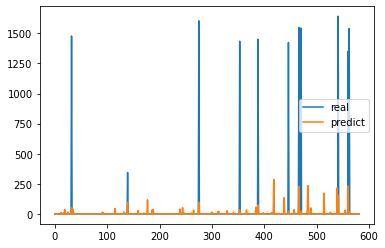

Epoch: 10; Test MAE loss on source data is: 29.419
Epoch: 10; Test MSE loss on source data is: 31406.811


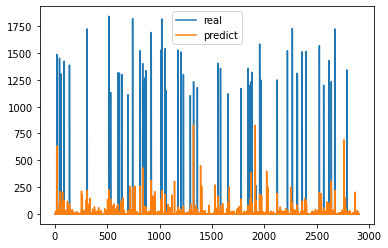

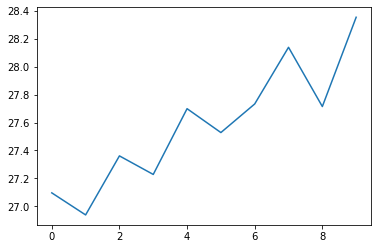

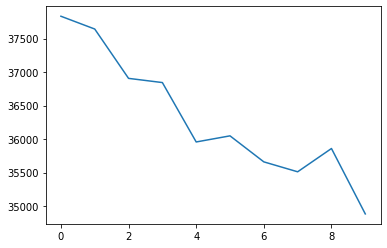

------------Domain Adaptation------------
Epoch: 0; MSE loss: 1479678.219
Epoch: 0; disc loss: 5426.264
Epoch: 0; ceod loss: 6673.655
28.53899923230672
36645.040179206146
Parameter containing:
tensor([0.1996, 0.1995, 0.2000, 0.2001, 0.2007], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 1418456.394
Epoch: 1; disc loss: 15284.583
Epoch: 1; ceod loss: 8470.932
28.76924246152754
37228.851066626674
Parameter containing:
tensor([0.1997, 0.1992, 0.2004, 0.2001, 0.2006], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 1482049.744
Epoch: 2; disc loss: 22807.838
Epoch: 2; ceod loss: 10435.142
31.917829054871838
37335.75116963417
Parameter containing:
tensor([0.1996, 0.1995, 0.2006, 0.2000, 0.2003], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 1436171.347
Epoch: 3; disc loss: 23044.399
Epoch: 3; ceod loss: 10608.798
29.514761838447495
37671.41258818542
Parameter containing:
tensor([0.1989, 0.1999, 0.2012, 0.1999, 0.2000], device='cuda:0',
    

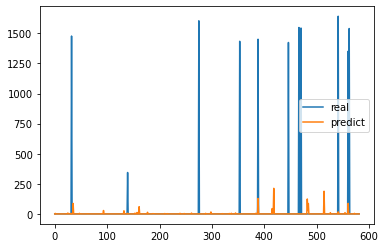

Epoch: 9; Test MAE loss on source data is: 27.304


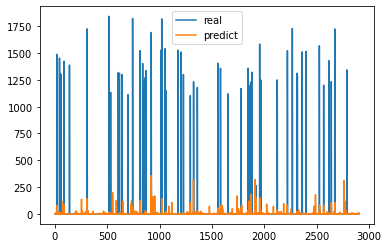

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


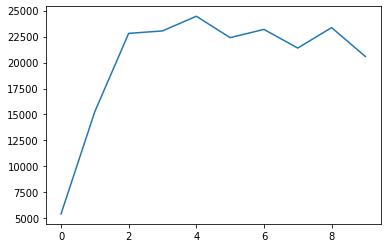

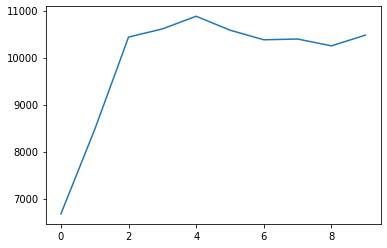

-------------------------- total running losses in 10 epoches as follows---------------------------------


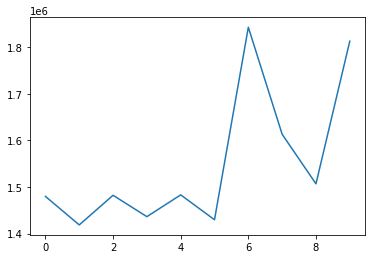

Epoch: 10; MSE loss: 1633447.072
Epoch: 10; disc loss: 20634.168
Epoch: 10; ceod loss: 10578.459
31.7033622591049
37758.63841959643
Parameter containing:
tensor([0.1936, 0.2057, 0.2069, 0.1974, 0.1965], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 1682824.624
Epoch: 11; disc loss: 20318.400
Epoch: 11; ceod loss: 10436.688
29.802648777250983
37840.94436187435
Parameter containing:
tensor([0.1924, 0.2073, 0.2080, 0.1962, 0.1961], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 1707034.303
Epoch: 12; disc loss: 18837.572
Epoch: 12; ceod loss: 10603.112
30.579599425926343
37738.63610477653
Parameter containing:
tensor([0.1914, 0.2093, 0.2086, 0.1951, 0.1956], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 1529991.583
Epoch: 13; disc loss: 18138.576
Epoch: 13; ceod loss: 10275.234
32.63009173210544
37829.44146901425
Parameter containing:
tensor([0.1902, 0.2118, 0.2088, 0.1942, 0.1950], device='cuda:0',
       requires_grad=True)
Epoch: 

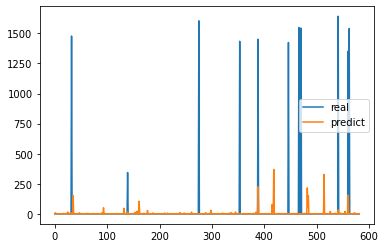

Epoch: 19; Test MAE loss on source data is: 29.904


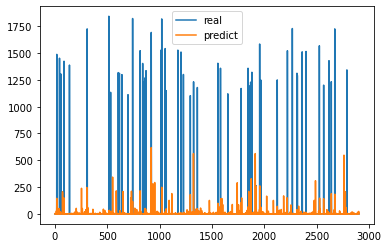

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


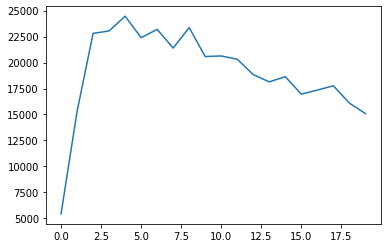

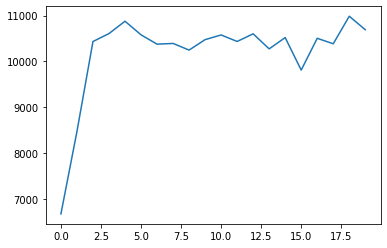

-------------------------- total running losses in 10 epoches as follows---------------------------------


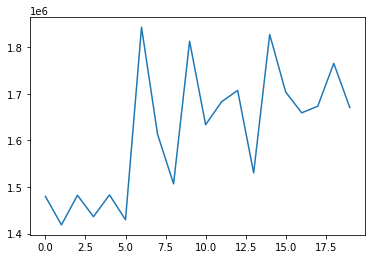

Epoch: 20; MSE loss: 1687220.444
Epoch: 20; disc loss: 16301.001
Epoch: 20; ceod loss: 11002.409
28.195971232278854
37959.79680870155
Parameter containing:
tensor([0.1790, 0.2413, 0.2145, 0.1804, 0.1849], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 1589160.624
Epoch: 21; disc loss: 14030.007
Epoch: 21; ceod loss: 9991.640
28.87646561288803
37803.064935016715
Parameter containing:
tensor([0.1769, 0.2472, 0.2156, 0.1773, 0.1829], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 1601516.662
Epoch: 22; disc loss: 12514.084
Epoch: 22; ceod loss: 10124.901
30.425170011927225
37706.20474066624
Parameter containing:
tensor([0.1751, 0.2532, 0.2167, 0.1745, 0.1805], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 1622252.574
Epoch: 23; disc loss: 13369.259
Epoch: 23; ceod loss: 10716.787
28.5860042499756
37844.66899343282
Parameter containing:
tensor([0.1729, 0.2593, 0.2178, 0.1717, 0.1784], device='cuda:0',
       requires_grad=True)
Epoch: 

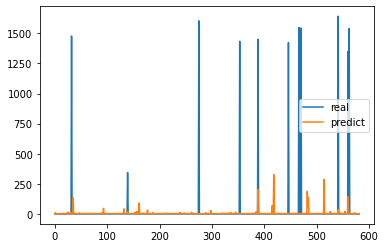

Epoch: 29; Test MAE loss on source data is: 30.453


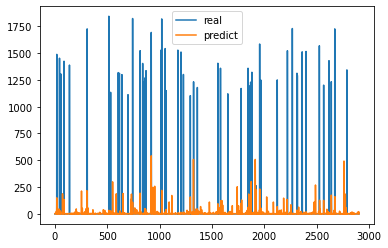

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


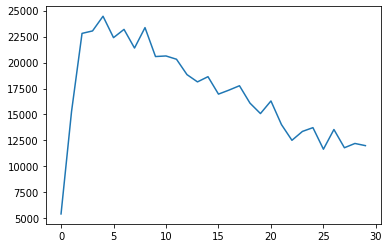

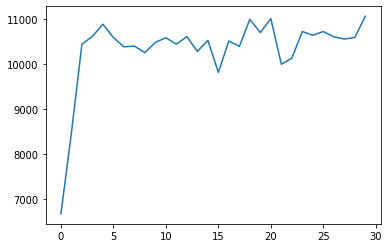

-------------------------- total running losses in 10 epoches as follows---------------------------------


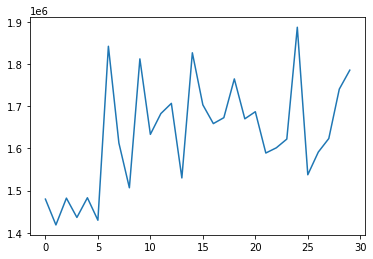

Epoch: 30; MSE loss: 1729658.019
Epoch: 30; disc loss: 11418.739
Epoch: 30; ceod loss: 10881.691
30.27119407536545
37732.21575794809
Parameter containing:
tensor([0.1577, 0.3048, 0.2355, 0.1480, 0.1541], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 1799546.509
Epoch: 31; disc loss: 12200.934
Epoch: 31; ceod loss: 10531.583
30.307299454962113
37633.74374766772
Parameter containing:
tensor([0.1552, 0.3103, 0.2397, 0.1439, 0.1508], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 1932621.531
Epoch: 32; disc loss: 11584.275
Epoch: 32; ceod loss: 10726.966
30.301806641812995
37772.71016950619
Parameter containing:
tensor([0.1533, 0.3148, 0.2446, 0.1401, 0.1471], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 1827320.574
Epoch: 33; disc loss: 10987.552
Epoch: 33; ceod loss: 10654.290
29.809328939714486
37692.109183474146
Parameter containing:
tensor([0.1521, 0.3183, 0.2501, 0.1358, 0.1436], device='cuda:0',
       requires_grad=True)
Epoc

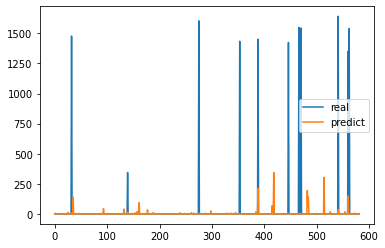

Epoch: 39; Test MAE loss on source data is: 28.435


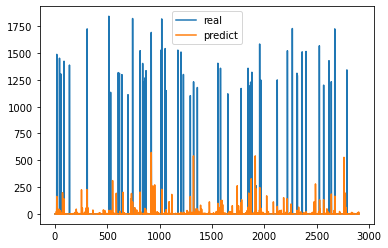

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


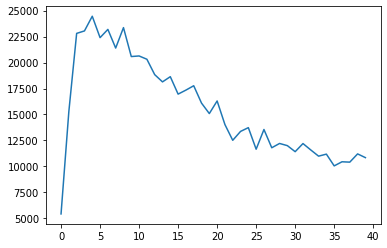

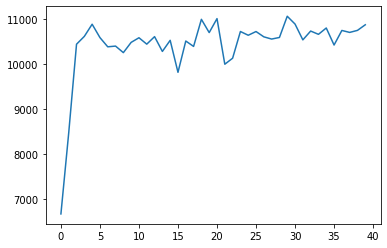

-------------------------- total running losses in 10 epoches as follows---------------------------------


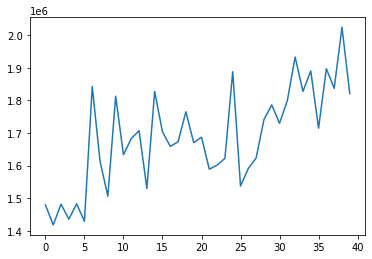

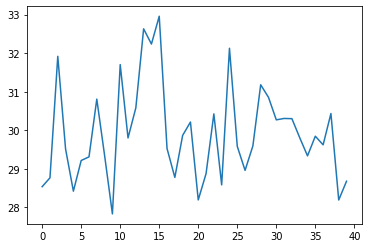

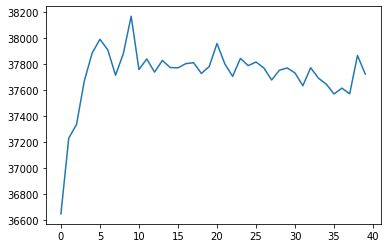

28.680541336818045
0.8588400696998796
0.9825991187050898
Parameter containing:
tensor([0.1452, 0.3213, 0.2934, 0.1166, 0.1235], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 4 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 1908037.750
22.23046970925585
19844.39034287984
Epoch: 1; MSE loss: 2047506.250
21.62393046640935
19856.484699243556
Epoch: 2; MSE loss: 1862908.125
23.908344804229298
19527.30460473439
Epoch: 3; MSE loss: 1968095.000
22.058848247357687
19730.17640583752
Epoch: 4; MSE loss: 2067208.500
22.57138187525901
19683.981448854283
Epoch: 5; MSE loss: 2086232.000
24.84604940233157
19369.95515335885
Epoch: 6; MSE loss: 1632075.250
24.274464376859648
19429.299855659854
Epoch: 7; MSE loss: 1683780.250
24.119781440117514
19399.155151175022
Epoch: 8; MSE loss: 1728439.250
29.398143790969527
19015.077635369264
Epoch: 9; MSE loss: 1804223.750
28.956909748501563
18996.532452

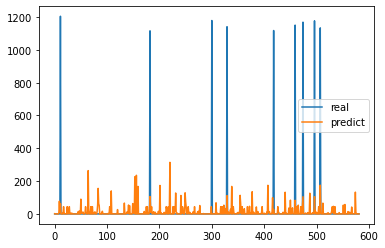

Epoch: 10; Test MAE loss on source data is: 33.559
Epoch: 10; Test MSE loss on source data is: 39001.579


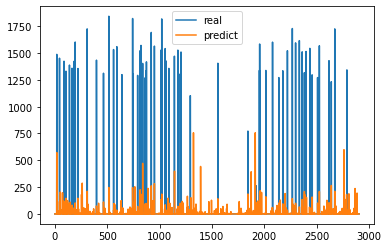

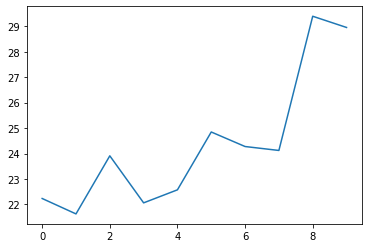

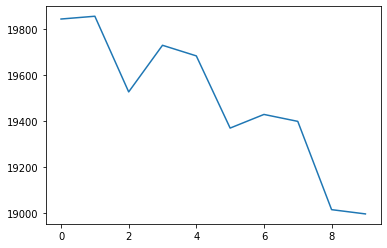

------------Domain Adaptation------------
Epoch: 0; MSE loss: 1597180.106
Epoch: 0; disc loss: 4603.463
Epoch: 0; ceod loss: 7049.069
27.327113707981926
19382.346314697683
Parameter containing:
tensor([0.1993, 0.2009, 0.1998, 0.1999, 0.2001], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 1502124.424
Epoch: 1; disc loss: 5863.787
Epoch: 1; ceod loss: 7657.459
26.609259972918483
19774.87270000852
Parameter containing:
tensor([0.1989, 0.2012, 0.1995, 0.1997, 0.2006], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 1689141.386
Epoch: 2; disc loss: 9107.726
Epoch: 2; ceod loss: 9147.652
27.841414504034823
20183.907865499605
Parameter containing:
tensor([0.1987, 0.2020, 0.1991, 0.1995, 0.2008], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 1614125.056
Epoch: 3; disc loss: 10273.153
Epoch: 3; ceod loss: 9228.898
25.115596945461565
19908.35626727313
Parameter containing:
tensor([0.1987, 0.2029, 0.1987, 0.1993, 0.2004], device='cuda:0',
      

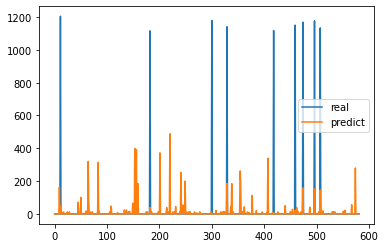

Epoch: 9; Test MAE loss on source data is: 33.738


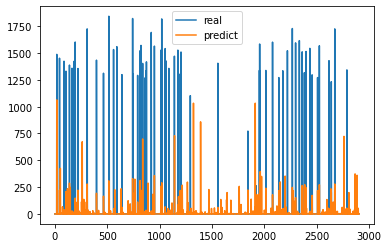

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


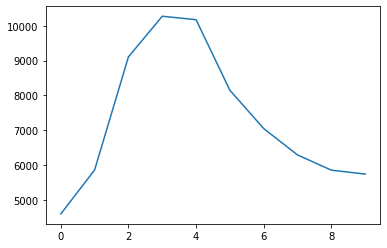

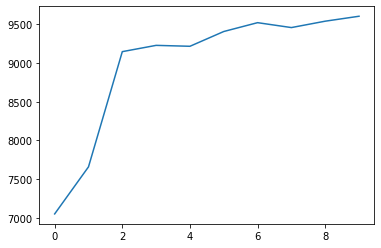

-------------------------- total running losses in 10 epoches as follows---------------------------------


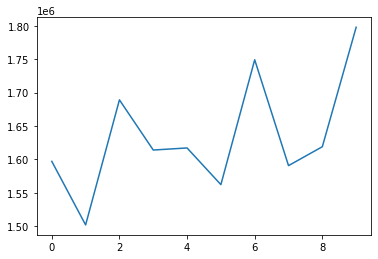

Epoch: 10; MSE loss: 1693025.332
Epoch: 10; disc loss: 3712.861
Epoch: 10; ceod loss: 9293.538
25.64927898157913
19981.51455564745
Parameter containing:
tensor([0.1956, 0.2065, 0.2011, 0.2014, 0.1955], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 1704857.204
Epoch: 11; disc loss: 3423.921
Epoch: 11; ceod loss: 9890.847
27.216188911742233
20048.555403510916
Parameter containing:
tensor([0.1961, 0.2074, 0.2017, 0.2015, 0.1933], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 1685890.516
Epoch: 12; disc loss: 3094.720
Epoch: 12; ceod loss: 9393.048
27.579068152816436
20146.372655345982
Parameter containing:
tensor([0.1957, 0.2087, 0.2024, 0.2020, 0.1911], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 1705365.819
Epoch: 13; disc loss: 2721.799
Epoch: 13; ceod loss: 9326.995
29.377767698820104
20766.60945092189
Parameter containing:
tensor([0.1947, 0.2096, 0.2031, 0.2031, 0.1895], device='cuda:0',
       requires_grad=True)
Epoch: 14; 

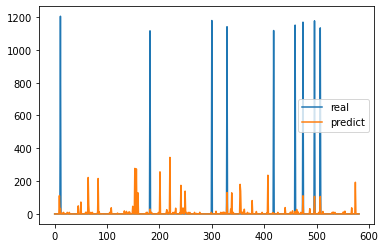

Epoch: 19; Test MAE loss on source data is: 32.882


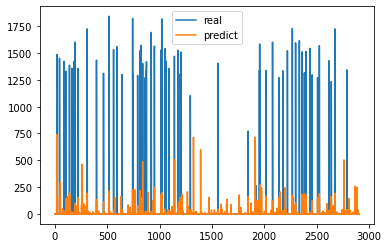

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


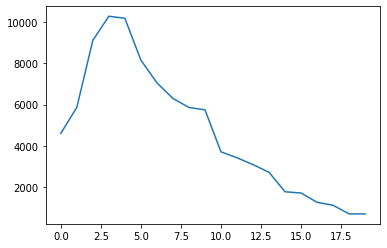

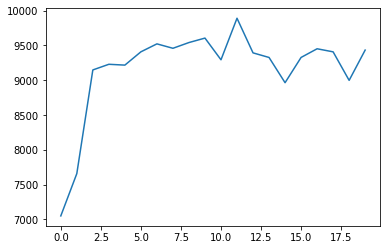

-------------------------- total running losses in 10 epoches as follows---------------------------------


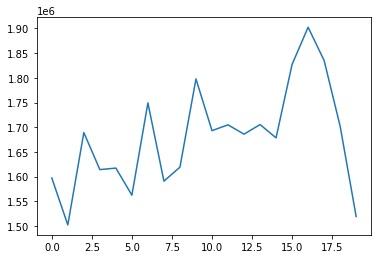

Epoch: 20; MSE loss: 1823151.839
Epoch: 20; disc loss: 596.416
Epoch: 20; ceod loss: 9274.766
24.174211437938755
19817.701782890264
Parameter containing:
tensor([0.1861, 0.2217, 0.2124, 0.2206, 0.1592], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 1612658.884
Epoch: 21; disc loss: 365.275
Epoch: 21; ceod loss: 9281.629
23.840361904685746
19752.27109687744
Parameter containing:
tensor([0.1850, 0.2247, 0.2154, 0.2244, 0.1505], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 1632234.930
Epoch: 22; disc loss: 419.699
Epoch: 22; ceod loss: 9485.429
28.44641856396014
20432.57795750632
Parameter containing:
tensor([0.1845, 0.2283, 0.2188, 0.2266, 0.1419], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 1700642.500
Epoch: 23; disc loss: 254.221
Epoch: 23; ceod loss: 8867.726
30.227599902865812
20798.786617001584
Parameter containing:
tensor([0.1849, 0.2326, 0.2226, 0.2260, 0.1339], device='cuda:0',
       requires_grad=True)
Epoch: 24; MSE 

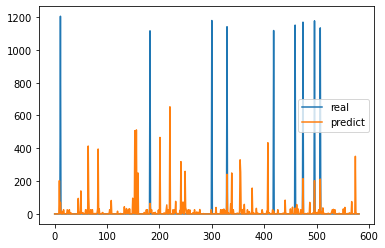

Epoch: 29; Test MAE loss on source data is: 34.872


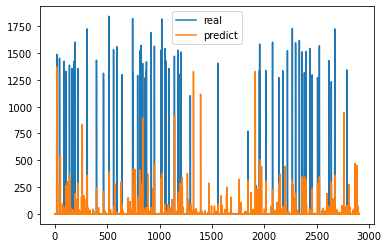

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


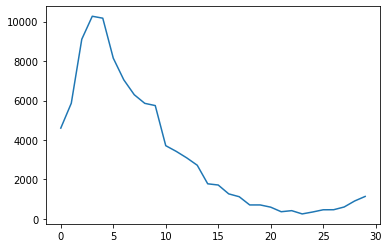

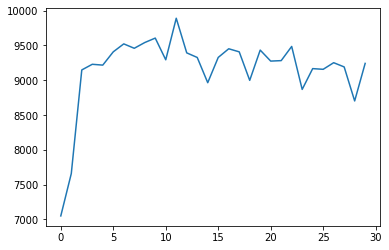

-------------------------- total running losses in 10 epoches as follows---------------------------------


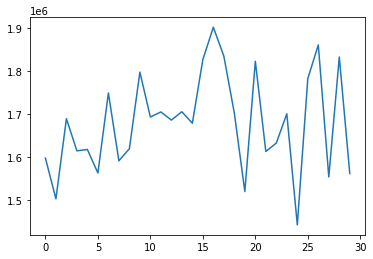

Epoch: 30; MSE loss: 1840119.531
Epoch: 30; disc loss: 1064.076
Epoch: 30; ceod loss: 9005.402
28.253795704455516
20153.112308555355
Parameter containing:
tensor([0.2147, 0.2470, 0.2306, 0.2016, 0.1062], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 1712397.679
Epoch: 31; disc loss: 1144.828
Epoch: 31; ceod loss: 8799.107
26.22959185235484
19823.090860843815
Parameter containing:
tensor([0.2201, 0.2449, 0.2302, 0.1991, 0.1058], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 1648206.817
Epoch: 32; disc loss: 1811.976
Epoch: 32; ceod loss: 8987.092
26.673181330842763
19869.088680647
Parameter containing:
tensor([0.2249, 0.2423, 0.2294, 0.1972, 0.1062], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 1783336.035
Epoch: 33; disc loss: 1825.849
Epoch: 33; ceod loss: 9045.265
24.51279029031236
19698.210645928328
Parameter containing:
tensor([0.2295, 0.2398, 0.2283, 0.1954, 0.1071], device='cuda:0',
       requires_grad=True)
Epoch: 34; MS

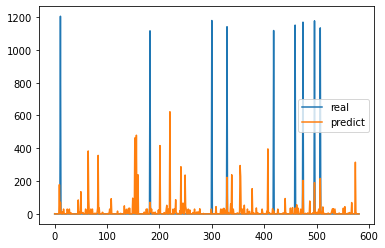

Epoch: 39; Test MAE loss on source data is: 34.668


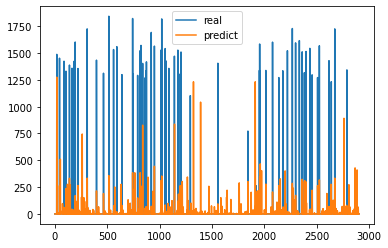

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


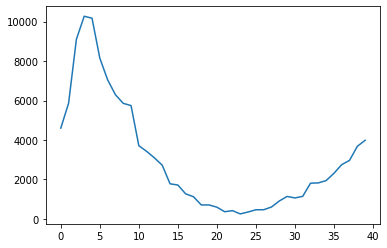

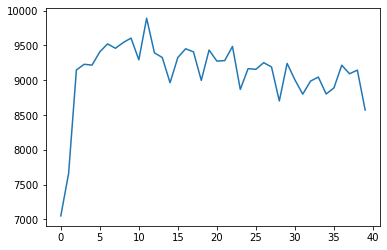

-------------------------- total running losses in 10 epoches as follows---------------------------------


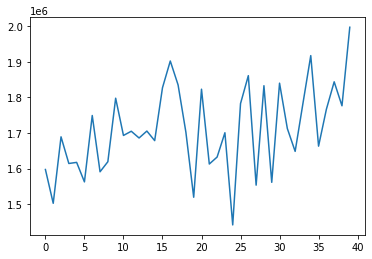

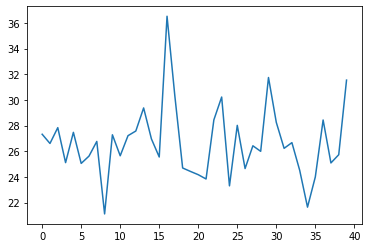

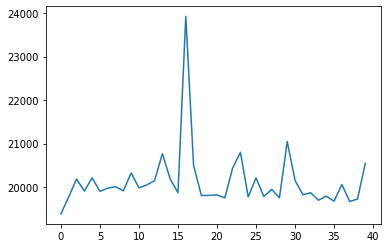

31.546171203047624
0.03448741277670837
0.9980996887608673
Parameter containing:
tensor([0.2514, 0.2265, 0.2224, 0.1823, 0.1175], device='cuda:0',
       requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [0,2,4]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.0001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
#         lr = 0.0001
#         lr1=0.000001
#         batch_size =64
#         b1=0.99
#         b2=0.999
# #         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
# #         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
#         opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
#         opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
#         opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
#         opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
#         opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
#         opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
#         model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(2):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(2):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(2):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)

In [7]:
# ######################################microwave###############################################################
#trainfile4="/content/drive/MyDrive/training_data/dishwasher_test_.csv"
# trainfile1="/content/drive/MyDrive/training_data/microwave_house_3_training_.csv"

# trainfile2="/content/drive/MyDrive/ukdale_training/microwave_house_2_training_.csv"
# # trainfile3="/content/drive/MyDrive/ukdale_training/fridge_house_2_training_.csv"
# trainfile3="/content/drive/MyDrive/refit_training/microwave/microwave_house_10_training_.csv"
# trainfile4="/content/drive/MyDrive/refit_training/microwave/microwave_house_17_training_.csv"

# fileList=[trainfile1,trainfile2,trainfile3,trainfile4]
# stepsizeList=[2,16,16,16]

trainfile1="/content/drive/MyDrive/training_data/microwave_test_.csv"
trainfile2="/content/drive/MyDrive/training_data/microwave_house_2_training_.csv"
trainfile3="/content/drive/MyDrive/ukdale_training/microwave_house_1_training_.csv"
trainfile4="/content/drive/MyDrive/ukdale_training/microwave_house_2_training_.csv"
trainfile5="/content/drive/MyDrive/refit_training/microwave/microwave_house_10_training_.csv"
trainfile6="/content/drive/MyDrive/refit_training/microwave/microwave_house_17_training_.csv"
fileList=[trainfile1,trainfile2,trainfile3,trainfile4,trainfile5,trainfile6]
stepsizeList=[2,1,16,16,16,16]
data_insts, data_labels, num_insts,on = [], [], [],[]
threshold=200
for i in range(len(fileList)):
    X,Y=dataProvider(fileList[i], 19, stepsizeList[i], threshold)
    X_on=X[Y>0]
    Y_on=Y[Y>0]
    X_off=X[Y==0]
    Y_off=Y[Y==0]
    ridx = np.random.choice(X_off.shape[0], int(len(Y_on)*50))
    X_off = X_off[ridx, :]
    Y_on=Y_on.reshape(-1,1)
    Y_off=Y_off.reshape(-1,1)
    Y_off = Y_off[ridx, :]
    X_pre=np.concatenate([X_on,X_off], axis=0)
    Y_pre=np.concatenate([Y_on,Y_off], axis=0)
    on.append(Y_on)
    data_insts.append(X_pre)
    data_labels.append(Y_pre)
    num_insts.append(X_pre.shape[0])
    # r_order = np.arange(num_insts[i])
    # np.random.shuffle(r_order)
    # data_insts[i] = data_insts[i][r_order, :]
    # data_labels[i] = data_labels[i][r_order,:]
print(num_insts)
min_size=min(num_insts)
x_tem, y_tem=[],[]
for j in range(len(fileList)):
  ridx = np.random.choice(num_insts[j], min_size)
  x_tem.append(data_insts[j][ridx, :])
  y_tem.append(data_labels[j][ridx, :])
  num_insts[j]=x_tem[j].shape[0]
data_insts=x_tem
data_labels=y_tem 
print(num_insts)

[13311, 5508, 51816, 4335, 11475, 10302]
[4335, 4335, 4335, 4335, 4335, 4335]



 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 2 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 2419812.250
24.042384551636093
33133.490482477326
Epoch: 1; MSE loss: 2460162.750
24.302388956854088
32496.784525612595
Epoch: 2; MSE loss: 2516097.250
24.38920812801197
32317.843875281746
Epoch: 3; MSE loss: 2290905.750
24.38219031661474
32055.52261447868
Epoch: 4; MSE loss: 2196822.500
24.818827079752978
31682.70408577805
Epoch: 5; MSE loss: 2316116.750
24.917056308021596
31354.78052907029
Epoch: 6; MSE loss: 2231484.500
25.535892860012208
30916.879372082127
Epoch: 7; MSE loss: 2164673.500
26.168411954167496
30477.255177320458
Epoch: 8; MSE loss: 2120971.000
26.230183573893026
30407.122137792365
Epoch: 9; MSE loss: 2188696.750
26.361374185939408
29865.354719563107
Epoch: 10; Test MAE loss on target data is: 26.361
Epoch: 10; Test MSE loss on target data is:

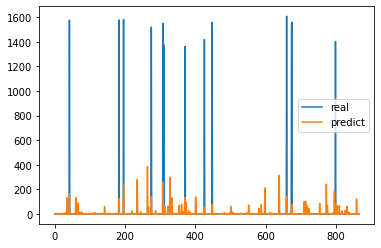

Epoch: 10; Test MAE loss on source data is: 32.345
Epoch: 10; Test MSE loss on source data is: 33681.144


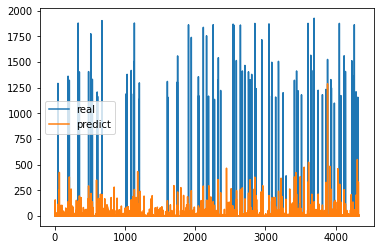

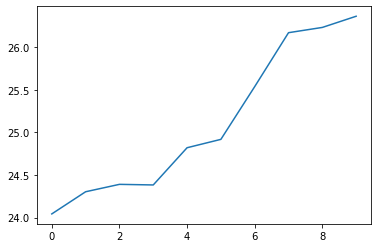

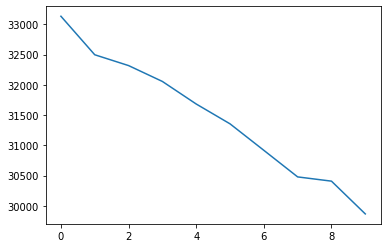

------------Domain Adaptation------------
Epoch: 0; MSE loss: 1834700.651
Epoch: 0; disc loss: 10404.683
Epoch: 0; ceod loss: 9368.716
29.90100753965606
28487.472872853294
Parameter containing:
tensor([0.2016, 0.1995, 0.1992, 0.2001, 0.1996], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 1714036.011
Epoch: 1; disc loss: 11830.947
Epoch: 1; ceod loss: 8829.014
27.14950977652543
29631.673449273727
Parameter containing:
tensor([0.2024, 0.1991, 0.1992, 0.1999, 0.1994], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 1901519.322
Epoch: 2; disc loss: 19139.697
Epoch: 2; ceod loss: 11525.775
28.231691733776078
29434.001679663616
Parameter containing:
tensor([0.2027, 0.1994, 0.1990, 0.1998, 0.1991], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 1708318.076
Epoch: 3; disc loss: 21994.909
Epoch: 3; ceod loss: 11000.029
30.02421429351986
28820.225980444866
Parameter containing:
tensor([0.2039, 0.1997, 0.1991, 0.1994, 0.1980], device='cuda:0',
  

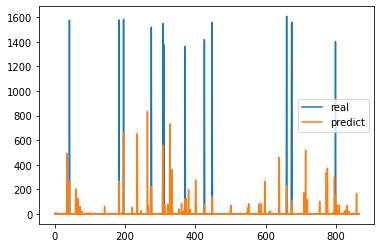

Epoch: 9; Test MAE loss on source data is: 33.311


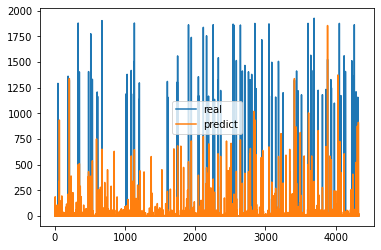

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


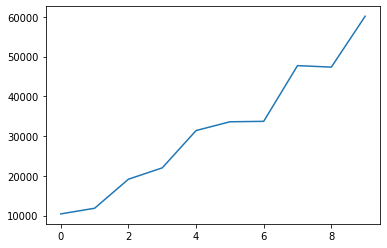

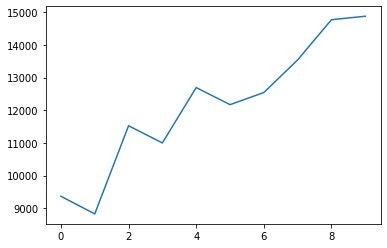

-------------------------- total running losses in 10 epoches as follows---------------------------------


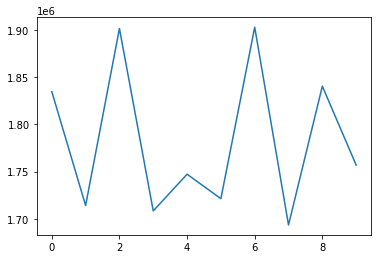

Epoch: 10; MSE loss: 1616719.231
Epoch: 10; disc loss: 68507.614
Epoch: 10; ceod loss: 14450.436
31.66120789167412
28889.961202268816
Parameter containing:
tensor([0.1913, 0.2148, 0.1943, 0.2100, 0.1896], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 1719053.838
Epoch: 11; disc loss: 81570.488
Epoch: 11; ceod loss: 15136.708
31.639349010567834
29983.01633166211
Parameter containing:
tensor([0.1880, 0.2178, 0.1954, 0.2114, 0.1875], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 1631718.461
Epoch: 12; disc loss: 59336.429
Epoch: 12; ceod loss: 13980.274
30.13835590597427
29354.296462924292
Parameter containing:
tensor([0.1854, 0.2204, 0.1956, 0.2121, 0.1865], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 1835466.485
Epoch: 13; disc loss: 103669.376
Epoch: 13; ceod loss: 14652.459
30.292989598099474
28844.44679499276
Parameter containing:
tensor([0.1829, 0.2244, 0.1944, 0.2132, 0.1851], device='cuda:0',
       requires_grad=True)
Epo

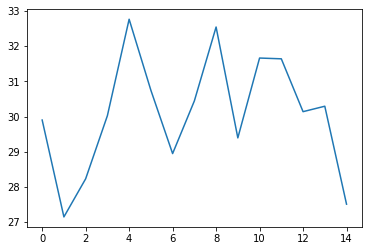

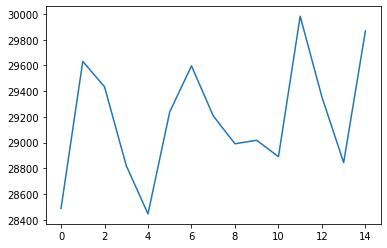

27.511377979658604
0.5972590156166451
0.9329365617647233
Parameter containing:
tensor([0.1797, 0.2291, 0.1936, 0.2136, 0.1840], device='cuda:0',
       requires_grad=True)


In [9]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [2]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.0001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
        lr = 0.0001
        lr1=0.000001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(2):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(2):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if stopT<29.5 and epoch>=10:
              break;
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)


 ----------------------------- 1 / 1 -----------------------------

---------------------------------------------- domain num 0 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 2451441.250
16.849274611747216
20539.840094065734
Epoch: 1; MSE loss: 2580037.000
16.885055378784084
19918.197135279257
Epoch: 2; MSE loss: 2341798.750
16.79753720054388
19262.65941684187
Epoch: 3; MSE loss: 2397861.750
17.056907971034036
18842.190745493204
Epoch: 4; MSE loss: 2271897.250
16.737387381416703
18479.00387965388
Epoch: 5; MSE loss: 2231915.250
17.74695581450388
18244.617374124417
Epoch: 6; MSE loss: 2338117.250
17.327634968377023
17603.185260647137
Epoch: 7; MSE loss: 2211121.000
17.09562702690957
17960.846905790364
Epoch: 8; MSE loss: 2182175.250
18.205079898805355
17002.33326834067
Epoch: 9; MSE loss: 1905138.250
17.590463287071373
17472.859421845413
Epoch: 10; Test MAE loss on target data is: 17.590
Epoch: 10; Test MSE loss on target data is: 

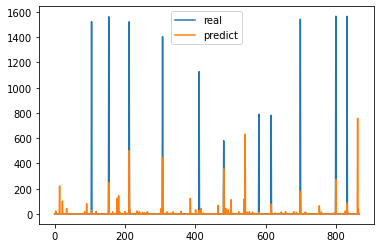

Epoch: 10; Test MAE loss on source data is: 30.992
Epoch: 10; Test MSE loss on source data is: 32998.239


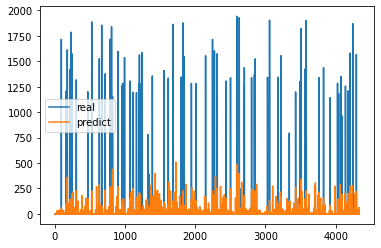

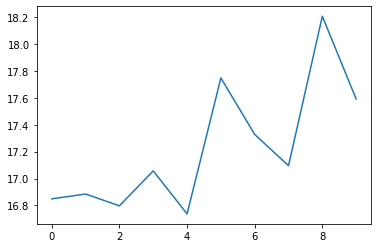

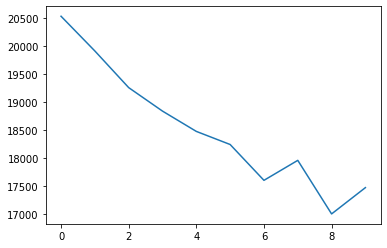

------------Domain Adaptation------------
Epoch: 0; MSE loss: 1854481.575
Epoch: 0; disc loss: 9206.250
Epoch: 0; ceod loss: 9803.432
19.036852347646274
16907.302340365175
Parameter containing:
tensor([0.2003, 0.2004, 0.1998, 0.1995, 0.2000], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 1899160.612
Epoch: 1; disc loss: 14995.956
Epoch: 1; ceod loss: 9872.891
18.91555216124726
17399.51218867813
Parameter containing:
tensor([0.2008, 0.2012, 0.1995, 0.1993, 0.1993], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 1866533.215
Epoch: 2; disc loss: 16504.866
Epoch: 2; ceod loss: 10104.792
19.659266105142983
17498.213362416416
Parameter containing:
tensor([0.2015, 0.2018, 0.1991, 0.1994, 0.1982], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 2011374.296
Epoch: 3; disc loss: 11517.219
Epoch: 3; ceod loss: 9563.934
19.645587846035227
17662.032871567146
Parameter containing:
tensor([0.2024, 0.2025, 0.1978, 0.1998, 0.1975], device='cuda:0',
   

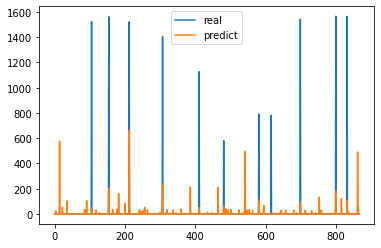

Epoch: 9; Test MAE loss on source data is: 32.699


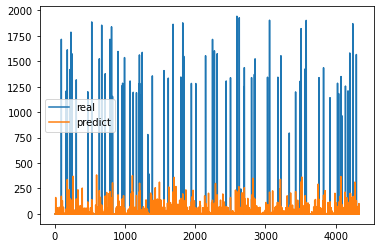

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


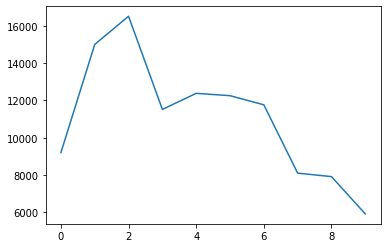

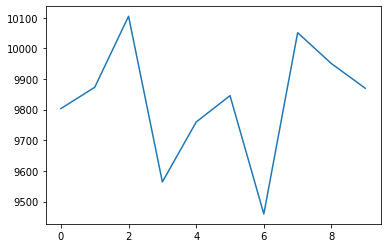

-------------------------- total running losses in 10 epoches as follows---------------------------------


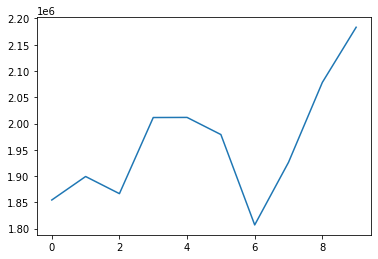

Epoch: 10; MSE loss: 2038848.972
Epoch: 10; disc loss: 8175.585
Epoch: 10; ceod loss: 10529.877
19.108179192235983
18096.674772599323
Parameter containing:
tensor([0.2160, 0.2087, 0.1744, 0.2035, 0.1975], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 2115723.091
Epoch: 11; disc loss: 5977.551
Epoch: 11; ceod loss: 9929.617
20.1912646249405
17767.84070108613
Parameter containing:
tensor([0.2188, 0.2104, 0.1689, 0.2028, 0.1990], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 2118098.402
Epoch: 12; disc loss: 5073.279
Epoch: 12; ceod loss: 10179.437
19.92864900425446
17760.59744095128
Parameter containing:
tensor([0.2221, 0.2130, 0.1630, 0.2011, 0.2009], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 2030858.800
Epoch: 13; disc loss: 4637.063
Epoch: 13; ceod loss: 9999.654
19.17796514767642
17931.109290935543
Parameter containing:
tensor([0.2261, 0.2154, 0.1567, 0.1994, 0.2024], device='cuda:0',
       requires_grad=True)
Epoch: 14; M

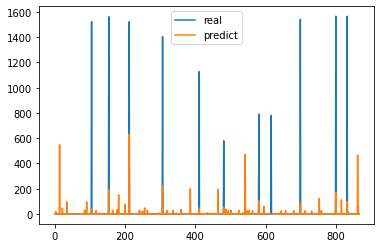

Epoch: 19; Test MAE loss on source data is: 32.071


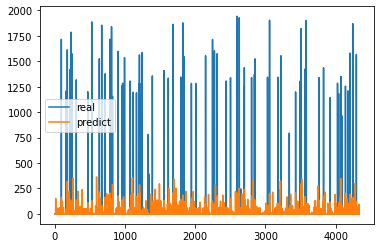

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


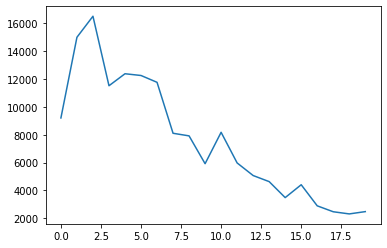

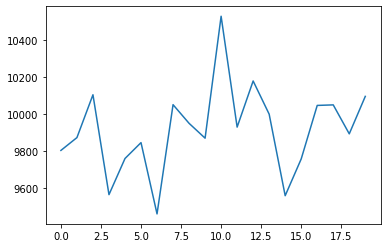

-------------------------- total running losses in 10 epoches as follows---------------------------------


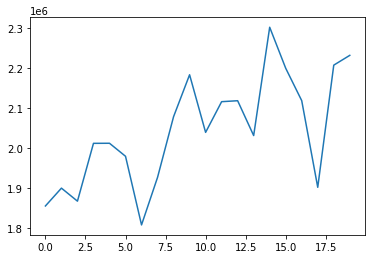

Epoch: 20; MSE loss: 2140106.191
Epoch: 20; disc loss: 1885.348
Epoch: 20; ceod loss: 10007.113
18.72387628824447
18287.60836131584
Parameter containing:
tensor([0.2734, 0.2460, 0.0821, 0.1751, 0.2234], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 2130765.836
Epoch: 21; disc loss: 1881.028
Epoch: 21; ceod loss: 10177.266
19.605110439565355
17886.236602634952
Parameter containing:
tensor([0.2767, 0.2534, 0.0692, 0.1709, 0.2297], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 2093269.535
Epoch: 22; disc loss: 1505.800
Epoch: 22; ceod loss: 9609.405
20.10178120597561
17747.840033221168
Parameter containing:
tensor([0.2759, 0.2619, 0.0568, 0.1681, 0.2373], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 2295111.396
Epoch: 23; disc loss: 1300.704
Epoch: 23; ceod loss: 9391.693
19.525716298093297
17874.520253379433
Parameter containing:
tensor([0.2732, 0.2710, 0.0440, 0.1658, 0.2460], device='cuda:0',
       requires_grad=True)
Epoch: 24

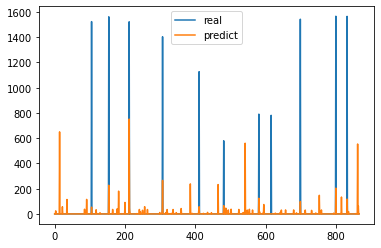

Epoch: 29; Test MAE loss on source data is: 33.189


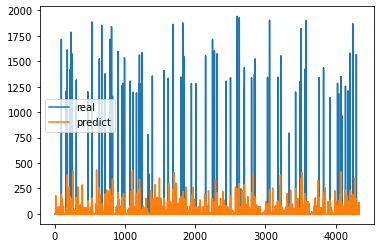

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


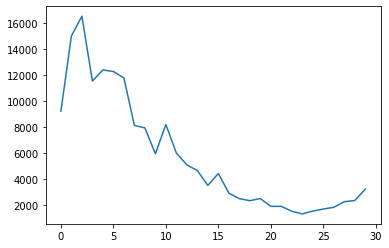

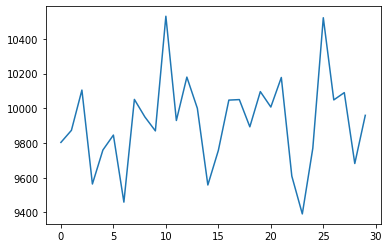

-------------------------- total running losses in 10 epoches as follows---------------------------------


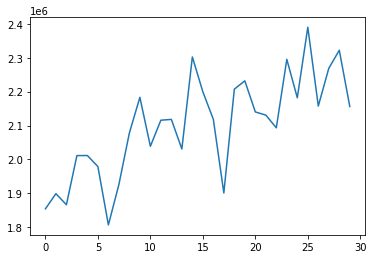

Epoch: 30; MSE loss: 2297172.924
Epoch: 30; disc loss: 2950.689
Epoch: 30; ceod loss: 9939.263
19.158576894074574
18009.766588190218
Parameter containing:
tensor([0.2379, 0.2951, 0.0200, 0.1770, 0.2700], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 2277932.737
Epoch: 31; disc loss: 3195.787
Epoch: 31; ceod loss: 9904.869
19.219756405512697
18036.830629426207
Parameter containing:
tensor([0.2332, 0.2955, 0.0200, 0.1814, 0.2698], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 2299976.539
Epoch: 32; disc loss: 4339.250
Epoch: 32; ceod loss: 10318.469
19.847702901153003
17756.28870438402
Parameter containing:
tensor([0.2296, 0.2945, 0.0200, 0.1865, 0.2694], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 2184641.284
Epoch: 33; disc loss: 4266.211
Epoch: 33; ceod loss: 10001.173
18.543242538766773
18506.497268441042
Parameter containing:
tensor([0.2267, 0.2921, 0.0200, 0.1921, 0.2691], device='cuda:0',
       requires_grad=True)
Epoch: 

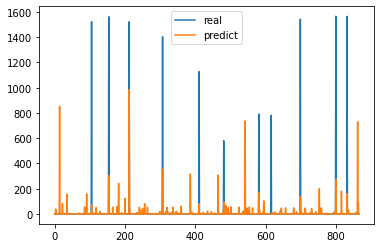

Epoch: 39; Test MAE loss on source data is: 36.158


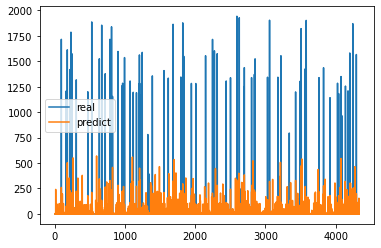

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


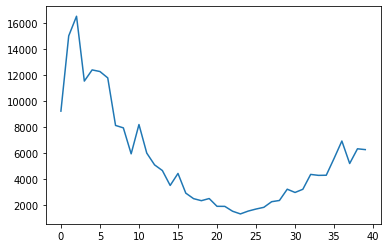

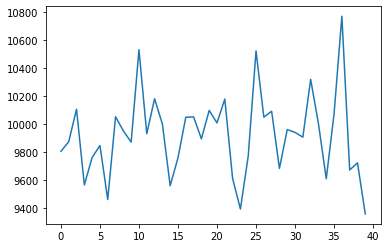

-------------------------- total running losses in 10 epoches as follows---------------------------------


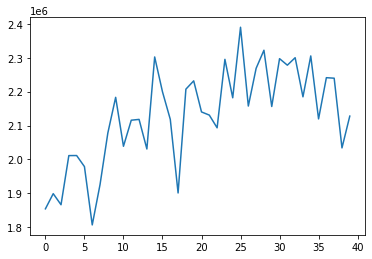

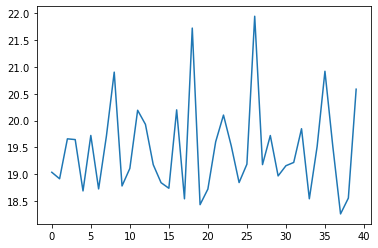

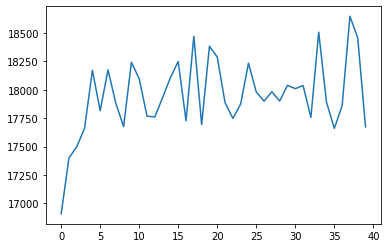

20.583761676045988
0.34406308195752605
0.8941307743029251
Parameter containing:
tensor([0.2053, 0.2813, 0.0200, 0.2328, 0.2605], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 3 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 2657813.500
25.88200313378031
32671.205126951267
Epoch: 1; MSE loss: 2762952.000
26.27018744813014
32035.909827811916
Epoch: 2; MSE loss: 2371483.000
26.293832901162723
31097.288752830267
Epoch: 3; MSE loss: 2356118.250
26.664939703999867
30099.47469152442
Epoch: 4; MSE loss: 2331954.750
26.659528047383485
29713.028116972848
Epoch: 5; MSE loss: 2280109.750
26.641218367401155
29386.44940400758
Epoch: 6; MSE loss: 2122647.250
26.55567905956486
29700.844618686635
Epoch: 7; MSE loss: 2379626.000
26.62795329176431
29431.08981097113
Epoch: 8; MSE loss: 2241871.000
27.27343855665904
28419.778860071314
Epoch: 9; MSE loss: 2337094.500
27.394234634910074
27856.99029

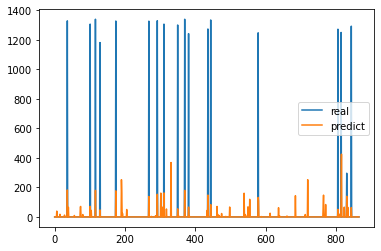

Epoch: 10; Test MAE loss on source data is: 28.699
Epoch: 10; Test MSE loss on source data is: 29739.189


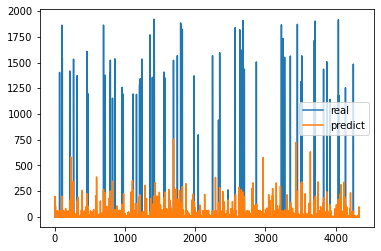

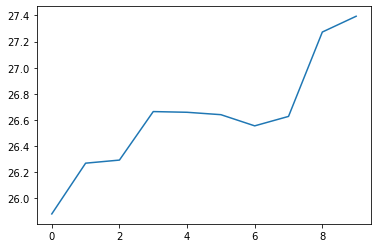

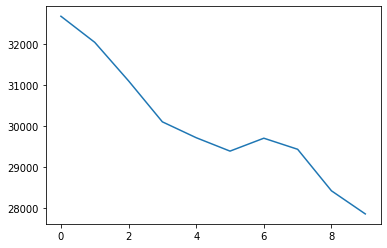

------------Domain Adaptation------------
Epoch: 0; MSE loss: 2101083.014
Epoch: 0; disc loss: 6217.733
Epoch: 0; ceod loss: 7665.342
28.79479329671277
28535.99836946156
Parameter containing:
tensor([0.2010, 0.1999, 0.1999, 0.1990, 0.2002], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 1899550.861
Epoch: 1; disc loss: 7564.958
Epoch: 1; ceod loss: 7223.914
28.97778062280074
29176.774818012913
Parameter containing:
tensor([0.2017, 0.1996, 0.2003, 0.1975, 0.2009], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 1968223.077
Epoch: 2; disc loss: 6901.144
Epoch: 2; ceod loss: 7437.768
28.658594217336162
29740.271869712033
Parameter containing:
tensor([0.2023, 0.1996, 0.2012, 0.1952, 0.2017], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 2031843.440
Epoch: 3; disc loss: 6183.653
Epoch: 3; ceod loss: 7206.005
29.00906186151257
29615.935438514356
Parameter containing:
tensor([0.2029, 0.1988, 0.2031, 0.1925, 0.2026], device='cuda:0',
       re

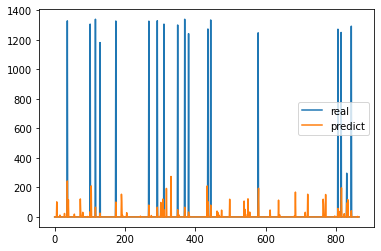

Epoch: 9; Test MAE loss on source data is: 30.881


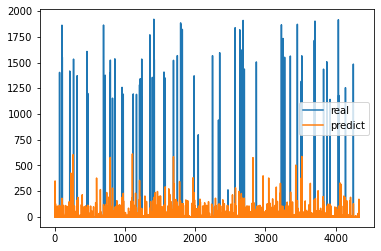

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


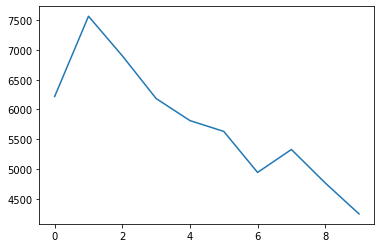

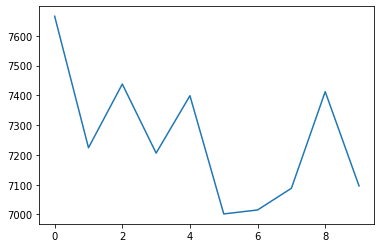

-------------------------- total running losses in 10 epoches as follows---------------------------------


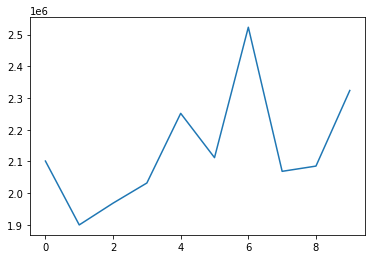

Epoch: 10; MSE loss: 2324730.748
Epoch: 10; disc loss: 3835.373
Epoch: 10; ceod loss: 7119.141
29.861105422591393
29232.42107096112
Parameter containing:
tensor([0.2082, 0.1955, 0.2133, 0.1720, 0.2110], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 2367447.335
Epoch: 11; disc loss: 3550.930
Epoch: 11; ceod loss: 6789.304
29.238079105711176
29611.817642735477
Parameter containing:
tensor([0.2088, 0.1956, 0.2145, 0.1684, 0.2127], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 2315535.501
Epoch: 12; disc loss: 3267.329
Epoch: 12; ceod loss: 7530.618
29.063584854953085
29720.829999933467
Parameter containing:
tensor([0.2096, 0.1963, 0.2154, 0.1648, 0.2139], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 2238968.609
Epoch: 13; disc loss: 3241.490
Epoch: 13; ceod loss: 7392.987
28.95620085529751
29797.95785342051
Parameter containing:
tensor([0.2107, 0.1971, 0.2162, 0.1609, 0.2151], device='cuda:0',
       requires_grad=True)
Epoch: 14; 

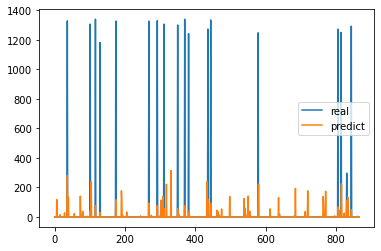

Epoch: 19; Test MAE loss on source data is: 32.304


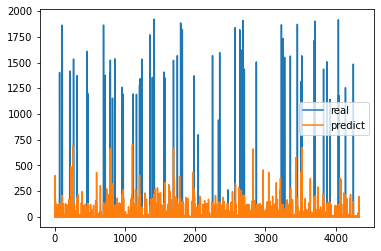

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


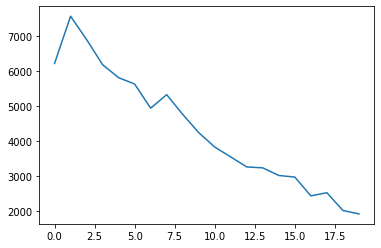

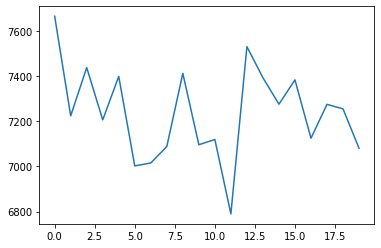

-------------------------- total running losses in 10 epoches as follows---------------------------------


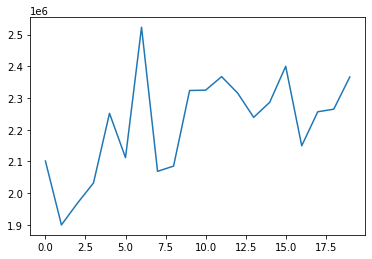

Epoch: 20; MSE loss: 2242052.650
Epoch: 20; disc loss: 1705.922
Epoch: 20; ceod loss: 7196.328
29.153711444955004
29668.244928936027
Parameter containing:
tensor([0.2133, 0.2142, 0.2280, 0.1192, 0.2252], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 1929541.347
Epoch: 21; disc loss: 1463.118
Epoch: 21; ceod loss: 7360.279
28.688818045140962
29983.8017800906
Parameter containing:
tensor([0.2137, 0.2188, 0.2299, 0.1103, 0.2273], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 2373899.122
Epoch: 22; disc loss: 1216.251
Epoch: 22; ceod loss: 7173.273
30.04937592349869
29127.703687949524
Parameter containing:
tensor([0.2134, 0.2239, 0.2323, 0.1012, 0.2293], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 2060168.027
Epoch: 23; disc loss: 1017.228
Epoch: 23; ceod loss: 7061.411
28.32342818595959
30267.501494251526
Parameter containing:
tensor([0.2130, 0.2299, 0.2341, 0.0917, 0.2313], device='cuda:0',
       requires_grad=True)
Epoch: 24; M

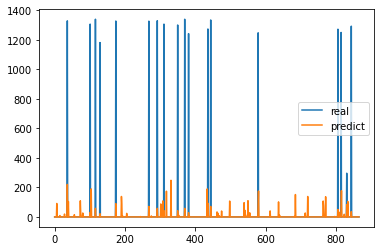

Epoch: 29; Test MAE loss on source data is: 29.766


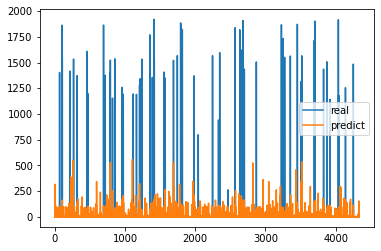

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


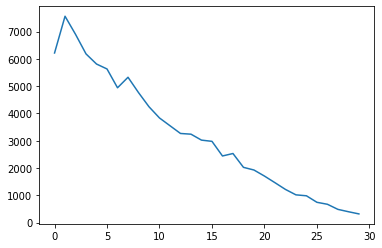

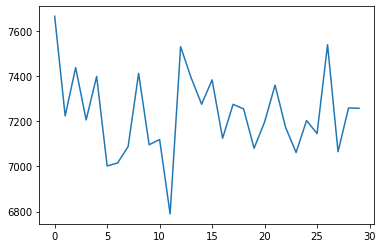

-------------------------- total running losses in 10 epoches as follows---------------------------------


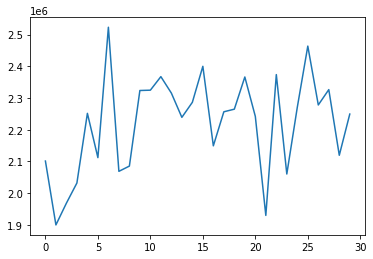

Epoch: 30; MSE loss: 2241110.752
Epoch: 30; disc loss: 316.344
Epoch: 30; ceod loss: 7409.883
29.58335689262776
29416.329351839824
Parameter containing:
tensor([0.2010, 0.2861, 0.2486, 0.0200, 0.2444], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 2604632.494
Epoch: 31; disc loss: 367.501
Epoch: 31; ceod loss: 7213.495
29.440507768140943
29476.11925782048
Parameter containing:
tensor([0.1972, 0.2845, 0.2513, 0.0200, 0.2470], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 2217988.773
Epoch: 32; disc loss: 439.424
Epoch: 32; ceod loss: 7599.659
28.710265387507047
29965.849765784424
Parameter containing:
tensor([0.1950, 0.2776, 0.2558, 0.0200, 0.2516], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 2551355.754
Epoch: 33; disc loss: 479.933
Epoch: 33; ceod loss: 7588.582
28.558905371229542
30080.329106252015
Parameter containing:
tensor([0.1944, 0.2672, 0.2613, 0.0200, 0.2570], device='cuda:0',
       requires_grad=True)
Epoch: 34; MSE

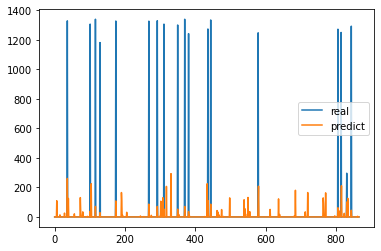

Epoch: 39; Test MAE loss on source data is: 31.629


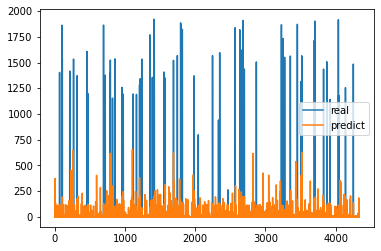

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


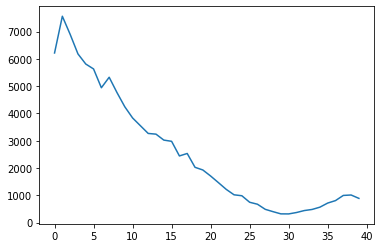

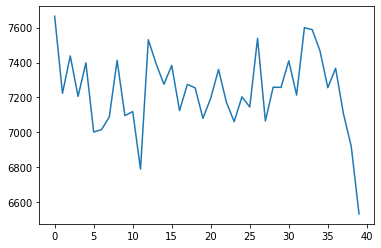

-------------------------- total running losses in 10 epoches as follows---------------------------------


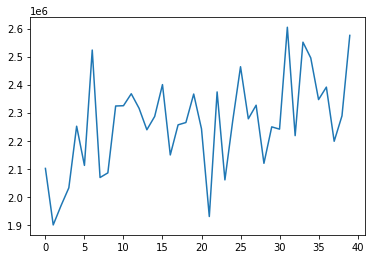

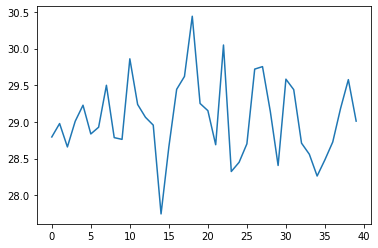

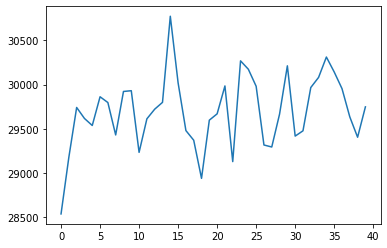

29.01086259458854
0.74123755847412
0.9502466024033187
Parameter containing:
tensor([0.2100, 0.1864, 0.2954, 0.0200, 0.2882], device='cuda:0',
       requires_grad=True)

---------------------------------------------- domain num 5 is running----------------------------------
------------Pre-training------------
Epoch: 0; MSE loss: 2384459.250
34.17807784061256
40442.19368599497
Epoch: 1; MSE loss: 2295472.500
34.580291770080656
40194.97421901308
Epoch: 2; MSE loss: 2493292.500
34.91465824368091
39449.01566841908
Epoch: 3; MSE loss: 2392505.250
35.73973836830679
38374.559456173374
Epoch: 4; MSE loss: 2173399.500
36.93744546109692
37633.222133484735
Epoch: 5; MSE loss: 2225804.250
37.53296893756007
36893.61488747217
Epoch: 6; MSE loss: 2295217.500
38.234728027130835
36549.201391547045
Epoch: 7; MSE loss: 2280358.750
36.60181999571338
37678.97103446295
Epoch: 8; MSE loss: 2181306.750
38.60238659136092
35681.26503411413
Epoch: 9; MSE loss: 2137739.250
40.03591452901614
34837.92121741859
Epo

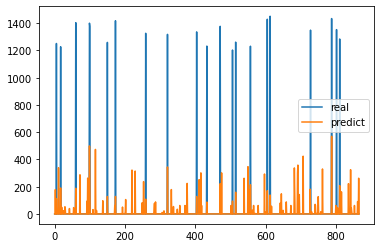

Epoch: 10; Test MAE loss on source data is: 31.366
Epoch: 10; Test MSE loss on source data is: 32968.602


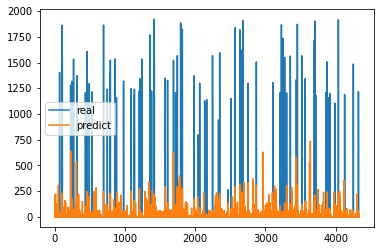

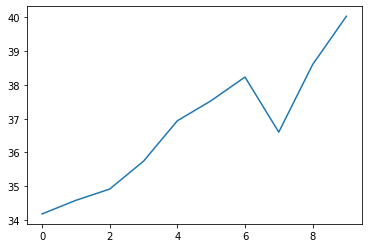

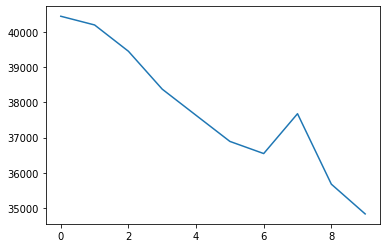

------------Domain Adaptation------------
Epoch: 0; MSE loss: 1644772.519
Epoch: 0; disc loss: 8840.425
Epoch: 0; ceod loss: 8621.991
42.59742502576855
34134.493524339436
Parameter containing:
tensor([0.2000, 0.1999, 0.2001, 0.2004, 0.1996], device='cuda:0',
       requires_grad=True)
Epoch: 1; MSE loss: 1584676.238
Epoch: 1; disc loss: 8342.040
Epoch: 1; ceod loss: 7816.440
39.524054330203256
35370.22056915494
Parameter containing:
tensor([0.2004, 0.2000, 0.1997, 0.2009, 0.1990], device='cuda:0',
       requires_grad=True)
Epoch: 2; MSE loss: 1876626.017
Epoch: 2; disc loss: 8335.741
Epoch: 2; ceod loss: 8062.331
41.1001651525463
34815.54159960529
Parameter containing:
tensor([0.2009, 0.2003, 0.1993, 0.2015, 0.1980], device='cuda:0',
       requires_grad=True)
Epoch: 3; MSE loss: 1876588.489
Epoch: 3; disc loss: 8002.341
Epoch: 3; ceod loss: 7671.908
40.926749909556584
34914.29665748573
Parameter containing:
tensor([0.2021, 0.2014, 0.1989, 0.2013, 0.1962], device='cuda:0',
       requ

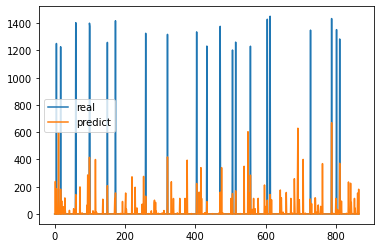

Epoch: 9; Test MAE loss on source data is: 34.153


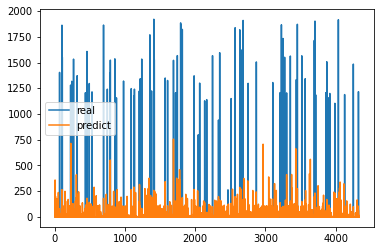

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


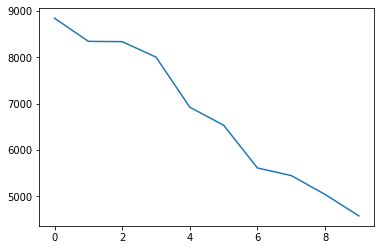

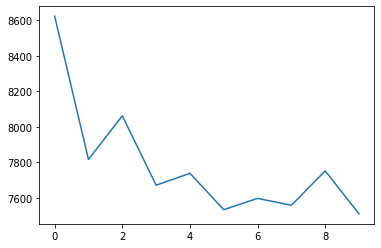

-------------------------- total running losses in 10 epoches as follows---------------------------------


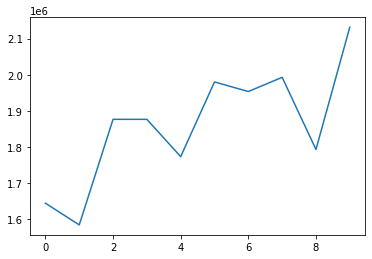

Epoch: 10; MSE loss: 2123622.884
Epoch: 10; disc loss: 4147.511
Epoch: 10; ceod loss: 7885.392
40.89215740888039
35096.754152623034
Parameter containing:
tensor([0.2067, 0.2128, 0.2026, 0.2146, 0.1634], device='cuda:0',
       requires_grad=True)
Epoch: 11; MSE loss: 1962500.924
Epoch: 11; disc loss: 3946.956
Epoch: 11; ceod loss: 7604.967
40.72384370665787
35115.28001540386
Parameter containing:
tensor([0.2058, 0.2164, 0.2048, 0.2166, 0.1564], device='cuda:0',
       requires_grad=True)
Epoch: 12; MSE loss: 2007408.666
Epoch: 12; disc loss: 3673.263
Epoch: 12; ceod loss: 7563.806
38.72642274068576
36067.70336792747
Parameter containing:
tensor([0.2054, 0.2202, 0.2071, 0.2191, 0.1482], device='cuda:0',
       requires_grad=True)
Epoch: 13; MSE loss: 1842464.184
Epoch: 13; disc loss: 2898.698
Epoch: 13; ceod loss: 7779.576
41.29794810315317
34912.69375643225
Parameter containing:
tensor([0.2053, 0.2247, 0.2093, 0.2213, 0.1394], device='cuda:0',
       requires_grad=True)
Epoch: 14; MSE 

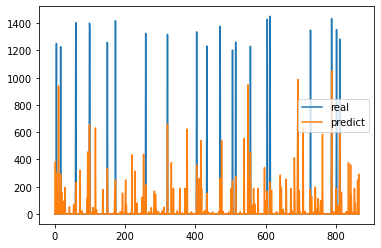

Epoch: 19; Test MAE loss on source data is: 41.265


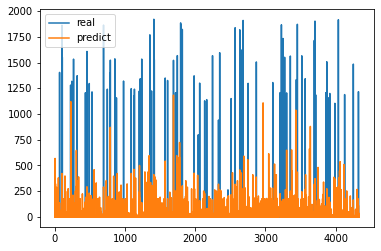

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


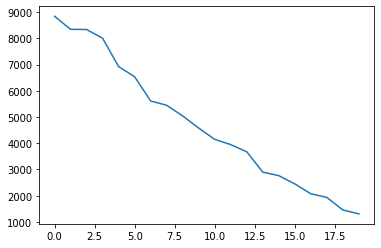

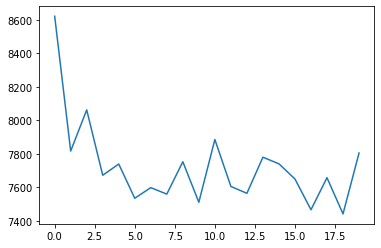

-------------------------- total running losses in 10 epoches as follows---------------------------------


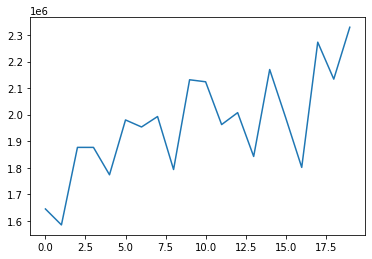

Epoch: 20; MSE loss: 1949029.613
Epoch: 20; disc loss: 1070.580
Epoch: 20; ceod loss: 7947.721
43.28305688734148
34409.09640503618
Parameter containing:
tensor([0.2050, 0.2723, 0.2287, 0.2355, 0.0585], device='cuda:0',
       requires_grad=True)
Epoch: 21; MSE loss: 1960985.421
Epoch: 21; disc loss: 887.279
Epoch: 21; ceod loss: 7683.049
41.93258977226801
34703.33057413819
Parameter containing:
tensor([0.2063, 0.2769, 0.2339, 0.2390, 0.0439], device='cuda:0',
       requires_grad=True)
Epoch: 22; MSE loss: 2046973.403
Epoch: 22; disc loss: 791.966
Epoch: 22; ceod loss: 7913.947
40.76811942585337
35092.18941773268
Parameter containing:
tensor([0.2084, 0.2792, 0.2403, 0.2437, 0.0284], device='cuda:0',
       requires_grad=True)
Epoch: 23; MSE loss: 1998158.396
Epoch: 23; disc loss: 652.254
Epoch: 23; ceod loss: 7654.386
41.56340668551547
34782.92184384638
Parameter containing:
tensor([0.2101, 0.2765, 0.2457, 0.2477, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 24; MSE loss

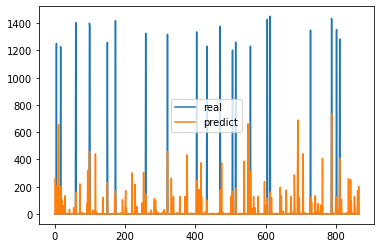

Epoch: 29; Test MAE loss on source data is: 35.613


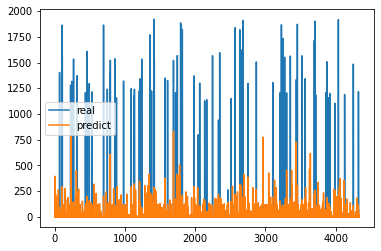

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


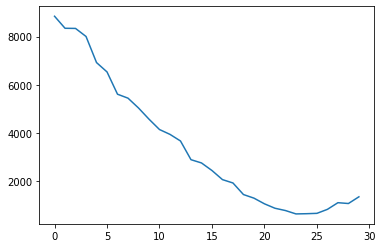

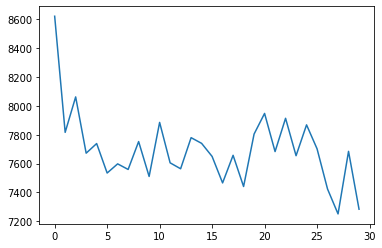

-------------------------- total running losses in 10 epoches as follows---------------------------------


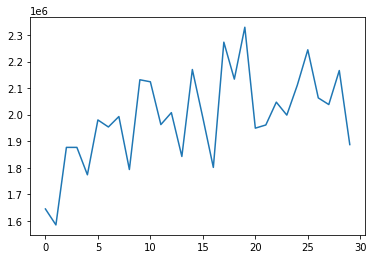

Epoch: 30; MSE loss: 2013093.428
Epoch: 30; disc loss: 1571.624
Epoch: 30; ceod loss: 7300.485
41.923934488560505
34726.59228858555
Parameter containing:
tensor([0.2351, 0.2009, 0.2637, 0.2802, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 31; MSE loss: 2010458.207
Epoch: 31; disc loss: 1786.830
Epoch: 31; ceod loss: 7409.799
41.27074220974209
34874.38266652974
Parameter containing:
tensor([0.2409, 0.1899, 0.2636, 0.2855, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 32; MSE loss: 1997117.336
Epoch: 32; disc loss: 1538.226
Epoch: 32; ceod loss: 7032.077
42.13874122263238
34632.40881187674
Parameter containing:
tensor([0.2470, 0.1799, 0.2624, 0.2908, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 33; MSE loss: 1890296.966
Epoch: 33; disc loss: 1563.566
Epoch: 33; ceod loss: 7149.825
41.9034031570439
34715.36176810199
Parameter containing:
tensor([0.2529, 0.1708, 0.2607, 0.2956, 0.0200], device='cuda:0',
       requires_grad=True)
Epoch: 34; MSE l

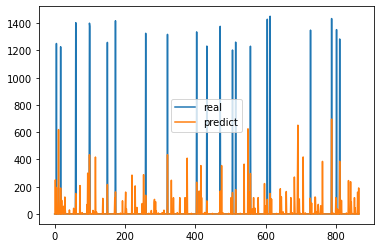

Epoch: 39; Test MAE loss on source data is: 34.771


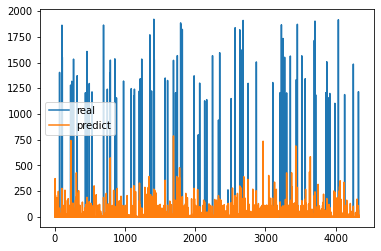

--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------


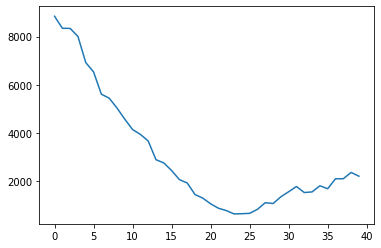

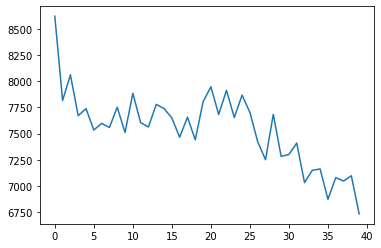

-------------------------- total running losses in 10 epoches as follows---------------------------------


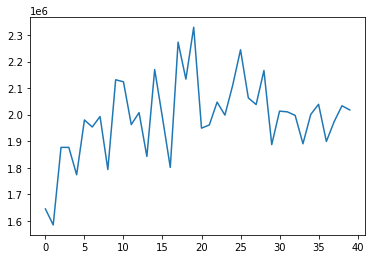

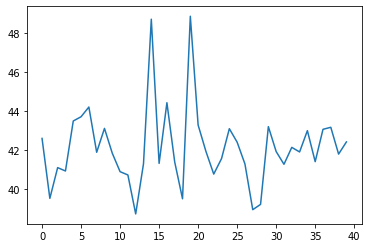

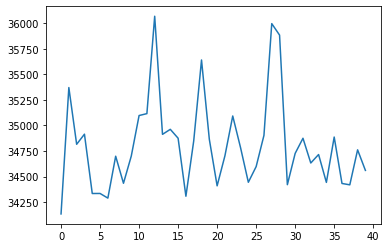

42.41755461080522
0.34826758092317334
0.8969576333217334
Parameter containing:
tensor([0.2809, 0.1233, 0.2492, 0.3265, 0.0200], device='cuda:0',
       requires_grad=True)


In [ ]:
import importlib
# import models.hdisc_msda 
# importlib.reload(models.hdisc_msda)
# from models.hdisc_msda import Disc_MSDANet
import matplotlib.pyplot as plt

#Number of experiments to launch
num_data_sets=len(fileList)
num_domains=num_data_sets-1
nb_experiments = 1

#-np.inf
params= {'input_dim': 19, 'output_dim': 1, 'n_sources': num_data_sets-1, 'loss': torch.nn.MSELoss(),
         'weighted_loss': weighted_mse, 'min_pred': 0, 'max_pred': np.inf}

#Number of epochs
epochs_pretrain, epochs_adapt =10,40

for exp in range(nb_experiments):
    print('\n ----------------------------- %i / %i -----------------------------'%(exp+1, nb_experiments))
    mse_list, mae_list =  {}, {}
    alphas = {}
    for i in [0,3,5]:
        print('\n---------------------------------------------- domain num %i is running----------------------------------'%(i))
        # Build source instances.
        source_insts = []
        source_labels = []
        for j in range(num_data_sets):
            if j != i:
                source_insts.append(data_insts[j])
                source_labels.append(data_labels[j])
        # Build target instances.
        target_idx = i
        target_insts = data_insts[i]
        target_labels = data_labels[i]
        target_insts0, X_t, target_labels0, y_t =train_test_split(target_insts, target_labels, test_size=0.2,random_state=100)
        X_t= X_t.reshape(X_t.shape[0],1, X_t.shape[1])
        X_t = torch.tensor(X_t, requires_grad=False).type(torch.FloatTensor).to(device)
        
        X=np.concatenate(source_insts, axis=0)
        Y=np.concatenate(source_labels, axis=0)
        
        x_train_all, x_test, y_train_all, y_test =train_test_split(X, Y, test_size=0.2,random_state=100)
        x_test= x_test.reshape(x_test.shape[0],1, x_test.shape[1])
        x_test = torch.tensor(x_test, requires_grad=False).type(torch.FloatTensor).to(device)
        
        ############################# Build and define model ####################################
        params['feature_extractor'] = get_feature_extractor()
        params['h_pred'] = get_predictor(output_dim=1)
        params['h_disc'] = get_discriminator(num_domains, output_dim=1)
        model = Disc_MSDANet(params).to(device)

#         #Pre-training
        print('------------Pre-training------------')
        lr = 0.0001
        lr1=0.00001
        batch_size =64
        b1=0.99
        b2=0.999
#         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
#         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
        opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
        opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
        opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
        opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
        opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
        opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
        model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        mae_loss,mse_loss=[],[]
        for epoch in range(epochs_pretrain):
            running_loss=0.0
            model.train()
#             input_sizes = [data.shape[0] for data in source_insts]
#             max_input_size = max(input_sizes)
#             K=int(max_input_size/batch_size)
#             print('K value is:', K)

            loader = multi_data_loader(source_insts, source_labels, batch_size)
    
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_t = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)
                loss_pred = model.train_prediction(x_bs, x_t, y_bs, clip=1, pred_only=False)
#                 print("predictor is:", model.h_pred.weight.data) 
                running_loss+=loss_pred
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            model.eval()
            prediction=model.predict(X_t).cpu().detach().numpy()
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            if (epoch+1)%10==0:
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
#                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                reg_mse = get_mse(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on target data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()
                
                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                reg_mse = get_mse(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch+1, reg_loss))
                print('Epoch: %i; Test MSE loss on source data is: %.3f'%(epoch+1, reg_mse))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
        
        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()        
     
                
        print('------------Domain Adaptation------------')
        disc_losslist, ceod_losslist, loss_list=[],[],[]
        mae_loss,mse_loss=[],[]
#         lr = 0.0001
#         lr1=0.000001
#         batch_size =64
#         b1=0.99
#         b2=0.999
# #         opt_feat=torch.optim.SGD([{'params': model.feature_extractor.parameters()}], lr=0.0001, momentum=0.8)
# #         opt_pred=torch.optim.SGD([{'params': model.h_pred.parameters()}], lr=0.0001, momentum=0.8)
#         opt_feat = torch.optim.Adam([{'params': model.feature_extractor.parameters()}],lr=lr,betas=(b1, b2))
#         opt_pred = torch.optim.Adam([{'params': model.h_pred.parameters()}],lr=lr,betas=(b1, b2))
#         opt_disc = torch.optim.Adam([{'params': model.h_disc.parameters()}],lr=lr,betas=(b1, b2))
#         opt_alpha = torch.optim.Adam([{'params': model.alpha}],lr=lr,betas=(b1, b2))
#         opt_mu = torch.optim.Adam([{'params': model.mu}],lr=lr,betas=(b1, b2))
#         opt_beta = torch.optim.Adam([{'params': model.beta}],lr=lr,betas=(b1, b2))
#         model.optimizers(opt_feat, opt_pred, opt_disc, opt_alpha,opt_mu,opt_beta)
        
        for epoch in range(epochs_adapt):
            running_loss = 0.0
            discloss = 0.0
            ceodloss = 0.0
            model.train()
            loader = multi_data_loader(source_insts, source_labels, batch_size)
            for x_bs, y_bs in loader:
                for j in range(num_domains):
                    x_bs[j]= x_bs[j].reshape(x_bs[j].shape[0],1,x_bs[j].shape[1])
                    x_bs[j] = torch.tensor(x_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)
                    y_bs[j] = torch.tensor(y_bs[j], requires_grad=False).type(torch.FloatTensor).to(device)                 
                ridx = np.random.choice(target_insts.shape[0], batch_size)
                tinputs = target_insts[ridx, :]
                tinputs= tinputs.reshape(tinputs.shape[0],1,tinputs.shape[1])
                x_bt = torch.tensor(tinputs, requires_grad=False).type(torch.FloatTensor).to(device)

                #Train h to minimize source loss

            #stage 1
                for a in range(1):
                    disc_loss1 = model.train_disc(x_bs, x_bt, y_bs, clip=1)
                for b in range(1):
                    loss,source_loss,disc_loss=model.train_all_feat(x_bs, x_bt, y_bs, clip=1)
#                     print("extractor is:", model.feature_extractor[5][0].weight) 
#                     print("discriminator is ", model.h_disc[0].weight.data)
#                     print("Hybrid loss is ", loss)
            #stage 2  
               # loss,source_loss,ceod_loss,disc_loss=model.train_all(x_bs, x_bt, y_bs, clip=1)
            #maximize discrepancy by opt_disc
#                 print("###############finish test########################")
                for c in range(2):
                    loss,source_loss,ceod_loss=model.train_all_pred(x_bs, x_bt, y_bs, clip=1)
                for d in range(2):
                    disc_loss=model.train_all_alpha(x_bs, x_bt, y_bs, clip=1)
#                     print("predictor is ", model.h_pred.weight.data)
                running_loss += loss.item()
                discloss += disc_loss.item()
                ceodloss+=ceod_loss.item()
            loss_list.append(running_loss)
            disc_losslist.append(discloss)
            ceod_losslist.append(ceodloss)
            print('Epoch: %i; MSE loss: %.3f'%(epoch, running_loss))
            print('Epoch: %i; disc loss: %.3f'%(epoch, discloss))
            print('Epoch: %i; ceod loss: %.3f'%(epoch, ceodloss))
            model.eval()
#             print(X_t)
            prediction=model.predict(X_t).cpu().detach().numpy()
#             print(prediction)
            stopT=get_mae(y_t, prediction)
            mae_loss.append(stopT)
            print(stopT)
            cur_loss=get_mse(y_t, prediction)
            mse_loss.append(cur_loss)
            print(cur_loss)
            print(model.alpha)
            if (epoch+1)%10==0:
                print('--------------------------results as follows ---------------------------------')
                model.eval()
                prediction=model.predict(X_t).cpu().detach().numpy()
        #                 source_loss, disc = model.compute_loss(x_bs, X_t, y_s)
                reg_loss = get_mae(y_t, prediction)
                print('Epoch: %i; Test MAE loss on target data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(X_t)), y_t, label='real')
                plt.plot(range(len(X_t)),prediction, label='predict')
                plt.legend()               
                plt.show()

                prediction=model.predict(x_test).cpu().detach().numpy()
                reg_loss = get_mae(y_test, prediction)
                print('Epoch: %i; Test MAE loss on source data is: %.3f'%(epoch, reg_loss))
                plt.plot(range(len(x_test)), y_test, label='real')
                plt.plot(range(len(x_test)),prediction, label='predict')
                plt.legend()               
                plt.show()
            if (epoch+1)%10==0:
                print('--------------------------regression discrepency and conditional MMD in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),disc_losslist,label='discripency')
                plt.show()
                plt.plot(range(len(loss_list)),ceod_losslist,label='CEOD loss')
                plt.show()
                print('-------------------------- total running losses in 10 epoches as follows---------------------------------')
                plt.plot(range(len(loss_list)),loss_list,label='Total_loss')
                plt.show()

        plt.plot(range(len(mae_loss)),mae_loss,label='loss converage')
        plt.show()
        plt.plot(range(len(mse_loss)),mse_loss,label='loss converage')
        plt.show()
        model.eval()
        prediction=model.predict(X_t).cpu().detach().numpy()
        stopT=get_mae(y_t, prediction)
        print(stopT)
        print(get_sae(y_t, prediction))
        print(get_nde(y_t, prediction))
        print(model.alpha)